In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import json
import plotly.express as px
from plotly.subplots import make_subplots
from plotly.graph_objs import *
from PIL import Image
import plotly.graph_objects as go

from nltk.corpus import stopwords
import string
from nltk.tokenize import word_tokenize
from textblob import TextBlob
import re
from datetime import datetime
import plotly.io as pio
pio.templates.default = "simple_white"


from wordcloud import WordCloud,STOPWORDS,ImageColorGenerator
stopwords = set(STOPWORDS)

from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.api import VAR
from scipy.stats import pearsonr
from sklearn.preprocessing import StandardScaler, MinMaxScaler
import statsmodels.api as sm
from statsmodels.tsa.vector_ar.vecm import select_order, select_coint_rank, VECM
from statsmodels.tsa.vector_ar.vecm import coint_johansen

from statsmodels.tsa.stattools import grangercausalitytests
from statsmodels.tsa.stattools import adfuller

warnings.filterwarnings("ignore")

In [2]:
# Read all four files into pandas dataframes
#fresnoTweetData = pd.read_csv("Fresno.csv")
#santaClaraTweetData = pd.read_csv("SantaClara.csv")
#SFOTweetData = pd.read_csv("SanFrancisco.csv")
#contraCostaTweetData =  pd.read_csv("ContraCosta.csv")

# Create a list of the files in order you want them appended
#all_df_list = [fresnoTweetData, santaClaraTweetData, SFOTweetData, contraCostaTweetData]

# Merge all the dataframes in all_df_list
# Pandas will automatically append based on similar column names
#appended_df = pd.concat(all_df_list)

# Write the appended dataframe to an excel file
# Add index=False parameter to not include row numbers


#appended_df.to_csv("TweetData.csv", index=False)

In [3]:
tweetData = pd.read_csv("TweetData.csv")

In [4]:
tweetData.head()

,County,contributors,coordinates,created_at,display_text_range,entities,extended_entities,extended_tweet,favorite_count,favorited,...,quoted_status_id,quoted_status_id_str,quoted_status_permalink,reply_count,retweet_count,retweeted,source,text,truncated,user
0,Fresno,NaN,NaN,2020-08-30 23:44:00+00:00,"[117, 140]","{'hashtags': [], 'urls': [{'url': 'https://t.c...",NaN,"{'full_text': ""@castlekitten47 @stellapocecili...",13,False,...,[{'tag': None}],NaN,NaN,0,5,False,"<a href=""http://twitter.com/download/iphone"" r...",@castlekitten47 @stellapocecilia @MDegen55 @an...,True,"{'id': 45782222, 'id_str': '45782222', 'name':..."
1,Fresno,NaN,NaN,2020-08-30 20:02:52+00:00,NaN,"{'hashtags': [], 'urls': [], 'user_mentions': ...",NaN,NaN,0,False,...,[{'tag': None}],NaN,NaN,1,0,False,"<a href=""http://twitter.com/download/iphone"" r...",Clovis people fr just don’t care about the glo...,False,"{'id': 920732304753823744, 'id_str': '92073230..."
2,Fresno,NaN,NaN,2020-08-30 18:36:17+00:00,NaN,"{'hashtags': [], 'urls': [], 'user_mentions': ...",NaN,NaN,3,False,...,[{'tag': None}],NaN,NaN,0,0,False,"<a href=""http://twitter.com/download/iphone"" r...",Since covid me and my mom watch our church wor...,False,"{'id': 382469457, 'id_str': '382469457', 'name..."
3,Fresno,NaN,NaN,2020-08-30 18:30:09+00:00,NaN,"{'hashtags': [], 'urls': [{'url': 'https://t.c...",NaN,{'full_text': 'Another MLB game has now been c...,0,False,...,[{'tag': None}],NaN,NaN,0,0,False,"<a href=""http://twitter.com/download/iphone"" r...",Another MLB game has now been cancelled after ...,True,"{'id': 3052997694, 'id_str': '3052997694', 'na..."
4,Fresno,NaN,NaN,2020-08-30 18:21:18+00:00,NaN,"{'hashtags': [], 'urls': [{'url': 'https://t.c...",NaN,{'full_text': 'It’s amazing how a global pande...,58,False,...,[{'tag': None}],NaN,NaN,4,3,False,"<a href=""http://twitter.com/download/iphone"" r...",It’s amazing how a global pandemic helps me se...,True,"{'id': 154337821, 'id_str': '154337821', 'name..."


In [5]:
tweetData.columns

Index(['County', 'contributors', 'coordinates', 'created_at',
       'display_text_range', 'entities', 'extended_entities', 'extended_tweet',
       'favorite_count', 'favorited', 'filter_level', 'geo', 'id', 'id_str',
       'in_reply_to_screen_name', 'in_reply_to_status_id',
       'in_reply_to_status_id_str', 'in_reply_to_user_id',
       'in_reply_to_user_id_str', 'is_quote_status', 'lang', 'matching_rules',
       'place', 'possibly_sensitive', 'quote_count', 'quoted_status',
       'quoted_status_id', 'quoted_status_id_str', 'quoted_status_permalink',
       'reply_count', 'retweet_count', 'retweeted', 'source', 'text',
       'truncated', 'user'],
      dtype='object')

In [6]:
tweetData.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 73732 entries, 0 to 73731
Data columns (total 36 columns):
County                       73732 non-null object
contributors                 47656 non-null object
coordinates                  6232 non-null object
created_at                   73732 non-null object
display_text_range           52395 non-null object
entities                     73732 non-null object
extended_entities            20340 non-null object
extended_tweet               57530 non-null object
favorite_count               73732 non-null object
favorited                    73732 non-null object
filter_level                 73455 non-null object
geo                          49345 non-null object
id                           73732 non-null object
id_str                       73732 non-null object
in_reply_to_screen_name      22962 non-null object
in_reply_to_status_id        55831 non-null object
in_reply_to_status_id_str    21117 non-null object
in_reply_to_user_id      

In [7]:
# dropping extra columns
tweetData.drop(['id', 'id_str', 'display_text_range', 'source', 'truncated', 'in_reply_to_status_id', 'in_reply_to_status_id_str',
       'in_reply_to_user_id', 'in_reply_to_user_id_str', 'in_reply_to_screen_name', 'user', 'geo',
       'coordinates', 'place', 'contributors', 'is_quote_status', 'extended_tweet', 'quote_count',
       'reply_count', 'retweet_count', 'favorite_count', 'entities', 'favorited', 'retweeted', 'filter_level', 'lang', 'matching_rules',
       'quoted_status_id', 'quoted_status_id_str', 'quoted_status', 'quoted_status_permalink', 'possibly_sensitive', 'extended_entities'], axis=1, inplace=True)

In [8]:
tweetData.head()

,County,created_at,text
0,Fresno,2020-08-30 23:44:00+00:00,@castlekitten47 @stellapocecilia @MDegen55 @an...
1,Fresno,2020-08-30 20:02:52+00:00,Clovis people fr just don’t care about the glo...
2,Fresno,2020-08-30 18:36:17+00:00,Since covid me and my mom watch our church wor...
3,Fresno,2020-08-30 18:30:09+00:00,Another MLB game has now been cancelled after ...
4,Fresno,2020-08-30 18:21:18+00:00,It’s amazing how a global pandemic helps me se...


In [9]:
tweetData.describe()

,County,created_at,text
count,73732,73732,73732
unique,4,50896,51096
top,Contra Costa,2020-03-21 10:00:24+00:00,Law &amp; Order: SVU Will Address the George F...
freq,32744,6,6


#### Tweet count API

In [10]:
#data_JSON1 = pd.read_json("SantaClara_tweets_count.json", lines=True, orient=str)
#data1 = data_JSON1.to_csv ("SantaClara_tweets_count.csv", index = None)

#data_JSON2 = pd.read_json("Fresno_tweets_count.json", lines=True, orient=str)
#data2 = data_JSON2.to_csv ("Fresno_tweets_count.csv", index = None)

#data_JSON3 = pd.read_json("SFO_tweets_count.json", lines=True, orient=str)
#data3 = data_JSON3.to_csv ("SFO_tweets_count.csv", index = None)

#data_JSON4 = pd.read_json("ContraCosta_tweets_count.json", lines=True, orient=str)
#data4 = data_JSON4.to_csv ("ContraCosta_tweets_count.csv", index = None)

In [11]:
santaClaraTweetDataCount = pd.read_csv("SantaClara_tweets_count.csv")
santaClaraTweetDataCount.columns
fresnoTweetDataCount = pd.read_csv("Fresno_tweets_count.csv")
fresnoTweetDataCount.columns
SFOTweetDataCount = pd.read_csv("SFO_tweets_count.csv")
SFOTweetDataCount.columns
contraCostaTweetDataCount = pd.read_csv("ContraCosta_tweets_count.csv")
contraCostaTweetDataCount.columns

Index(['timePeriod', 'count'], dtype='object')

In [12]:
# Merged data from API
dataTweetCount = pd.read_csv("TweetCountData.csv")
dataTweetCount.columns

Index(['timePeriod', 'count'], dtype='object')

In [13]:
dataTweetCount.head()

,timePeriod,count
0,202003010000,116
1,202003020000,136
2,202003030000,205
3,202003040000,199
4,202003050000,220


In [14]:
dataTweetCount.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 182 entries, 0 to 181
Data columns (total 2 columns):
timePeriod    182 non-null int64
count         182 non-null int64
dtypes: int64(2)
memory usage: 3.0 KB


In [15]:
dataTweetCount.describe().to_csv("mydes.csv")

### Case count

In [16]:
santaClaraCaseCount = pd.read_excel("SantaClara_Case_Count.xlsx")
sfoCaseCount = pd.read_excel("SanFrancisco_Case_Count.xlsx")
contraCostaCaseCount = pd.read_excel("ContraCosta_Case_Count.xlsx")
fresnoCaseCount = pd.read_excel("Fresno_Case_Count.xlsx")
fresnoCaseCount.head()

,county,totalcountconfirmed,totalcountdeaths,newcountconfirmed,newcountdeaths,date,Total counts,total death
0,Fresno,3,0,3,0,2020-03-18,25542,290
1,Fresno,6,0,3,0,2020-03-19,25542,290
2,Fresno,7,0,1,0,2020-03-20,25542,290
3,Fresno,8,0,1,0,2020-03-21,25542,290
4,Fresno,8,0,0,0,2020-03-22,25542,290


In [17]:
# Case count merged.
totalCaseCount = pd.read_excel("TotalCaseCount.xlsx")

In [18]:
totalCaseCount.head()

,date,Cases,Death
0,2020-03-18T00:00:00,263,6
1,2020-03-19T00:00:00,52,2
2,2020-03-20T00:00:00,77,1
3,2020-03-21T00:00:00,53,2
4,2020-03-22T00:00:00,60,3


In [19]:
totalCaseCount.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 187 entries, 0 to 186
Data columns (total 3 columns):
date     187 non-null object
Cases    187 non-null int64
Death    187 non-null int64
dtypes: int64(2), object(1)
memory usage: 4.5+ KB


In [20]:
totalCaseCount.describe()

,Cases,Death
count,187.000000,187.000000
mean,385.962567,4.593583
std,345.701023,5.248201
min,21.000000,-1.000000
25%,114.000000,2.000000
50%,227.000000,3.000000
75%,637.000000,6.000000
max,1809.000000,30.000000


### Preprocessing the text

In [21]:
# Tokenizing and Removing special charactors
for i in range(tweetData.shape[0]) :
    tweetData['text'][i] = ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)|(#[A-Za-z0-9]+)", " ", tweetData['text'][i]).split()).lower()
tweetData['text'].head()

0                                 lynne really64 degen
1    clovis people fr just don t care about the glo...
2    since covid me and my mom watch our church wor...
3    another mlb game has now been cancelled after ...
4    it s amazing how a global pandemic helps me se...
Name: text, dtype: object

In [22]:
#Removing Stop Words
tweetData['text'] = tweetData['text'].apply(lambda tweets: ' '.join([word for word in tweets.split() if word not in stopwords]))


### Data Visualization and Content Analysis

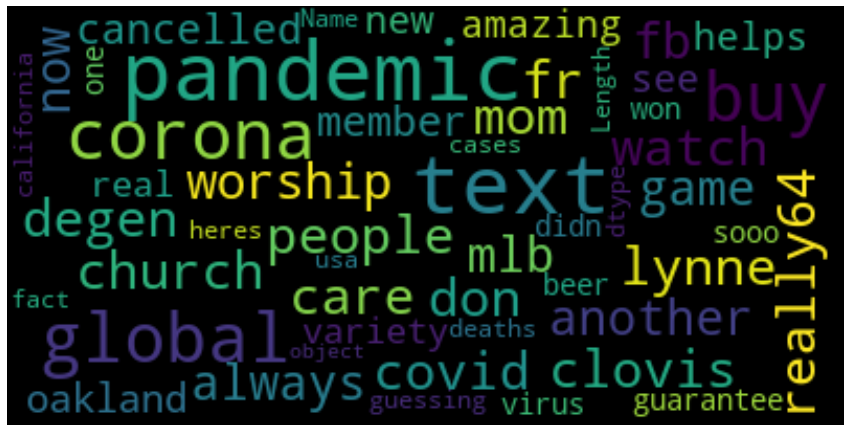

In [23]:
def show_wordcloud(data , title = None):
    wordcloud = WordCloud(background_color='black',stopwords=stopwords,max_words=200,max_font_size=40).generate(str(data))
  
    fig = plt.figure(1, figsize=(15, 15))
    plt.axis('off')
    plt.title(title, size = 25)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.show()

show_wordcloud(tweetData['text'])

In [24]:
mask = np.array(Image.open('twitter.png'))
image_colors = ImageColorGenerator(mask)

def show_wordcloudImage(data , title = None):
    wordcloud = WordCloud(background_color='white',
                          stopwords=stopwords,
                          mask=mask,
                          color_func = image_colors,
                          max_words=200,
                          max_font_size=40).generate(str(data))
  
    fig = plt.figure(1, figsize=(15, 15))
    plt.axis('off')
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title("Tweet world cloud")
    plt.show()


### Sentiment Analysis

In [25]:
tweetData['sentiment'] = ' '
tweetData['polarity'] = None
for i,tweets in enumerate(tweetData['text']) :
    #tweets = ' '.join(clean_list(tweets))
    blob = TextBlob(tweets)
    tweetData['polarity'][i] = blob.sentiment.polarity
    if blob.sentiment.polarity > 0 :
        tweetData['sentiment'][i] = 'positive'
    elif blob.sentiment.polarity < 0 :
        tweetData['sentiment'][i] = 'negative'
    else :
        tweetData['sentiment'][i] = 'neutral'
tweetData.head()

,County,created_at,text,sentiment,polarity
0,Fresno,2020-08-30 23:44:00+00:00,lynne really64 degen,neutral,0
1,Fresno,2020-08-30 20:02:52+00:00,clovis people fr don t care global pandemic an...,neutral,0
2,Fresno,2020-08-30 18:36:17+00:00,covid mom watch church worship fb always text ...,positive,0.7
3,Fresno,2020-08-30 18:30:09+00:00,another mlb game now cancelled member oakland ...,negative,-0.0863636
4,Fresno,2020-08-30 18:21:18+00:00,s amazing global pandemic helps see text new w...,positive,0.245455


In [26]:
print(tweetData["sentiment"].value_counts())

positive    29636
neutral     29398
negative    14698
Name: sentiment, dtype: int64


In [27]:
#sns.countplot(x='sentiment', data = tweetData);

s = tweetData["sentiment"].value_counts()
new = pd.DataFrame({"Sentiment":s.index, "Count":s.values}) 

fig = px.bar(new, x="Sentiment", y="Count", title="Sentiment Distribution")
fig.show()

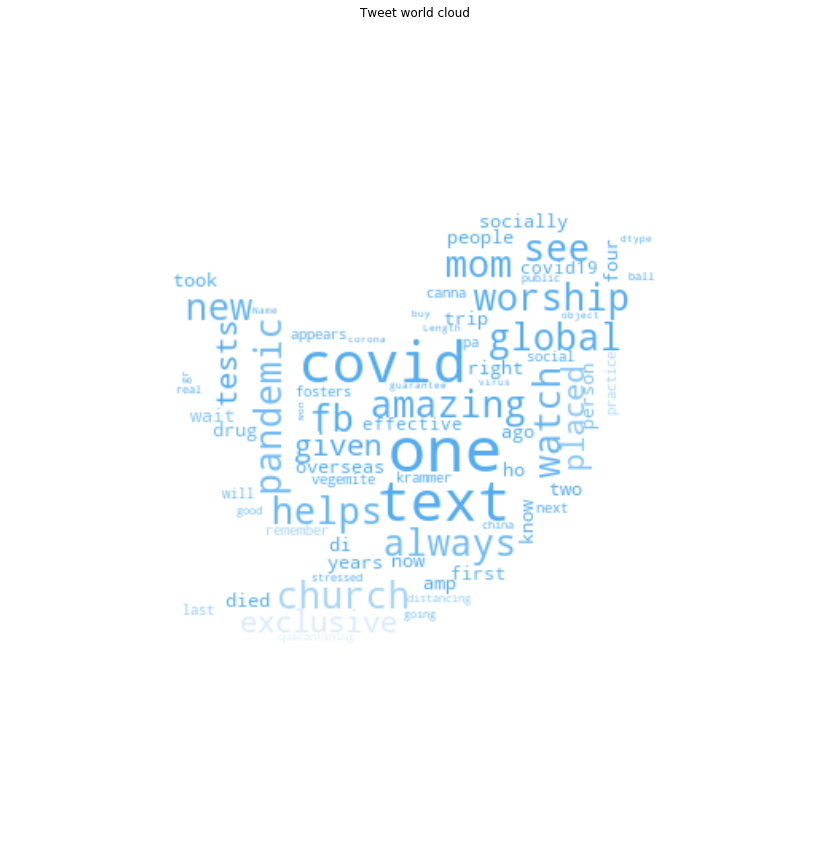

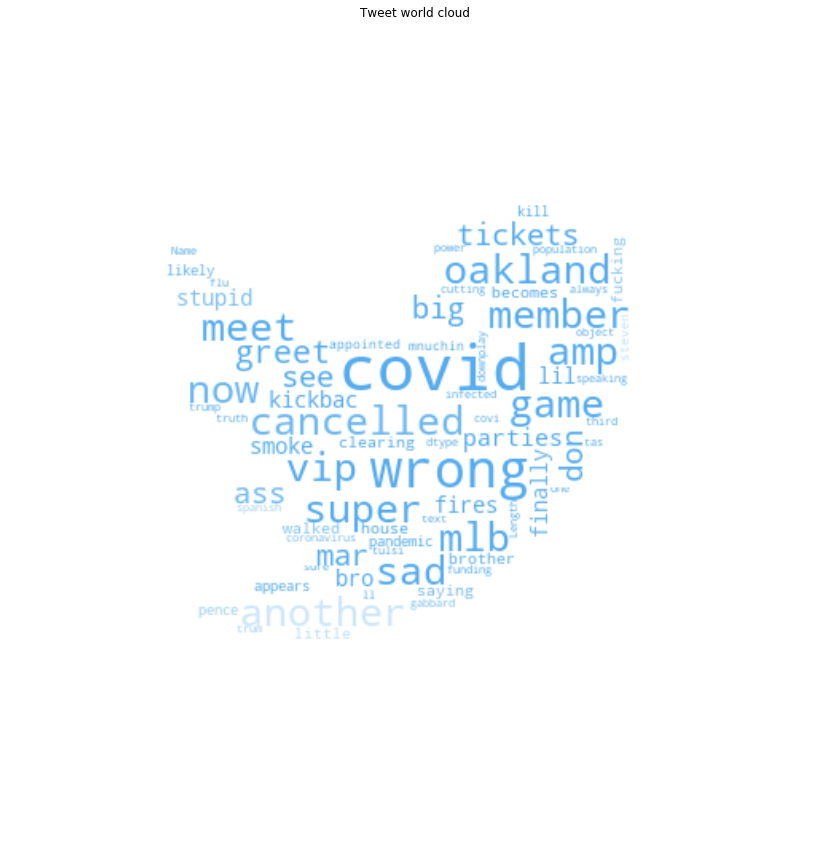

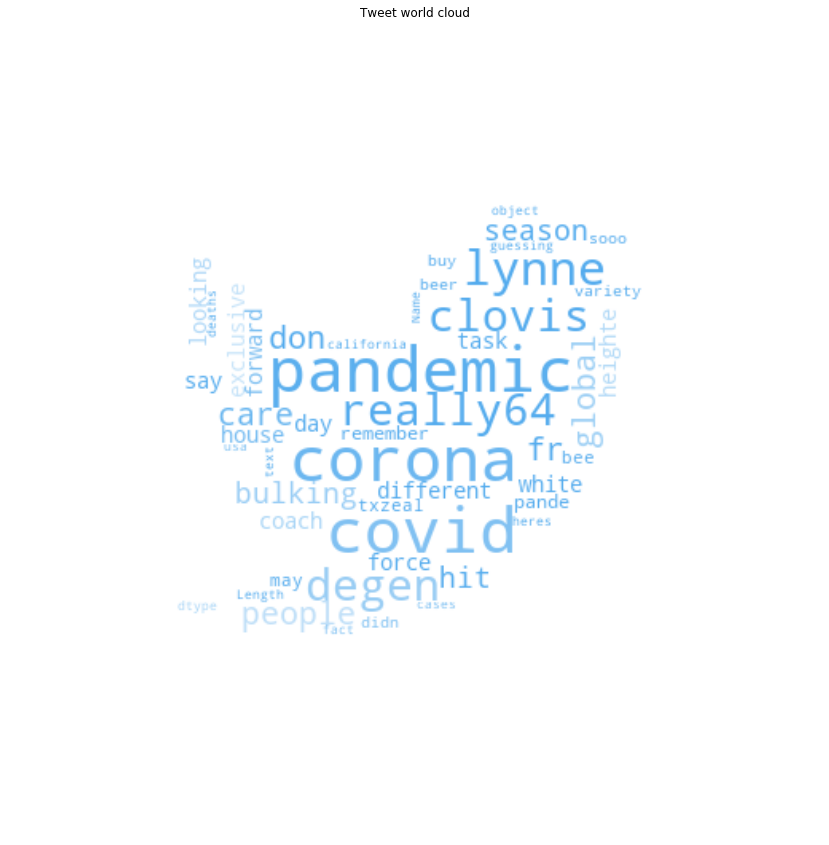

In [28]:
#Plot word cloud for each sentiment
posTweet = tweetData['text'][tweetData['sentiment'] == 'positive']
show_wordcloudImage(posTweet , 'POSITIVE')

negTweet = tweetData['text'][tweetData['sentiment'] == 'negative']
show_wordcloudImage(negTweet , 'NEGATIVE')

neutralTweet = tweetData['text'][tweetData['sentiment'] == 'neutral']
show_wordcloudImage(neutralTweet , 'NEUTRAL')

#### Visualization for tweet count.

In [29]:
dataTweetCount['timePeriod'] = dataTweetCount['timePeriod'].astype(str).str.slice(0,8)
dataTweetCount['timePeriod'] = pd.to_datetime(dataTweetCount['timePeriod'], errors='coerce')

In [30]:
data = px.line(dataTweetCount, x="timePeriod", y="count",
              labels={
                     "timePeriod": "Months",
                     "count": "Tweet counts",
                 }, title="Tweets per day (2020-03-01 to 2020-08-30)")

fig = go.Figure(
    data=data,
    layout=layout
)
fig.show()


In [31]:
fresnoTweetDataCount['timePeriod'] = fresnoTweetDataCount['timePeriod'].astype(str).str.slice(0,8)
fresnoTweetDataCount['timePeriod'] = pd.to_datetime(fresnoTweetDataCount['timePeriod'])
fresnoTweetDataCount['timePeriod']

santaClaraTweetDataCount['timePeriod'] = santaClaraTweetDataCount['timePeriod'].astype(str).str.slice(0,8)
santaClaraTweetDataCount['timePeriod'] = pd.to_datetime(santaClaraTweetDataCount['timePeriod'])

SFOTweetDataCount['timePeriod'] = SFOTweetDataCount['timePeriod'].astype(str).str.slice(0,8)
SFOTweetDataCount['timePeriod'] = pd.to_datetime(SFOTweetDataCount['timePeriod'])

contraCostaTweetDataCount['timePeriod'] = contraCostaTweetDataCount['timePeriod'].astype(str).str.slice(0,8)
contraCostaTweetDataCount['timePeriod'] = pd.to_datetime(contraCostaTweetDataCount['timePeriod'])

#### Graph for tweet count county wise

In [32]:

fig = make_subplots(rows=2, cols=2, start_cell="bottom-left", subplot_titles=("Fresno", "Santa Clara", "San Francisco", "Contra Costa"))

fig.add_trace(go.Scatter(x=fresnoTweetDataCount['timePeriod'], y=fresnoTweetDataCount['count']),
              row=1, col=1)

fig.add_trace(go.Scatter(x=santaClaraTweetDataCount['timePeriod'], y=santaClaraTweetDataCount['count']),
              row=1, col=2)

fig.add_trace(go.Scatter(x=SFOTweetDataCount['timePeriod'], y=SFOTweetDataCount['count']),
              row=2, col=1)

fig.add_trace(go.Scatter(x=contraCostaTweetDataCount['timePeriod'], y=contraCostaTweetDataCount['count']),
              row=2, col=2)

fig.show()

### Plot for new Confirmed cases

In [33]:
fig = px.line(totalCaseCount, x="date", y="Cases",
              labels={
                     "date": "Months",
                     "Cases": "Case counts",
                 }, title="New Case counts (2020-03-01 to 2020-08-30) for all counties")
fig.show()

### Plot for new confirmed death counts

In [34]:
fig = px.line(totalCaseCount, x="date", y="Death",
              labels={
                     "date": "Months",
                     "Death": "Death counts",
                 }, title="New death counts (2020-03-01 to 2020-08-30) for all counties")
fig.show()

#### Graph for new confirmed cases county wise

In [35]:
fig = make_subplots(rows=2, cols=2, start_cell="bottom-left", subplot_titles=("Fresno", "Santa Clara", "San Francisco", "Contra Costa"))

fig.add_trace(go.Scatter(x=fresnoCaseCount['date'], y=fresnoCaseCount['newcountconfirmed']),
              row=1, col=1)

fig.add_trace(go.Scatter(x=santaClaraCaseCount['date'], y=santaClaraCaseCount['newcountconfirmed']),
              row=1, col=2)

fig.add_trace(go.Scatter(x=sfoCaseCount['date'], y=sfoCaseCount['newcountconfirmed']),
              row=2, col=1)

fig.add_trace(go.Scatter(x=contraCostaCaseCount['date'], y=contraCostaCaseCount['newcountconfirmed']),
              row=2, col=2)

fig.show()

In [36]:
#### Graph for new deaths county wise

In [37]:
fig = make_subplots(rows=2, cols=2, start_cell="bottom-left", subplot_titles=("Fresno", "Santa Clara", "San Francisco", "Contra Costa"))

fig.add_trace(go.Scatter(x=fresnoCaseCount['date'], y=fresnoCaseCount['newcountdeaths']),
              row=1, col=1)

fig.add_trace(go.Scatter(x=santaClaraCaseCount['date'], y=santaClaraCaseCount['newcountdeaths']),
              row=1, col=2)

fig.add_trace(go.Scatter(x=sfoCaseCount['date'], y=sfoCaseCount['newcountdeaths']),
              row=2, col=1)

fig.add_trace(go.Scatter(x=contraCostaCaseCount['date'], y=contraCostaCaseCount['newcountdeaths']),
              row=2, col=2)

fig.show()

### Function to check whether the variables are stationary

In [38]:
def augmented_dickey_fuller_statistics(time_series):
    result = adfuller(time_series.values)
    print('ADF Statistic: %f' % result[0])
    print('p-value: %f' % result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t%s: %.3f' % (key, value))

### Function to check Cointegration

In [39]:
#Cointegration test helps to establish the presence of a statistically significant connection between two or more time series.
def cointegration_test(df, alpha=0.05): 
    """Perform Johanson's Cointegration Test and Report Summary"""
    out = coint_johansen(df,-1,5)
    d = {'0.90':0, '0.95':1, '0.99':2}
    traces = out.lr1
    cvts = out.cvt[:, d[str(1-alpha)]]
    def adjust(val, length= 6): return str(val).ljust(length)

    # Summary
    print('Name   ::  Test Stat > C(95%)    =>   Signif  \n', '--'*20)
    for col, trace, cvt in zip(df.columns, traces, cvts):
        print(adjust(col), ':: ', adjust(round(trace,2), 9), ">", adjust(cvt, 8), ' =>  ' , trace > cvt)


### Model 1: Tweet Increase Rate vs Case Increase Rate using VAR

In [40]:
modelData = pd.concat([dataTweetCount['timePeriod'], dataTweetCount['count'], totalCaseCount['Cases'][:182]], axis=1, keys=['timePeriod', 'tweetCount', 'caseCount'])
modelData.head()

,timePeriod,tweetCount,caseCount
0,2020-03-01,116,263
1,2020-03-02,136,52
2,2020-03-03,205,77
3,2020-03-04,199,53
4,2020-03-05,220,60


In [41]:
tweets_cases_df = modelData[['tweetCount','caseCount']]

In [42]:
tweets_cases_df['caseIncreaseRate'] = (tweets_cases_df['caseCount']-tweets_cases_df['caseCount'].shift(-1))/tweets_cases_df['caseCount'].shift(-1)
tweets_cases_df['caseIncreaseRate'] = tweets_cases_df['caseIncreaseRate'].fillna(method='ffill')
tweets_cases_df['caseIncreaseRate'][0] = tweets_cases_df['caseIncreaseRate'][1]

tweets_cases_df['tweetIncreaseRate'] = (tweets_cases_df['tweetCount']-tweets_cases_df['tweetCount'].shift(-1))/tweets_cases_df['tweetCount'].shift(-1)
tweets_cases_df['tweetIncreaseRate'] = tweets_cases_df['tweetIncreaseRate'].fillna(method='ffill')
tweets_cases_df['tweetIncreaseRate'][0] = tweets_cases_df['tweetIncreaseRate'][1]

tweets_cases_df.drop(['tweetCount','caseCount'], axis = 1, inplace=True)


#### Checking wheather the variables are stationary

In [43]:
print('Augmented Dickey-Fuller Test: Tweets')
augmented_dickey_fuller_statistics(tweets_cases_df['tweetIncreaseRate'])
print('Augmented Dickey-Fuller Test: Cases')
augmented_dickey_fuller_statistics(tweets_cases_df['caseIncreaseRate']) 

Augmented Dickey-Fuller Test: Tweets
ADF Statistic: -7.888717
p-value: 0.000000
Critical Values:
	1%: -3.468
	5%: -2.878
	10%: -2.576
Augmented Dickey-Fuller Test: Cases
ADF Statistic: -19.879475
p-value: 0.000000
Critical Values:
	1%: -3.467
	5%: -2.878
	10%: -2.575


Both the variables are stationary as they have p-value less than 0.5.

#### Checking for Co integration in the time series

In [44]:
cointegration_test(tweets_cases_df)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
caseIncreaseRate ::  51.24     > 12.3212   =>   True
tweetIncreaseRate ::  20.98     > 4.1296    =>   True


The time series are cointegrated, they have statistically significant relationship.

In [45]:
model1 = VAR(tweets_cases_df)

##### Select the lag for the model.

In [46]:
# Select order method for lag finder
x = model1.select_order(maxlags=15)
x.summary()


,AIC,BIC,FPE,HQIC
0,-4.760,-4.723,0.008564,-4.745
1,-4.979*,-4.867*,0.006883*,-4.933*
2,-4.941,-4.754,0.007149,-4.865
3,-4.957,-4.696,0.007035,-4.851
4,-4.976,-4.640,0.006901,-4.840
5,-4.945,-4.534,0.007122,-4.778
6,-4.923,-4.437,0.007284,-4.726
7,-4.909,-4.349,0.007388,-4.682
8,-4.867,-4.232,0.007707,-4.609
9,-4.873,-4.164,0.007663,-4.585


In [47]:
#### From select_order optimal lag is observed at a lag order of 1

In [173]:
model1_fit = model1.fit(1)
model1_fit.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Fri, 20, Nov, 2020
Time:                     19:04:50
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -4.69317
Nobs:                     181.000    HQIC:                  -4.75621
Log likelihood:          -73.3286    FPE:                 0.00823642
AIC:                     -4.79920    Det(Omega_mle):      0.00797003
--------------------------------------------------------------------
Results for equation caseIncreaseRate
                          coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------------
const                        0.182329         0.046851            3.892           0.000
L1.caseIncreaseRate         -0.375272         0.069596           -5.392           0.000
L1.tweetIncreaseRate 

### Plot autocurrelation function

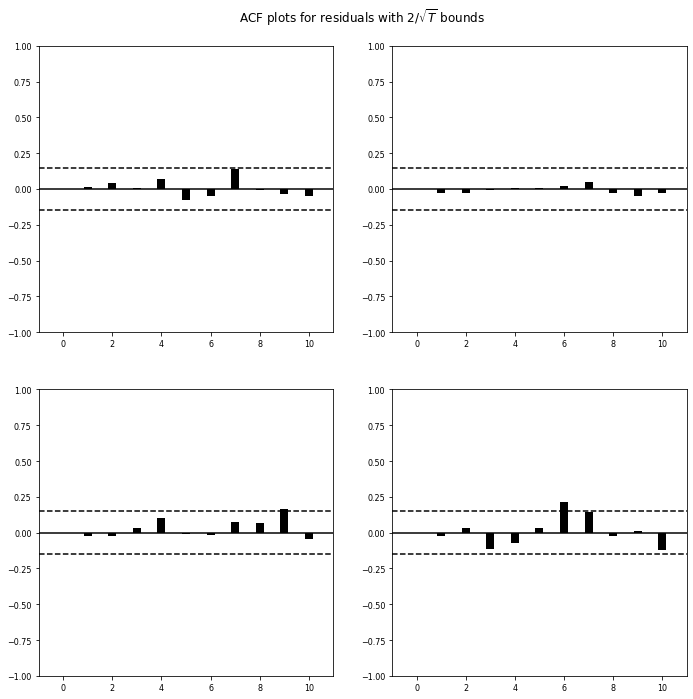

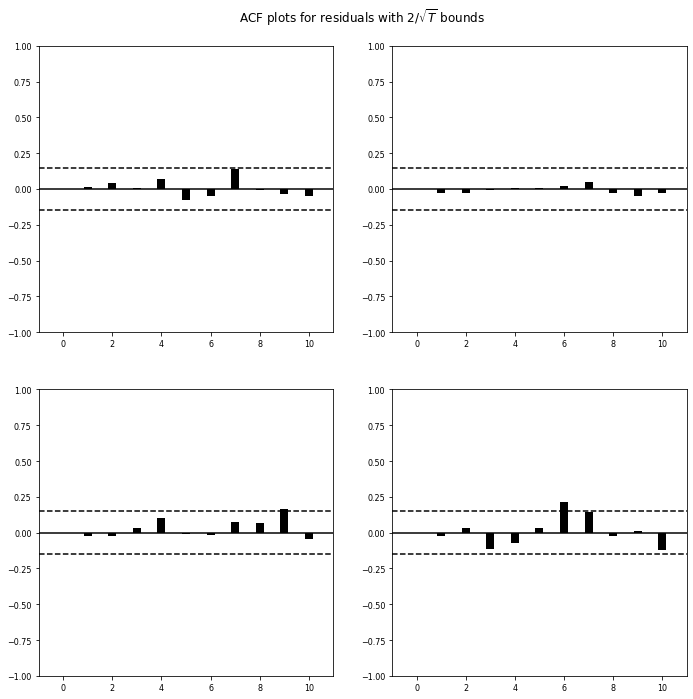

In [94]:
model1_fit.plot_acorr()

A moving average term in the data. The number of significant correlations indicates the order of the moving average term.

In [95]:
lag_order = model1_fit.k_ar
# In order to forecast, the VAR model expects up to the lag order number of observations from the past data.
# The model forecast 8 periods foreward
forecast = model1_fit.forecast(tweets_cases_df.values[-lag_order:],8)
print(forecast)

[[ 0.33969737 -0.00105695]
 [ 0.0547025   0.01491896]
 [ 0.16387766  0.00240817]
 [ 0.1211652   0.00808312]
 [ 0.13798421  0.00575517]
 [ 0.13134835  0.00668474]
 [ 0.13396804  0.00631645]
 [ 0.13293366  0.00646202]]


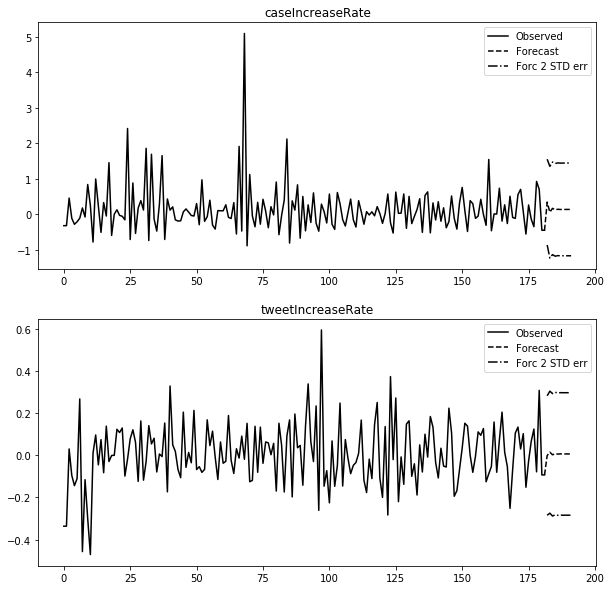

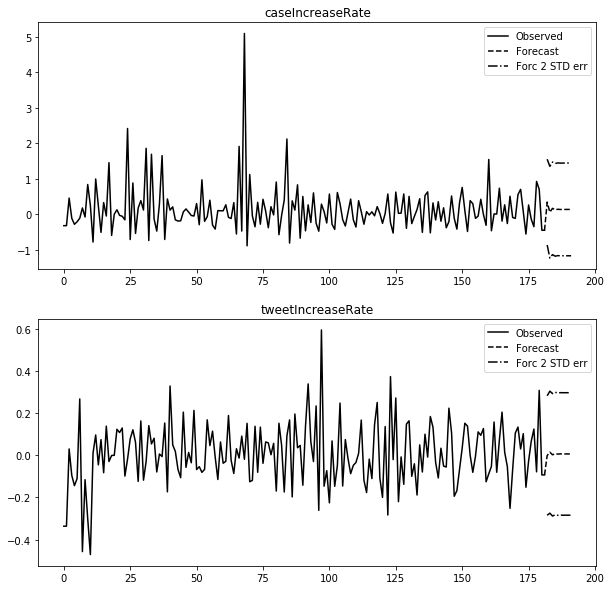

In [96]:
model1_fit.plot_forecast(steps=10)


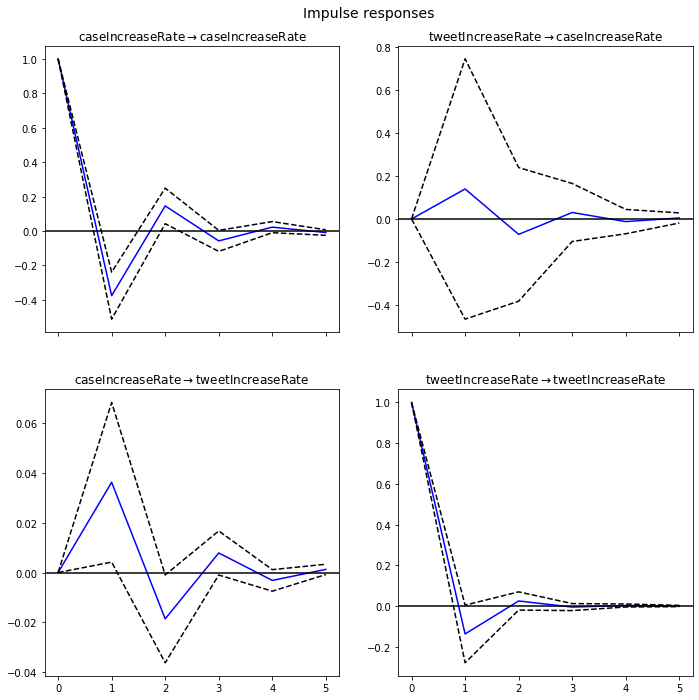

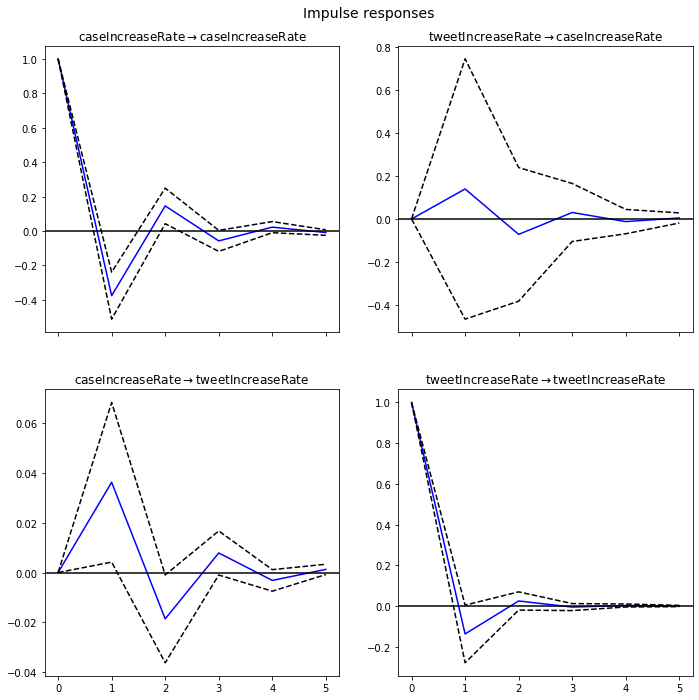

In [97]:
#impulse response function for next 5 days.
irf = model1_fit.irf(5)
irf.plot(orth=False)

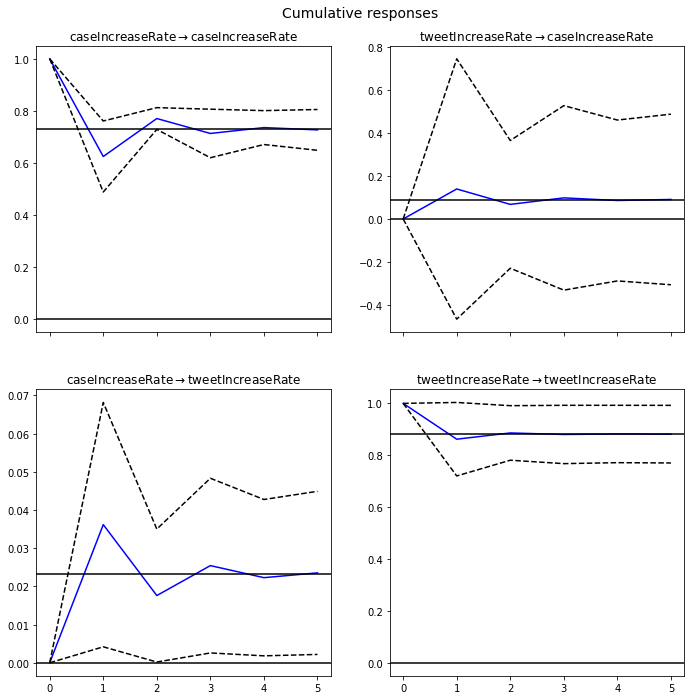

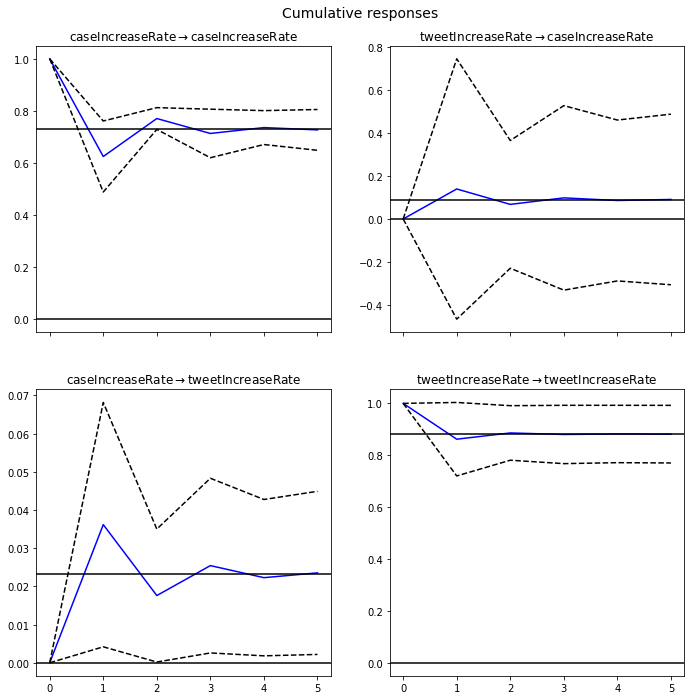

In [98]:
# The cumulative effects  
# where each period is the sum of the current and previous period response values
irf.plot_cum_effects(orth=False)

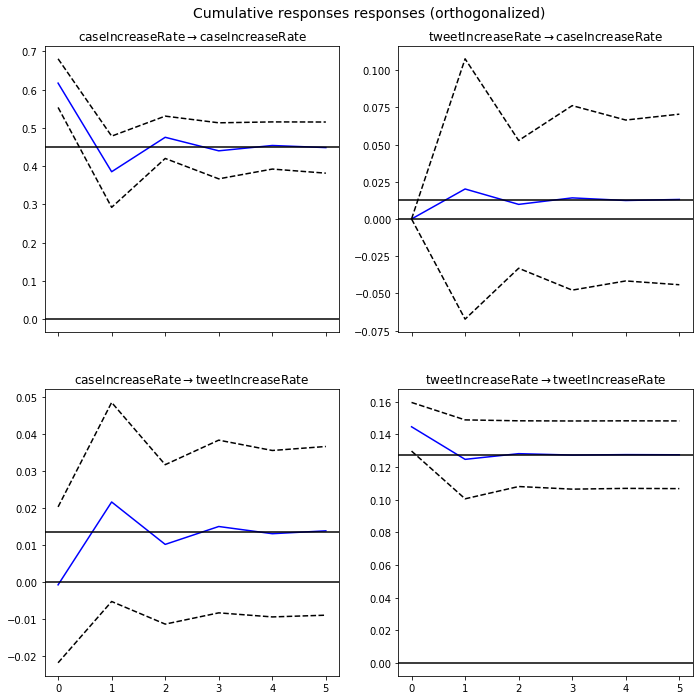

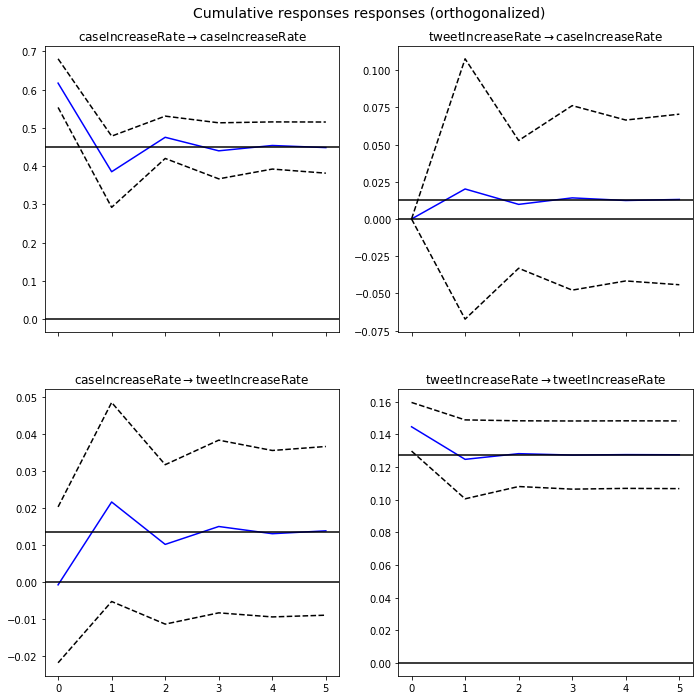

In [99]:
irf.plot_cum_effects(orth=True)

In [100]:
#Grangers causality tweetCount with respect to caseCount
feedBackLoop = model1_fit.test_causality('caseIncreaseRate','tweetIncreaseRate', kind='f')
print(feedBackLoop)


<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: tweetIncreaseRate does not Granger-cause caseIncreaseRate: fail to reject at 5% significance level. Test statistic: 0.204, critical value: 3.868>, p-value: 0.652>


In [101]:
#Grangers causality caseCount with respect to tweetCount
feedBackLoop = model1_fit.test_causality('tweetIncreaseRate','caseIncreaseRate', kind='f')
print(feedBackLoop)


<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: caseIncreaseRate does not Granger-cause tweetIncreaseRate: reject at 5% significance level. Test statistic: 4.911, critical value: 3.868>, p-value: 0.027>


### Model 2:  Tweet rate vs Case rate using VECM

##### Cointegration rank

In [48]:
lag_order = select_order(tweets_cases_df, maxlags=10, deterministic="ci", seasons=4)
lag_order.summary()

,AIC,BIC,FPE,HQIC
0,-4.954*,-4.696*,0.007059*,-4.849*
1,-4.912,-4.581,0.007359,-4.778
2,-4.910,-4.506,0.007377,-4.746
3,-4.901,-4.423,0.007445,-4.707
4,-4.859,-4.308,0.007766,-4.635
5,-4.862,-4.237,0.007744,-4.609
6,-4.876,-4.178,0.007644,-4.592
7,-4.839,-4.067,0.007936,-4.526
8,-4.838,-3.993,0.007948,-4.495
9,-4.795,-3.877,0.008305,-4.422


In [49]:
vec_rank1 = select_coint_rank(tweets_cases_df, det_order = -1, k_ar_diff = 0)
print(vec_rank1.rank)

2


In [51]:
vecm_model2 = VECM(endog = tweets_cases_df, k_ar_diff = 0, coint_rank = 2, deterministic = 'ci')
vecm2_fit = vecm_model2.fit()
vecm2_fit.summary()

,coef,std err,z,P>|z|,[0.025,0.975]
ec1,-1.3753,0.069,-19.927,0.000,-1.511,-1.240
ec2,0.1392,0.306,0.455,0.649,-0.460,0.738
,coef,std err,z,P>|z|,[0.025,0.975]
ec1,0.0362,0.016,2.235,0.025,0.004,0.068
ec2,-1.1381,0.072,-15.879,0.000,-1.279,-0.998
,coef,std err,z,P>|z|,[0.025,0.975]
beta.1,1.0000,0,0,0.000,1.000,1.000
beta.2,0,0,0,0.000,0,0
const,-0.1332,0.033,-4.014,0.000,-0.198,-0.068
,coef,std err,z,P>|z|,[0.025,0.975]


In [52]:
vecm2_fit.predict(steps=10)

array([[ 0.33969737, -0.00105695],
       [ 0.0547025 ,  0.01491896],
       [ 0.16387766,  0.00240817],
       [ 0.1211652 ,  0.00808312],
       [ 0.13798421,  0.00575517],
       [ 0.13134835,  0.00668474],
       [ 0.13396804,  0.00631645],
       [ 0.13293366,  0.00646202],
       [ 0.1333421 ,  0.00640452],
       [ 0.13318082,  0.00642723]])

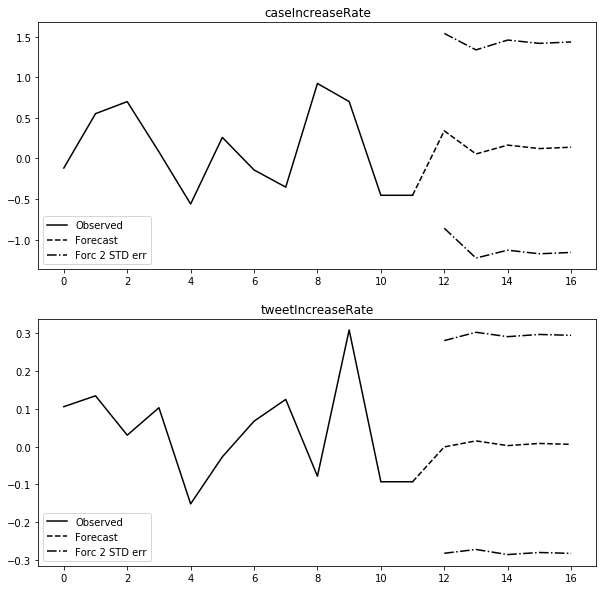

In [53]:
vecm2_fit.plot_forecast(steps=5, n_last_obs=12)

In [54]:
granger_results = vecm2_fit.test_granger_causality(caused="tweetIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
3.309,3.868,0.070,"(1, 350)"


In [55]:
granger_results = vecm2_fit.test_granger_causality(caused="caseIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
0.01151,3.868,0.915,"(1, 350)"


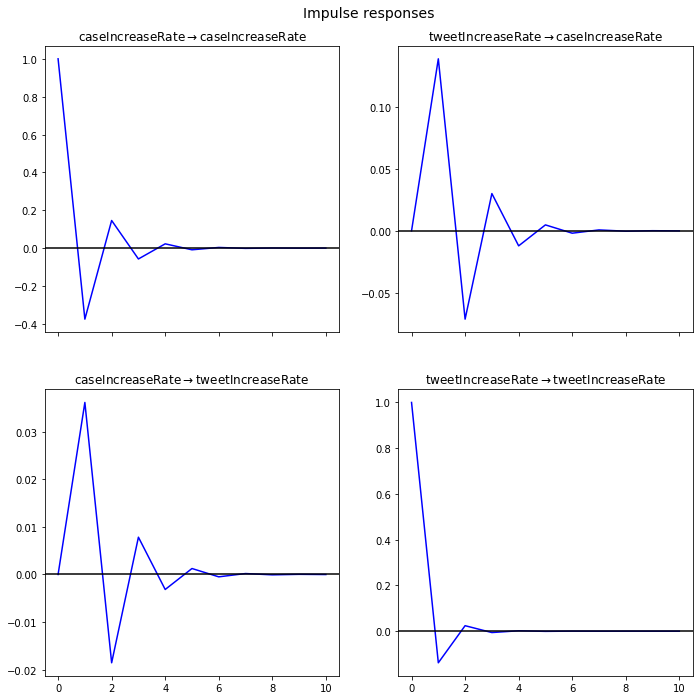

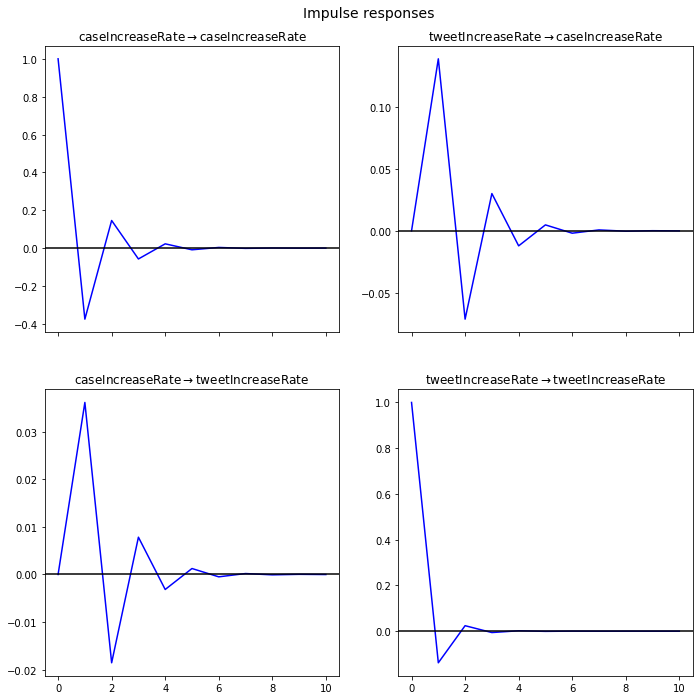

In [56]:
num_periods = 10
ir = vecm2_fit.irf(periods=num_periods)
ir.plot(plot_stderr=False)

### Model 3: Tweets Increase Rate vs Death Increase Rate using VAR

In [57]:
modelData3 = pd.concat([dataTweetCount['timePeriod'], dataTweetCount['count'], totalCaseCount['Death'][:182]], axis=1, keys=['timePeriod', 'tweetCount', 'deathCount'])
modelData3.head()

,timePeriod,tweetCount,deathCount
0,2020-03-01,116,6
1,2020-03-02,136,2
2,2020-03-03,205,1
3,2020-03-04,199,2
4,2020-03-05,220,3


In [58]:
tweets_deaths_df = modelData3[['tweetCount','deathCount']]

In [59]:
#Difference transform for removing a systematic structure from the time series
tweets_deaths_df['tweetIncreaseRate'] = (tweets_deaths_df['tweetCount']-tweets_deaths_df['tweetCount'].shift(-1))/tweets_deaths_df['tweetCount'].shift(-1)
tweets_deaths_df['tweetIncreaseRate'] = tweets_deaths_df['tweetIncreaseRate'].fillna(method='ffill')
tweets_deaths_df['tweetIncreaseRate'][0] = tweets_deaths_df['tweetIncreaseRate'][1]

tweets_deaths_df['deathIncreaseRate'] = (tweets_deaths_df['deathCount']-tweets_deaths_df['deathCount'].shift(-1))/tweets_deaths_df['deathCount'].shift(-1)
tweets_deaths_df['deathIncreaseRate'] = tweets_deaths_df['deathIncreaseRate'].fillna(method='ffill')
tweets_deaths_df['deathIncreaseRate'][0] = tweets_deaths_df['deathIncreaseRate'][1]
tweets_deaths_df = tweets_deaths_df.replace(np.inf, np.nan)
tweets_deaths_df['deathIncreaseRate'] = tweets_deaths_df['deathIncreaseRate'].fillna(tweets_deaths_df['deathIncreaseRate'].mean())

tweets_deaths_df.drop(['tweetCount','deathCount'], axis = 1, inplace = True)

#### Checking wheather the variables are stationary

In [60]:
print('Augmented Dickey-Fuller Test: Tweets')
augmented_dickey_fuller_statistics(tweets_deaths_df['tweetIncreaseRate'])
print('Augmented Dickey-Fuller Test: Deaths')
augmented_dickey_fuller_statistics(tweets_deaths_df['deathIncreaseRate']) 

Augmented Dickey-Fuller Test: Tweets
ADF Statistic: -7.888717
p-value: 0.000000
Critical Values:
	1%: -3.468
	5%: -2.878
	10%: -2.576
Augmented Dickey-Fuller Test: Deaths
ADF Statistic: -13.234853
p-value: 0.000000
Critical Values:
	1%: -3.467
	5%: -2.878
	10%: -2.575


Since Cases p-value for both variables is less than 0.05, they are stationary.

#### Checking for Co integration in the time series

In [61]:
cointegration_test(tweets_deaths_df)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
tweetIncreaseRate ::  56.13     > 12.3212   =>   True
deathIncreaseRate ::  23.07     > 4.1296    =>   True


The time series are cointegrated, they have statistically significant relationship.

In [62]:
model3 = VAR(tweets_deaths_df)

##### Select the lag for the model

In [63]:
# Select order method for lag finder
x = model3.select_order(maxlags=15)
x.summary()

,AIC,BIC,FPE,HQIC
0,-1.841,-1.804*,0.1587,-1.826
1,-1.877,-1.765,0.1531,-1.832*
2,-1.836,-1.650,0.1594,-1.760
3,-1.857,-1.596,0.1561,-1.751
4,-1.882*,-1.546,0.1523*,-1.746
5,-1.862,-1.451,0.1554,-1.695
6,-1.837,-1.351,0.1595,-1.640
7,-1.825,-1.265,0.1613,-1.598
8,-1.780,-1.146,0.1688,-1.523
9,-1.742,-1.033,0.1755,-1.454


#### From select_order optimal lag is observed at a lag order of 0, so am not going to mention the lag order for the model. 

In [64]:
model3_fit = model3.fit()
model3_fit.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 21, Nov, 2020
Time:                     19:24:51
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -1.62375
Nobs:                     181.000    HQIC:                  -1.68679
Log likelihood:          -351.111    FPE:                   0.177325
AIC:                     -1.72978    Det(Omega_mle):        0.171589
--------------------------------------------------------------------
Results for equation tweetIncreaseRate
                          coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------------
const                        0.007933         0.010900            0.728           0.467
L1.tweetIncreaseRate        -0.146040         0.072999           -2.001           0.045
L1.deathIncreaseRate

### Plot autocurrelation function

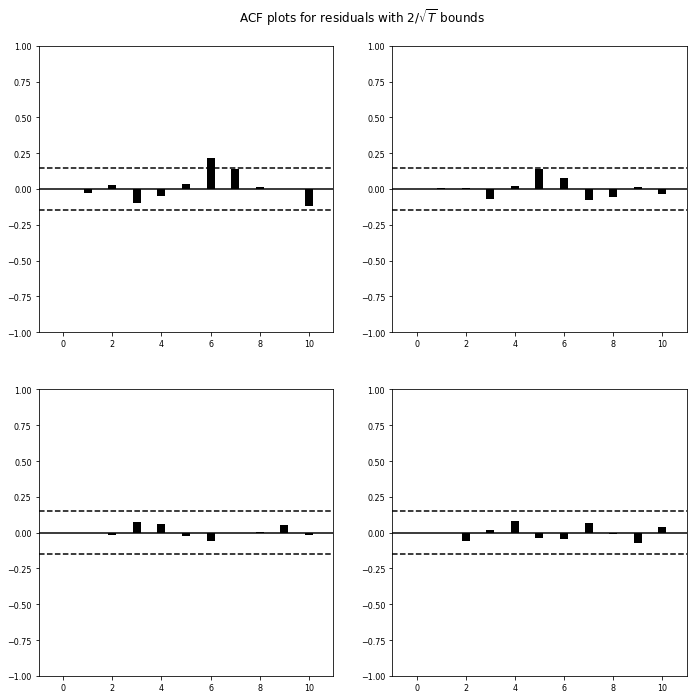

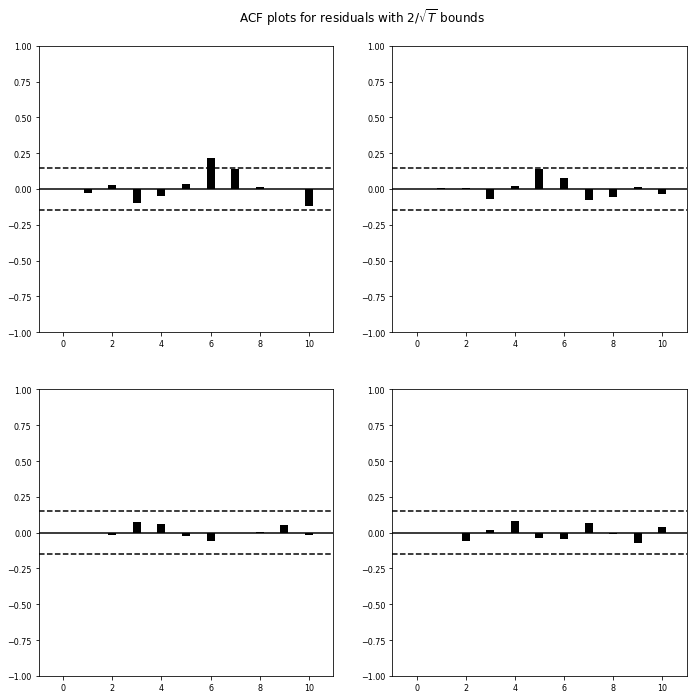

In [118]:
model3_fit.plot_acorr()

A moving average term in the data. The number of significant correlations indicates the order of the moving average term.


In [119]:
#model3_fit.plot_forecast(steps=10)

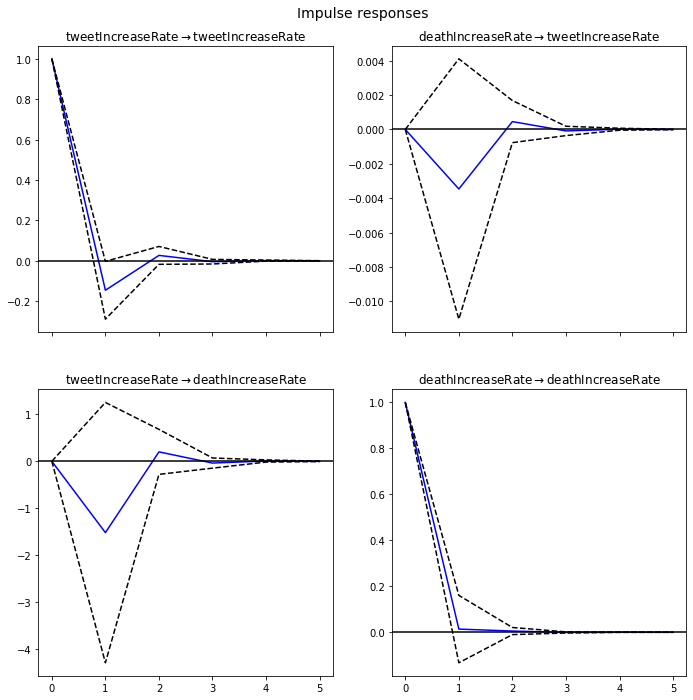

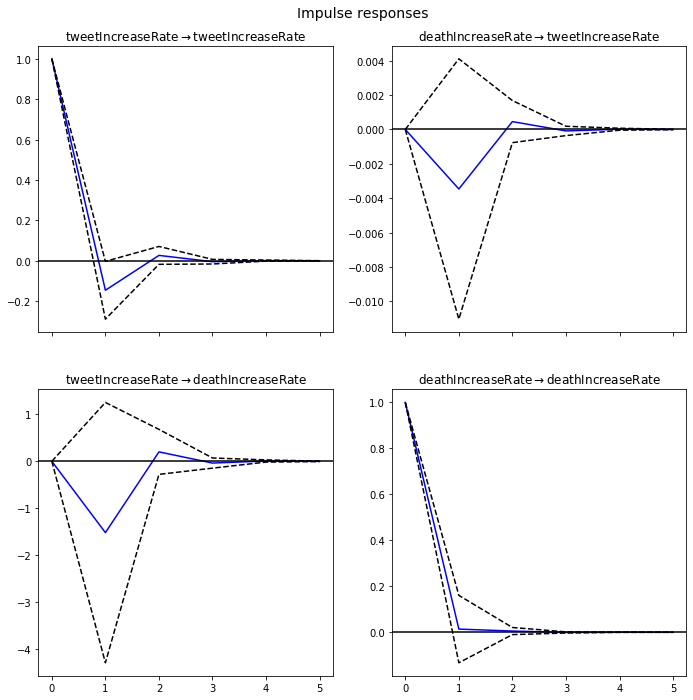

In [120]:
#impulse response function for next 5 days.
irf = model3_fit.irf(5)
irf.plot(orth=False)

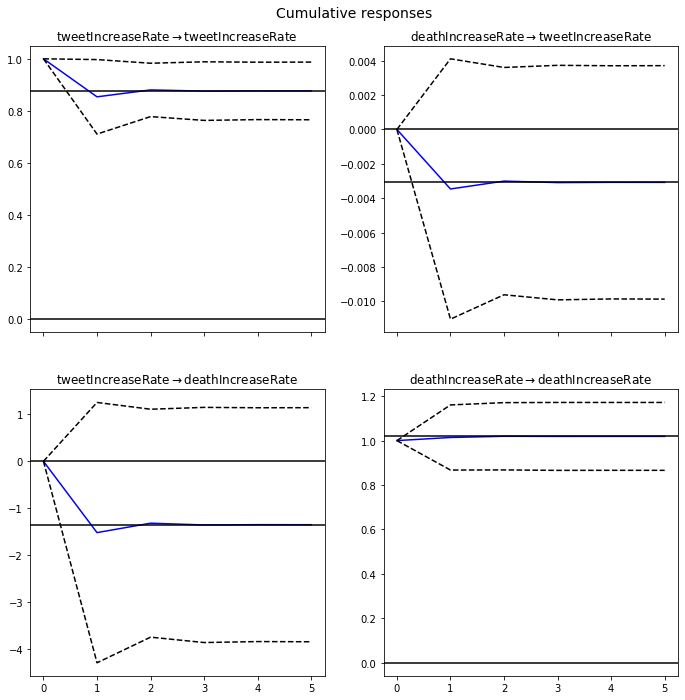

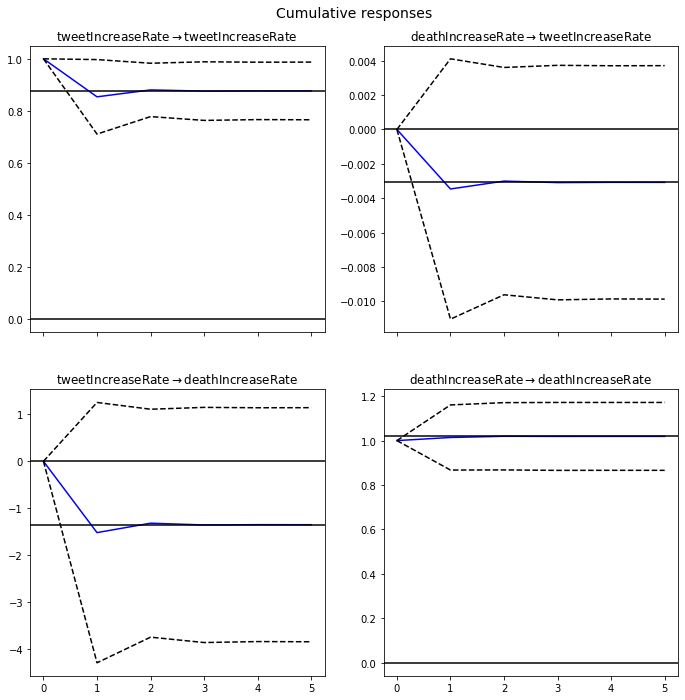

In [121]:
# The cumulative effects  
# where each period is the sum of the current and previous period response values
irf.plot_cum_effects(orth=False)

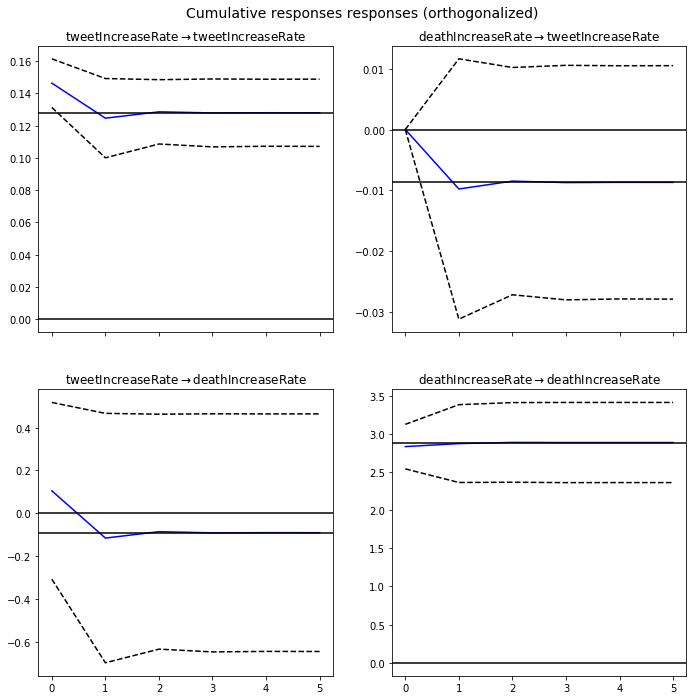

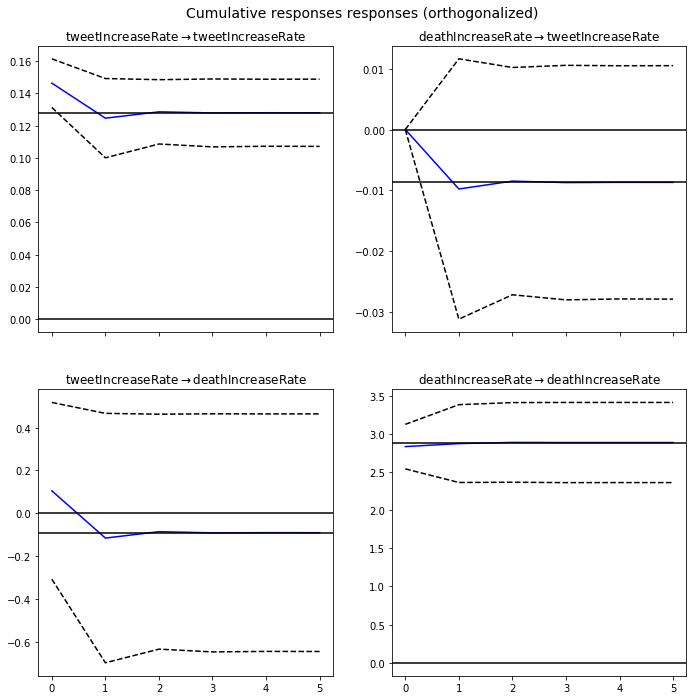

In [122]:
irf.plot_cum_effects(orth=True)

In [123]:
#Grangers causality tweetCount with respect to caseCount
feedBackLoop = model3_fit.test_causality('deathIncreaseRate','tweetIncreaseRate', kind='f')
print(feedBackLoop)

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: tweetIncreaseRate does not Granger-cause deathIncreaseRate: fail to reject at 5% significance level. Test statistic: 1.153, critical value: 3.868>, p-value: 0.284>


In [124]:
#Grangers causality tweetCount with respect to caseCount
feedBackLoop = model3_fit.test_causality('tweetIncreaseRate','deathIncreaseRate', kind='f')
print(feedBackLoop)

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: deathIncreaseRate does not Granger-cause tweetIncreaseRate: fail to reject at 5% significance level. Test statistic: 0.803, critical value: 3.868>, p-value: 0.371>


### Model 4:  Tweet Increase Rate vs DeathsIncrease Rate using VECM


Cointegration rank

In [125]:
lag_order4 = select_order(tweets_deaths_df, maxlags=10, deterministic="ci", seasons=4)
lag_order4.summary()

,AIC,BIC,FPE,HQIC
0,-1.845*,-1.588*,0.1581*,-1.740*
1,-1.804,-1.473,0.1646,-1.670
2,-1.807,-1.403,0.1642,-1.643
3,-1.803,-1.325,0.1649,-1.609
4,-1.780,-1.229,0.1688,-1.556
5,-1.786,-1.162,0.1678,-1.533
6,-1.798,-1.099,0.1660,-1.514
7,-1.759,-0.9877,0.1726,-1.446
8,-1.725,-0.8796,0.1788,-1.382
9,-1.685,-0.7662,0.1863,-1.312


In [126]:
vec_rank4 = select_coint_rank(tweets_deaths_df, det_order = 1, k_ar_diff = 0)
print(vec_rank4.rank)

2


In [127]:
vecm_model4 = VECM(endog = tweets_deaths_df, k_ar_diff = 0, coint_rank = 2, deterministic = 'ci')
vecm4_fit = vecm_model4.fit()
vecm4_fit.summary()

,coef,std err,z,P>|z|,[0.025,0.975]
ec1,-1.1460,0.072,-15.832,0.000,-1.288,-1.004
ec2,-0.0035,0.004,-0.904,0.366,-0.011,0.004
,coef,std err,z,P>|z|,[0.025,0.975]
ec1,-1.5177,1.401,-1.083,0.279,-4.265,1.229
ec2,-0.9860,0.074,-13.295,0.000,-1.131,-0.841
,coef,std err,z,P>|z|,[0.025,0.975]
beta.1,1.0000,0,0,0.000,1.000,1.000
beta.2,3.469e-18,0,0,0.000,3.47e-18,3.47e-18
const,-0.0065,0.009,-0.684,0.494,-0.025,0.012
,coef,std err,z,P>|z|,[0.025,0.975]


In [128]:
vecm4_fit.predict(steps=10)

array([[0.0250044 , 0.28644522],
       [0.00328928, 0.12502071],
       [0.00701945, 0.15572436],
       [0.0063684 , 0.15049169],
       [0.00648159, 0.15140676],
       [0.00646189, 0.15124773],
       [0.00646532, 0.15127541],
       [0.00646472, 0.15127059],
       [0.00646483, 0.15127143],
       [0.00646481, 0.15127128]])

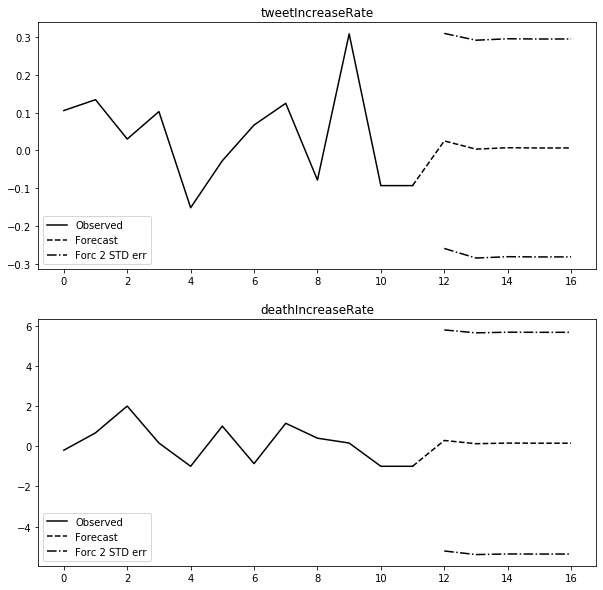

In [129]:
vecm4_fit.plot_forecast(steps=5, n_last_obs=12)

In [130]:
granger_results = vecm4_fit.test_granger_causality(caused="tweetIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
0.6357,3.868,0.426,"(1, 350)"


In [131]:
granger_results = vecm4_fit.test_granger_causality(caused="deathIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
1.263,3.868,0.262,"(1, 350)"


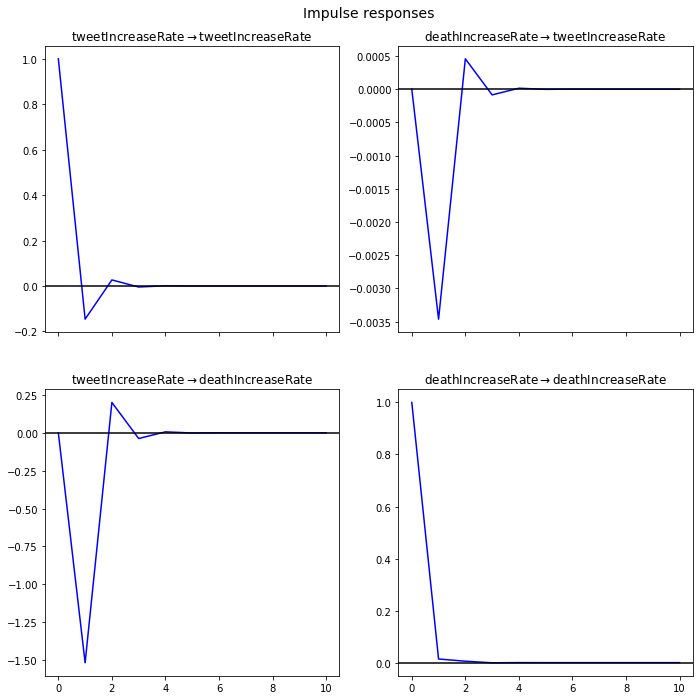

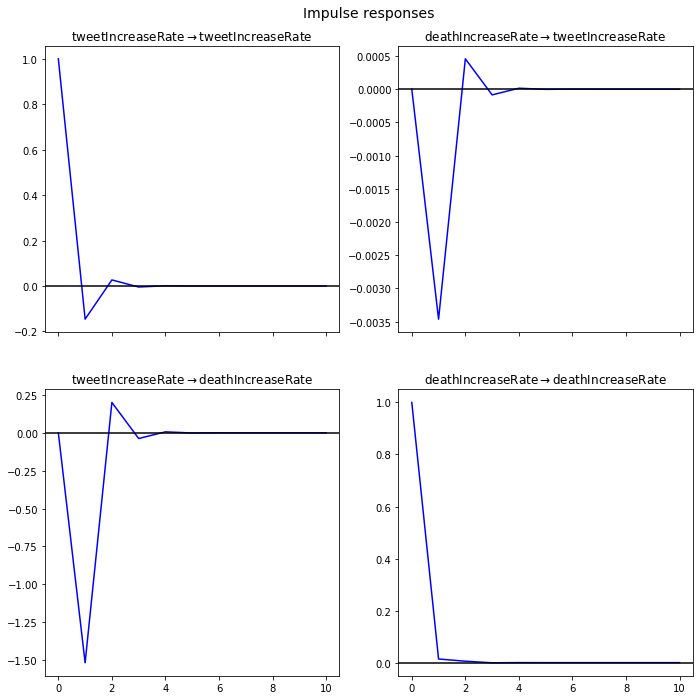

In [132]:
num_periods = 10
ir = vecm4_fit.irf(periods=num_periods)
ir.plot(plot_stderr=False)

### Model 5: Contra Costa county Case Increase Rate  vs Tweet Increse Rate using VAR

In [65]:
modelData5 = pd.concat([contraCostaTweetDataCount['timePeriod'], contraCostaTweetDataCount['count'], contraCostaCaseCount['newcountconfirmed'][:182]], axis=1, keys=['timePeriod', 'tweetCount', 'caseCount'])
modelData5.head()

,timePeriod,tweetCount,caseCount
0,2020-03-01,50,44
1,2020-03-02,56,2
2,2020-03-03,96,6
3,2020-03-04,83,10
4,2020-03-05,92,17


In [66]:
tweets_cases_CC_df = modelData5[['tweetCount','caseCount']]

In [67]:
tweets_cases_CC_df['caseIncreaseRate'] = (tweets_cases_CC_df['caseCount']-tweets_cases_CC_df['caseCount'].shift(-1))/tweets_cases_CC_df['caseCount'].shift(-1)
tweets_cases_CC_df['caseIncreaseRate'] = tweets_cases_CC_df['caseIncreaseRate'].fillna(method='ffill')
tweets_cases_CC_df['caseIncreaseRate'][0] = tweets_cases_CC_df['caseIncreaseRate'][1]

tweets_cases_CC_df['tweetIncreaseRate'] = (tweets_cases_CC_df['tweetCount']-tweets_cases_CC_df['tweetCount'].shift(-1))/tweets_cases_CC_df['tweetCount'].shift(-1)
tweets_cases_CC_df['tweetIncreaseRate'] = tweets_cases_CC_df['tweetIncreaseRate'].fillna(method='ffill')
tweets_cases_CC_df['tweetIncreaseRate'][0] = tweets_cases_CC_df['tweetIncreaseRate'][1]

tweets_cases_CC_df.drop(['tweetCount','caseCount'], axis=1, inplace = True)

#### Checking wheather the variables are stationary

In [68]:
print('Augmented Dickey-Fuller Test: Tweets')
augmented_dickey_fuller_statistics(tweets_cases_CC_df['tweetIncreaseRate'])
print('Augmented Dickey-Fuller Test: Cases')
augmented_dickey_fuller_statistics(tweets_cases_CC_df['caseIncreaseRate']) 

Augmented Dickey-Fuller Test: Tweets
ADF Statistic: -7.153418
p-value: 0.000000
Critical Values:
	1%: -3.468
	5%: -2.878
	10%: -2.576
Augmented Dickey-Fuller Test: Cases
ADF Statistic: -12.583292
p-value: 0.000000
Critical Values:
	1%: -3.467
	5%: -2.878
	10%: -2.575


Both the variables have p-value less than 0.5 which implies they are stationary

#### Checking for Co integration in the time series

In [69]:
cointegration_test(tweets_cases_CC_df)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
caseIncreaseRate ::  53.28     > 12.3212   =>   True
tweetIncreaseRate ::  19.53     > 4.1296    =>   True


In [70]:
model5 = VAR(tweets_cases_CC_df)

##### Select the lag for the model.

In [71]:
# Select order method for lag finder
x = model5.select_order(maxlags=15)
x.summary()

,AIC,BIC,FPE,HQIC
0,-4.130,-4.093,0.01608,-4.115
1,-4.293,-4.181*,0.01367,-4.247*
2,-4.300,-4.113,0.01357,-4.224
3,-4.323*,-4.062,0.01326*,-4.217
4,-4.303,-3.967,0.01353,-4.166
5,-4.293,-3.882,0.01367,-4.126
6,-4.253,-3.768,0.01422,-4.056
7,-4.241,-3.681,0.01441,-4.014
8,-4.216,-3.582,0.01477,-3.959
9,-4.194,-3.485,0.01511,-3.906


#### From select_order optimal lag is observed at a lag order of 3

In [72]:
model5_fit = model5.fit(1)
model5_fit.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 21, Nov, 2020
Time:                     23:59:17
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -4.03087
Nobs:                     181.000    HQIC:                  -4.09391
Log likelihood:          -133.267    FPE:                  0.0159725
AIC:                     -4.13690    Det(Omega_mle):       0.0154559
--------------------------------------------------------------------
Results for equation caseIncreaseRate
                          coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------------
const                        0.223364         0.058320            3.830           0.000
L1.caseIncreaseRate         -0.256740         0.072192           -3.556           0.000
L1.tweetIncreaseRate 

### Plot autocurrelation function

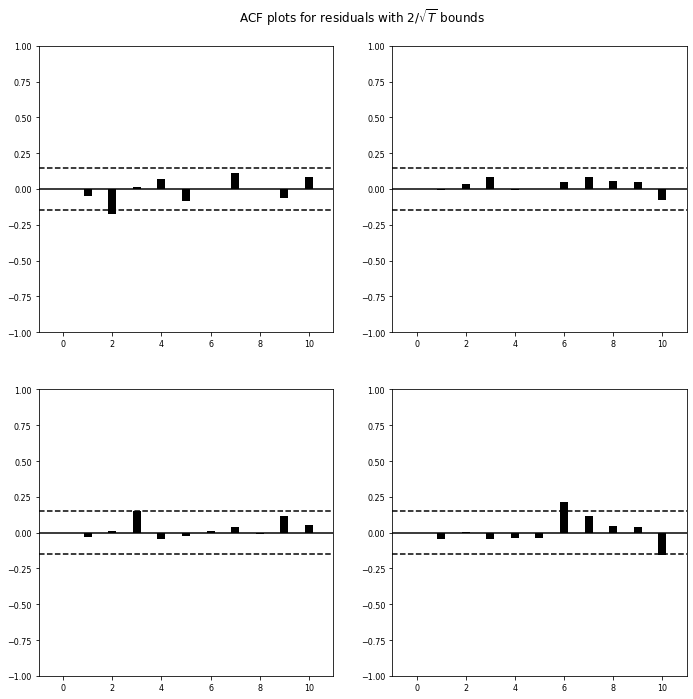

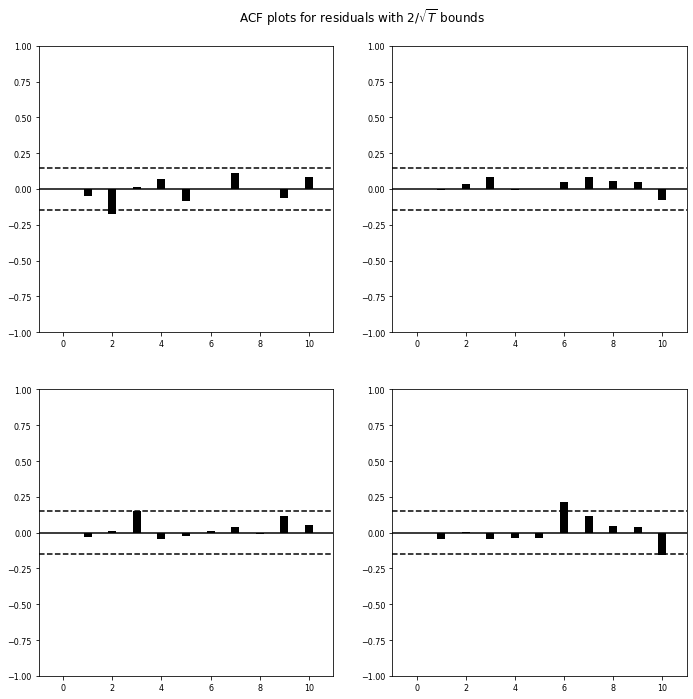

In [141]:
model5_fit.plot_acorr()

A moving average term in the data. The number of significant correlations indicates the order of the moving average term.

In [142]:
lag_order = model5_fit.k_ar
# In order to forecast, the VAR model expects up to the lag order number of observations from the past data.
# The model forecast 8 periods foreward
forecast = model5_fit.forecast(tweets_cases_CC_df.values[-lag_order:],8)
print(forecast)

[[0.19777614 0.04281668]
 [0.1790426  0.00036449]
 [0.1774518  0.0101121 ]
 [0.17932985 0.00783389]
 [0.1785042  0.00837658]
 [0.178798   0.00824474]
 [0.17870269 0.0082774 ]
 [0.17873208 0.00826916]]


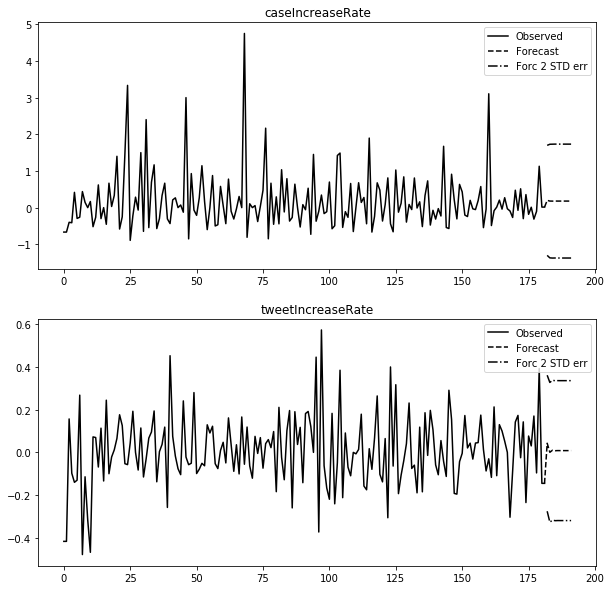

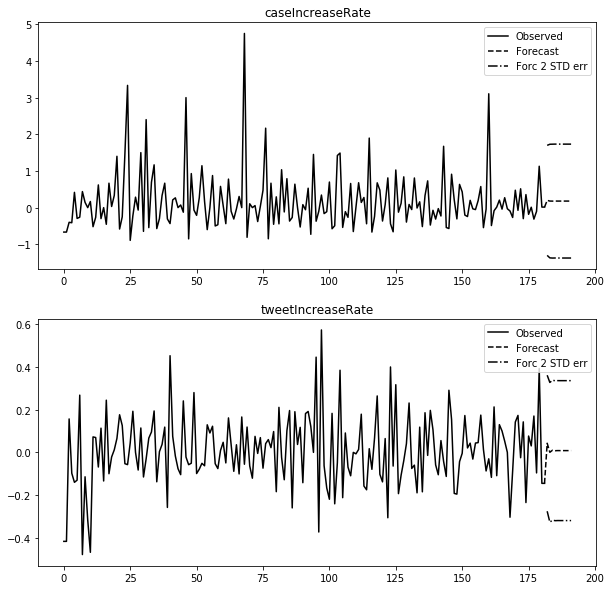

In [143]:
model5_fit.plot_forecast(steps=10)


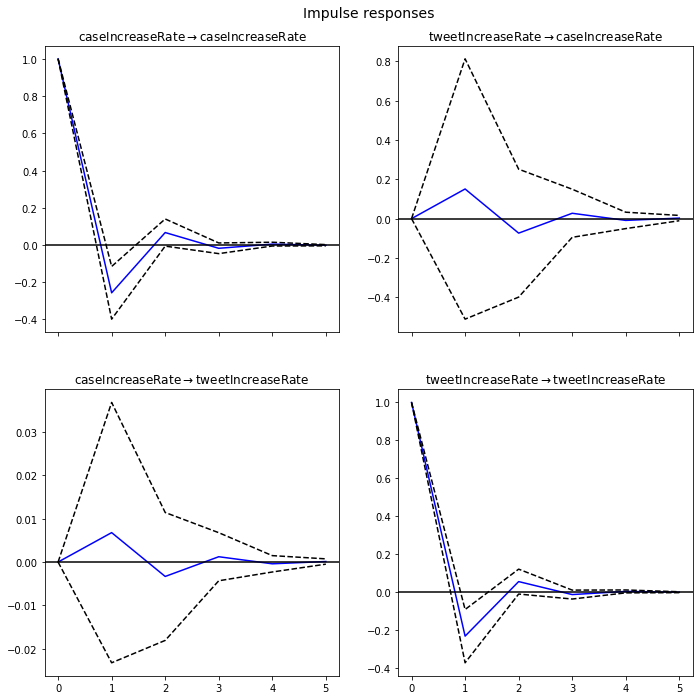

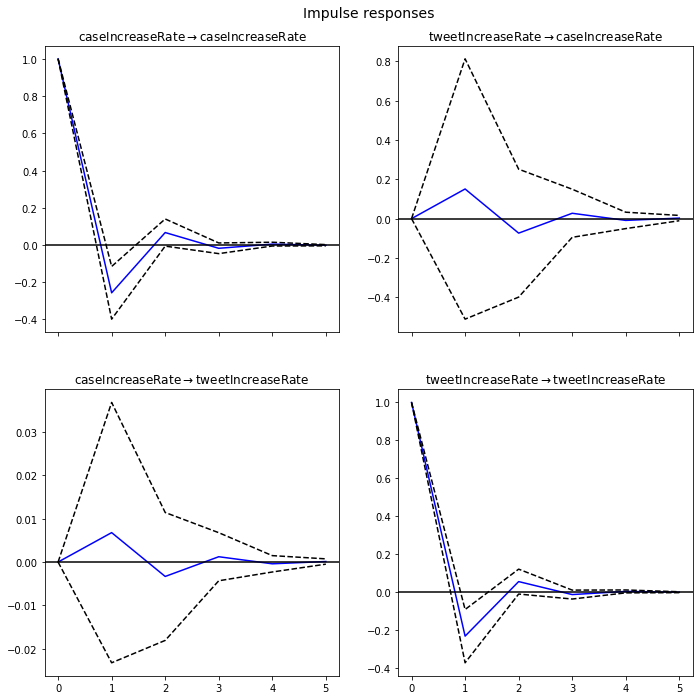

In [144]:
#impulse response function for next 5 days.
irf = model5_fit.irf(5)
irf.plot(orth=False)

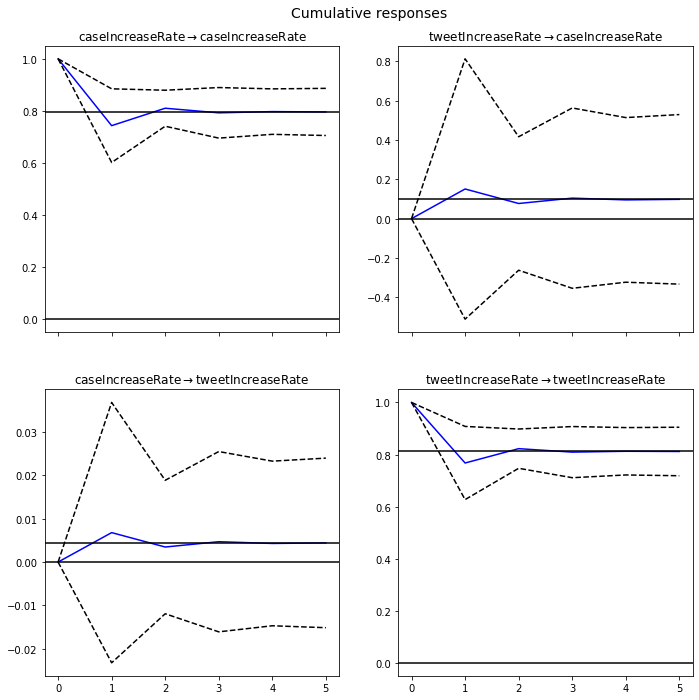

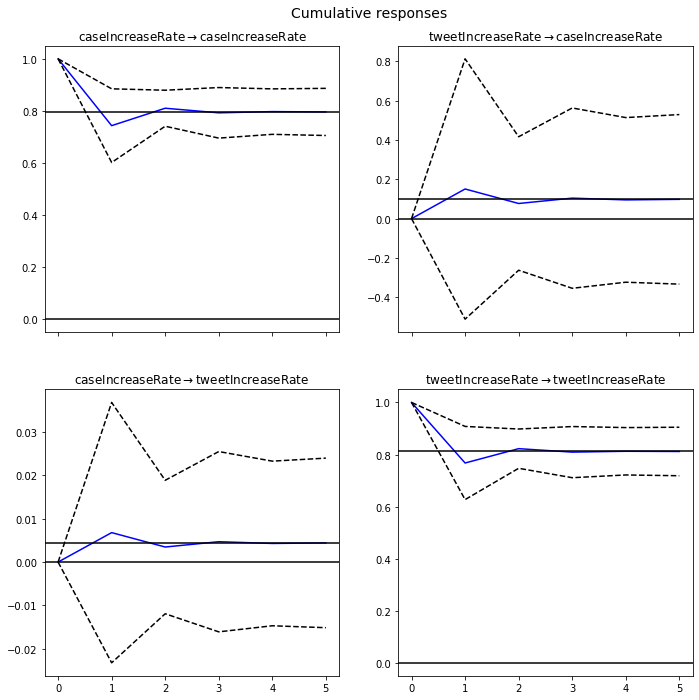

In [145]:
# The cumulative effects  
# where each period is the sum of the current and previous period response values
irf.plot_cum_effects(orth=False)

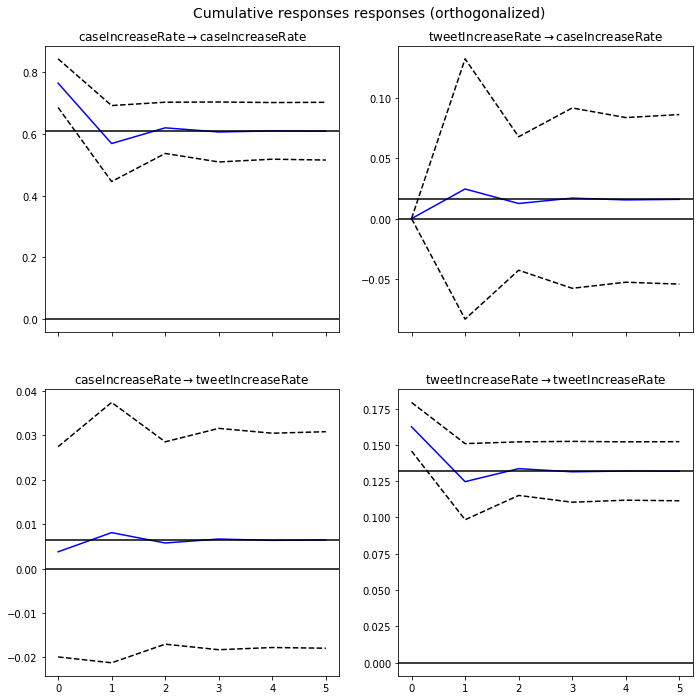

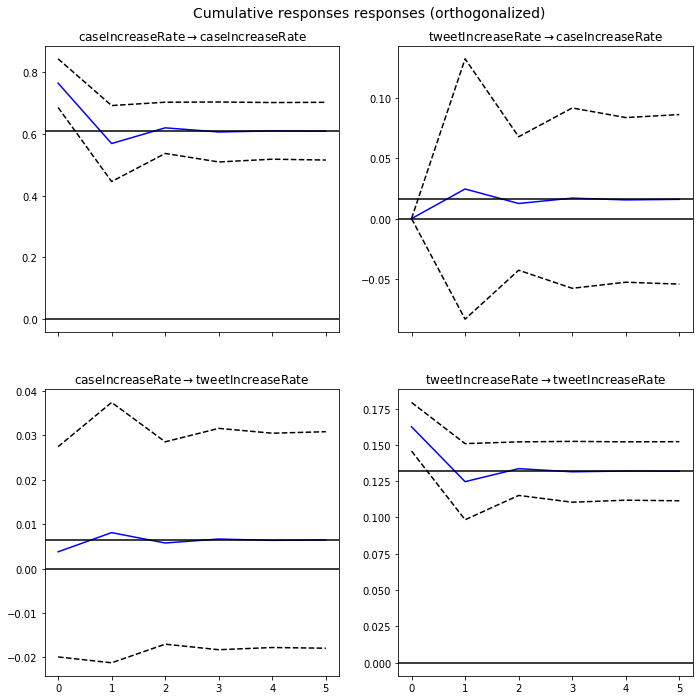

In [146]:
irf.plot_cum_effects(orth=True)

In [147]:
#Grangers causality tweetCount with respect to caseCount
feedBackLoop = model5_fit.test_causality('caseIncreaseRate','tweetIncreaseRate', kind='f')
print(feedBackLoop)


<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: tweetIncreaseRate does not Granger-cause caseIncreaseRate: fail to reject at 5% significance level. Test statistic: 0.199, critical value: 3.868>, p-value: 0.656>


In [148]:
#Grangers causality caseCount with respect to tweetCount
feedBackLoop = model5_fit.test_causality('tweetIncreaseRate','caseIncreaseRate', kind='f')
print(feedBackLoop)

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: caseIncreaseRate does not Granger-cause tweetIncreaseRate: fail to reject at 5% significance level. Test statistic: 0.196, critical value: 3.868>, p-value: 0.658>


### Model 6:  Contra Costa county case Increase Rate vs Tweet Increase Rate using VECM

##### Cointegration rank

In [149]:
lag_order6 = select_order(tweets_cases_CC_df, maxlags=10, deterministic="ci", seasons=4)
lag_order6.summary()

,AIC,BIC,FPE,HQIC
0,-4.307,-4.050*,0.01347,-4.203*
1,-4.307,-3.976,0.01347,-4.173
2,-4.309*,-3.904,0.01346*,-4.145
3,-4.277,-3.799,0.01389,-4.083
4,-4.255,-3.704,0.01420,-4.032
5,-4.230,-3.605,0.01457,-3.977
6,-4.238,-3.540,0.01446,-3.955
7,-4.205,-3.434,0.01496,-3.892
8,-4.181,-3.336,0.01534,-3.838
9,-4.155,-3.237,0.01575,-3.782


In [150]:
vec_rank6 = select_coint_rank(tweets_cases_CC_df, det_order = -1, k_ar_diff = 0)
print(vec_rank6.rank)

2


In [151]:
vecm_model6 = VECM(endog = tweets_cases_CC_df, k_ar_diff = 0, coint_rank = 2, deterministic = 'ci')
vecm6_fit = vecm_model6.fit()
vecm6_fit.summary()

,coef,std err,z,P>|z|,[0.025,0.975]
ec1,-1.2567,0.072,-17.554,0.000,-1.397,-1.116
ec2,0.1508,0.335,0.450,0.653,-0.506,0.807
,coef,std err,z,P>|z|,[0.025,0.975]
ec1,0.0068,0.015,0.447,0.655,-0.023,0.037
ec2,-1.2326,0.071,-17.336,0.000,-1.372,-1.093
,coef,std err,z,P>|z|,[0.025,0.975]
beta.1,1.0000,0,0,0.000,1.000,1.000
beta.2,0,0,0,0.000,0,0
const,-0.1787,0.045,-3.975,0.000,-0.267,-0.091
,coef,std err,z,P>|z|,[0.025,0.975]


In [152]:
vecm6_fit.predict(steps=10)

array([[0.19777614, 0.04281668],
       [0.1790426 , 0.00036449],
       [0.1774518 , 0.0101121 ],
       [0.17932985, 0.00783389],
       [0.1785042 , 0.00837658],
       [0.178798  , 0.00824474],
       [0.17870269, 0.0082774 ],
       [0.17873208, 0.00826916],
       [0.17872329, 0.00827127],
       [0.17872587, 0.00827072]])

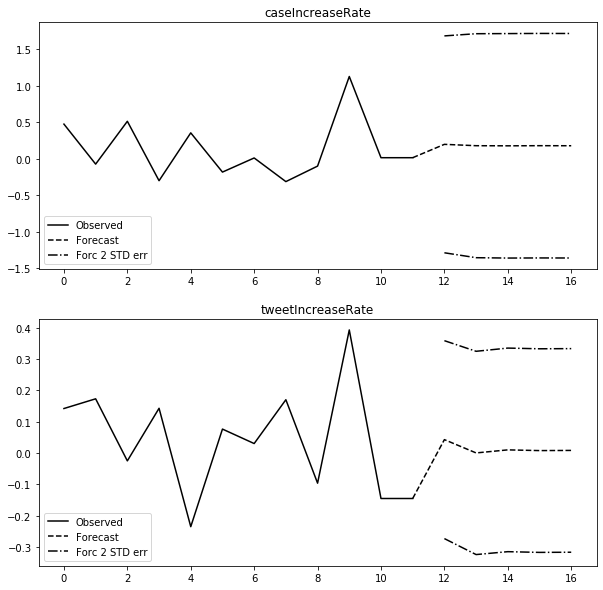

In [153]:
vecm6_fit.plot_forecast(steps=5, n_last_obs=12)

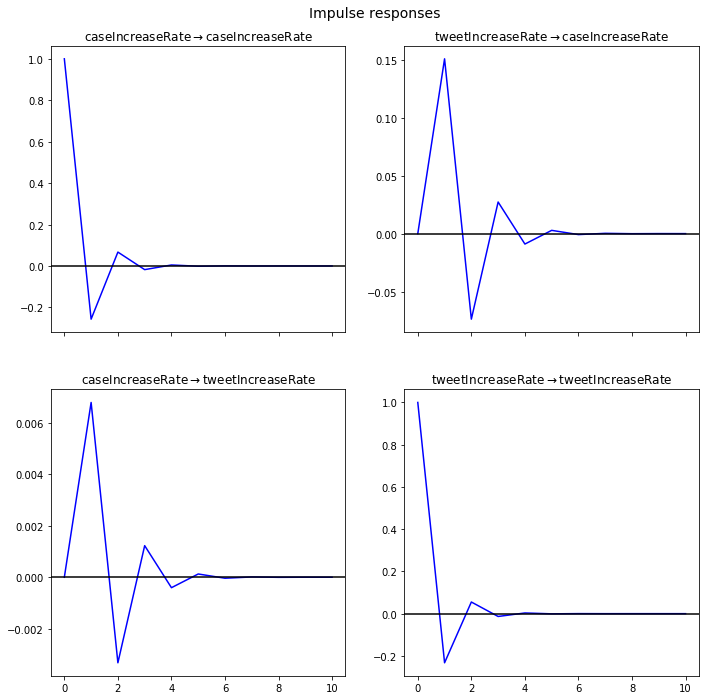

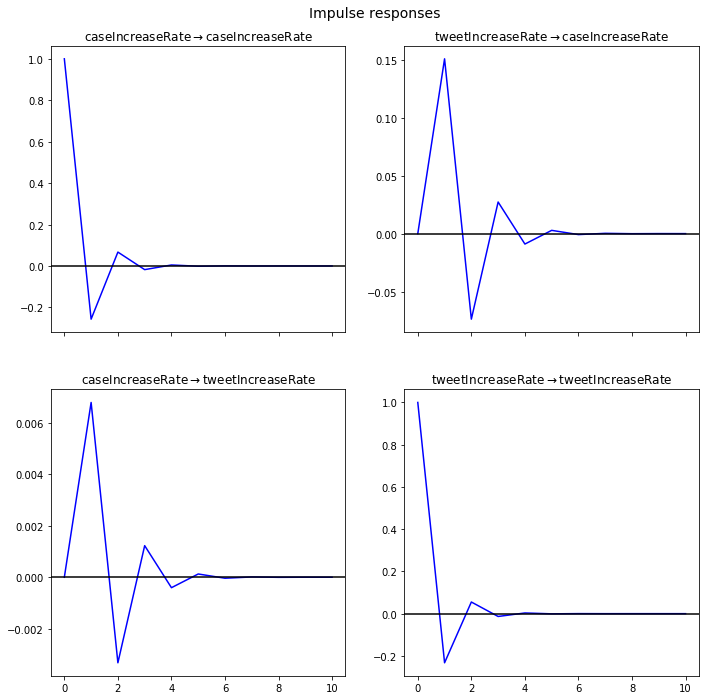

In [154]:
num_periods = 10
ir = vecm6_fit.irf(periods=num_periods)
ir.plot(plot_stderr=False)

In [155]:
granger_results = vecm6_fit.test_granger_causality(caused="tweetIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
0.003651,3.868,0.952,"(1, 350)"


In [156]:
granger_results = vecm6_fit.test_granger_causality(caused="caseIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
0.1185,3.868,0.731,"(1, 350)"


### Model 7: Contra Costa county Tweet Increase Rate vs Deaths Tweet Increase Rate using  VAR

In [157]:
modelData7 = pd.concat([contraCostaTweetDataCount['timePeriod'], contraCostaTweetDataCount['count'], contraCostaCaseCount['newcountdeaths'][:182]], axis=1, keys=['timePeriod', 'tweetCount', 'deathCount'])
modelData7.head()

,timePeriod,tweetCount,deathCount
0,2020-03-01,50,0
1,2020-03-02,56,0
2,2020-03-03,96,1
3,2020-03-04,83,0
4,2020-03-05,92,0


In [158]:
tweets_deaths_CC_df = modelData7[['tweetCount','deathCount']]

In [159]:
tweets_deaths_CC_df['tweetIncreaseRate'] = (tweets_deaths_CC_df['tweetCount']-tweets_deaths_CC_df['tweetCount'].shift(-1))/tweets_deaths_CC_df['tweetCount'].shift(-1)
tweets_deaths_CC_df['tweetIncreaseRate'][0] = tweets_deaths_CC_df['tweetIncreaseRate'][1]
tweets_deaths_CC_df.replace([np.inf, -np.inf], np.nan, inplace=True)
tweets_deaths_CC_df['tweetIncreaseRate'] = tweets_deaths_CC_df['tweetIncreaseRate'].fillna(method='ffill')

tweets_deaths_CC_df['deathIncreaseRate'] = (tweets_deaths_CC_df['deathCount']-tweets_deaths_CC_df['deathCount'].shift(-1))/tweets_deaths_CC_df['deathCount'].shift(-1)
tweets_deaths_CC_df['deathIncreaseRate'][0] = tweets_deaths_CC_df['deathIncreaseRate'][1]
tweets_deaths_CC_df.replace([np.inf, -np.inf], np.nan, inplace=True)
tweets_deaths_CC_df['deathIncreaseRate'] = tweets_deaths_CC_df['deathIncreaseRate'].fillna(method='ffill')

tweets_deaths_CC_df.drop(['tweetCount','deathCount'], axis=1, inplace=True)

#### Checking wheather the variables are stationary

In [160]:
print('Augmented Dickey-Fuller Test: Tweets')
augmented_dickey_fuller_statistics(tweets_deaths_CC_df['tweetIncreaseRate'])
print('Augmented Dickey-Fuller Test: Deaths')
augmented_dickey_fuller_statistics(tweets_deaths_CC_df['deathIncreaseRate']) 

Augmented Dickey-Fuller Test: Tweets
ADF Statistic: -7.153418
p-value: 0.000000
Critical Values:
	1%: -3.468
	5%: -2.878
	10%: -2.576
Augmented Dickey-Fuller Test: Deaths
ADF Statistic: -8.791793
p-value: 0.000000
Critical Values:
	1%: -3.467
	5%: -2.878
	10%: -2.575


Both the variables are stationary

#### Checking for Co integration in the time series

In [161]:
cointegration_test(tweets_deaths_CC_df)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
tweetIncreaseRate ::  43.28     > 12.3212   =>   True
deathIncreaseRate ::  12.88     > 4.1296    =>   True


The time series are cointegrated, they have statistically significant relationship.

In [162]:
model7 = VAR(tweets_deaths_CC_df)

##### Select the lag for the model

In [163]:
# Select order method for lag finder
x = model7.select_order(maxlags=15)
x.summary()

,AIC,BIC,FPE,HQIC
0,-3.217,-3.179,0.04009,-3.201
1,-3.455,-3.343*,0.03158,-3.410*
2,-3.426,-3.239,0.03252,-3.350
3,-3.435,-3.174,0.03223,-3.329
4,-3.421,-3.085,0.03270,-3.284
5,-3.502,-3.091,0.03016,-3.335
6,-3.493,-3.008,0.03043,-3.296
7,-3.470,-2.910,0.03114,-3.243
8,-3.436,-2.801,0.03224,-3.178
9,-3.430,-2.721,0.03244,-3.142


#### From select_order optimal lag is observed at a lag order of 11

In [164]:
model7_fit = model7.fit(1)
model7_fit.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Fri, 20, Nov, 2020
Time:                     18:49:29
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -3.21719
Nobs:                     181.000    HQIC:                  -3.28024
Log likelihood:          -206.904    FPE:                  0.0360368
AIC:                     -3.32322    Det(Omega_mle):       0.0348713
--------------------------------------------------------------------
Results for equation tweetIncreaseRate
                          coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------------
const                        0.012737         0.012537            1.016           0.310
L1.tweetIncreaseRate        -0.230693         0.071626           -3.221           0.001
L1.deathIncreaseRate

### Plot autocurrelation function

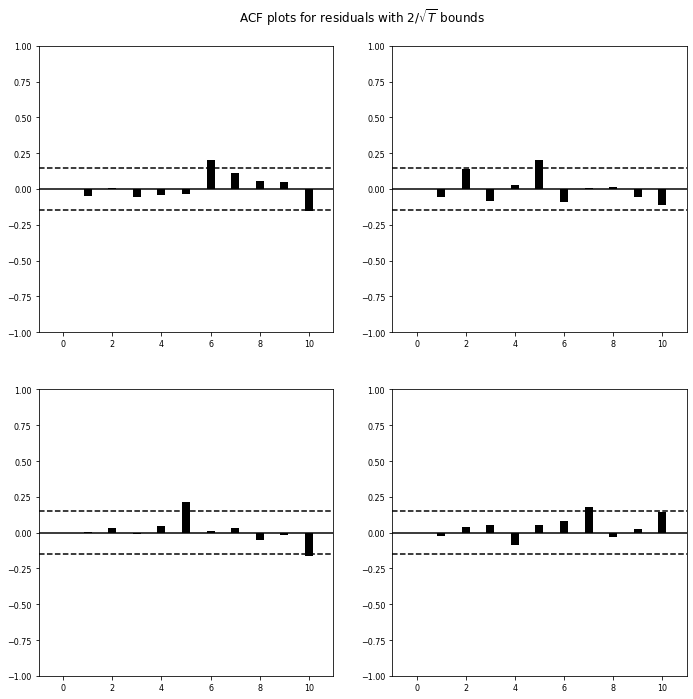

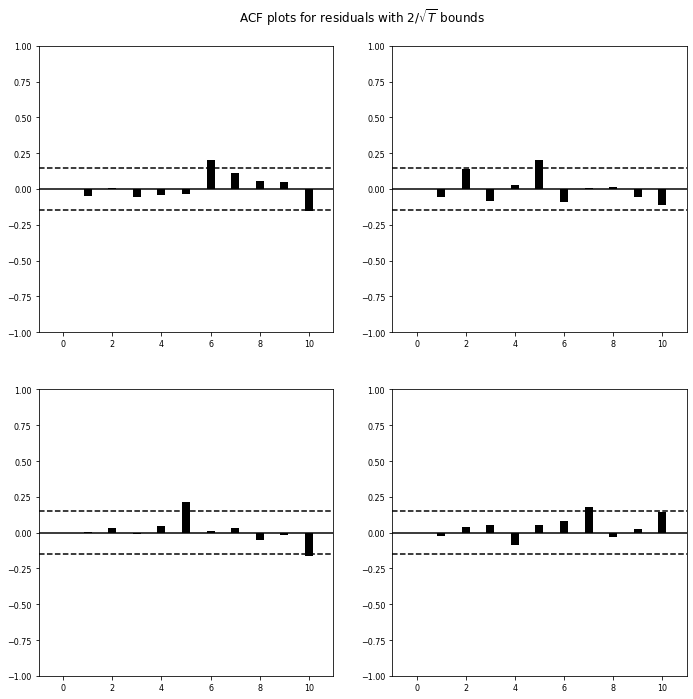

In [267]:
model7_fit.plot_acorr()

A moving average term in the data. The number of significant correlations indicates the order of the moving average term.


In [268]:
lag_order = model7_fit.k_ar
# In order to forecast, the VAR model expects up to the lag order number of observations from the past data.
# The model forecast 8 periods foreward
forecast = model7_fit.forecast(tweets_deaths_CC_df.values[-lag_order:],8)
print(forecast)

[[ 0.03884882 -0.71868936]
 [-0.00150562 -0.47482128]
 [ 0.00959576 -0.40638929]
 [ 0.00753757 -0.37113626]
 [ 0.00827142 -0.35854177]
 [ 0.00819467 -0.35299076]
 [ 0.00825316 -0.35083059]
 [ 0.00825554 -0.34992671]]


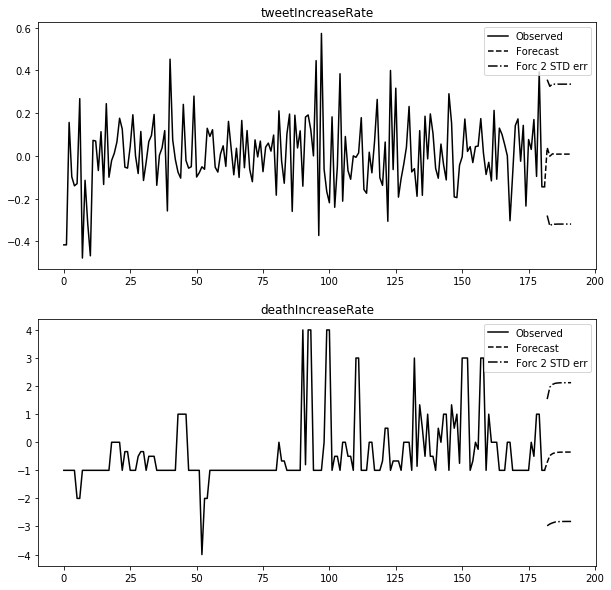

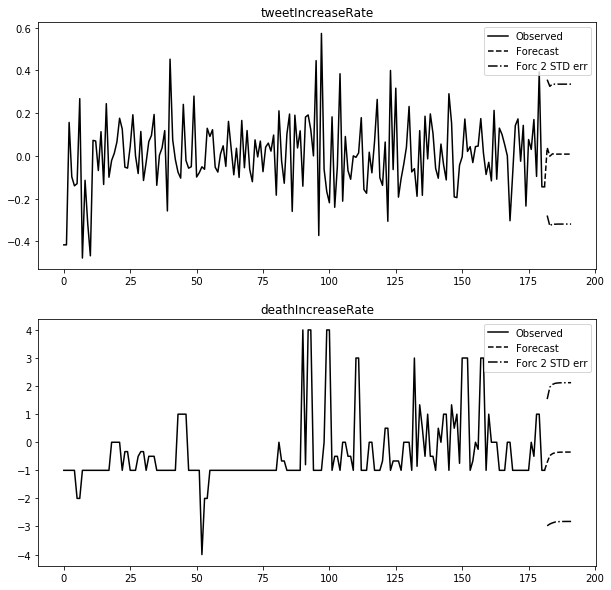

In [269]:
model7_fit.plot_forecast(steps=10)

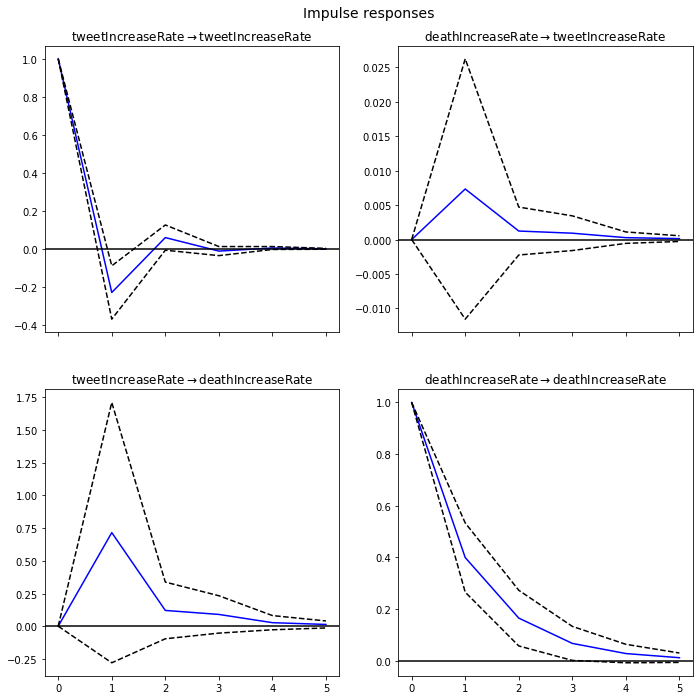

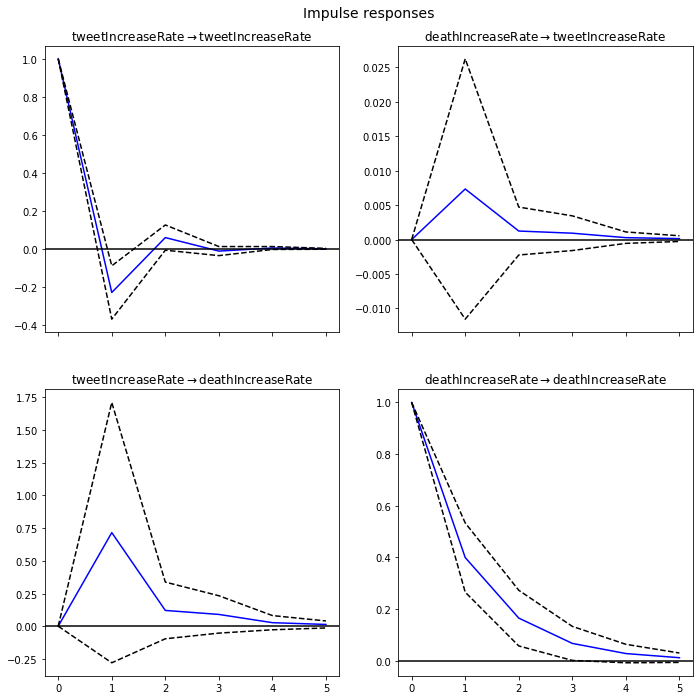

In [270]:
#impulse response function for next 5 days.
irf = model7_fit.irf(5)
irf.plot(orth=False)

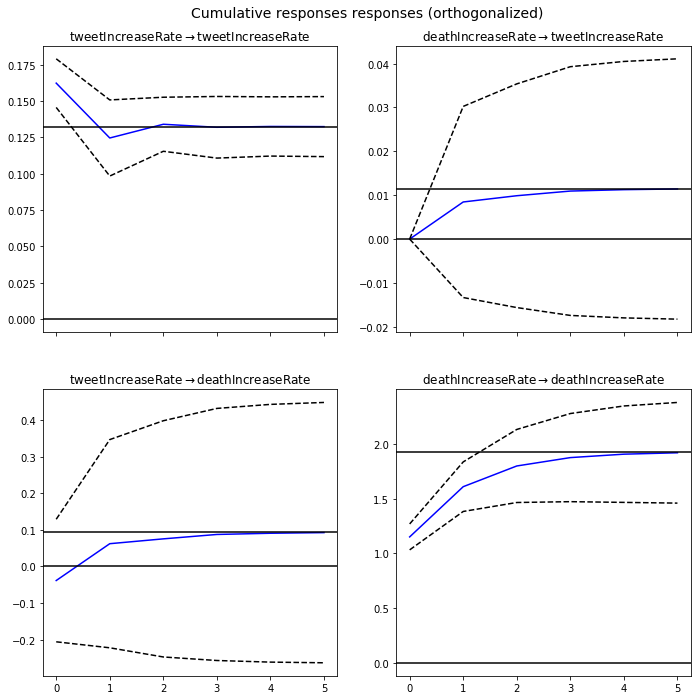

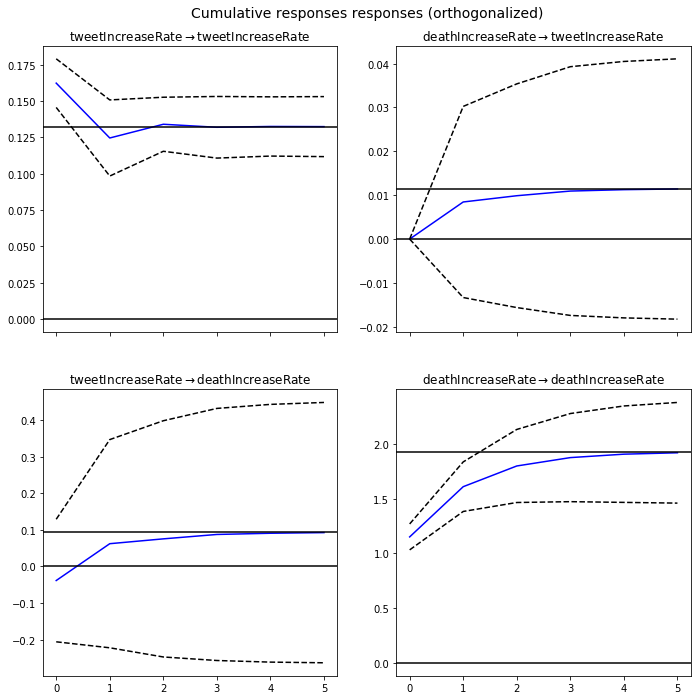

In [272]:
irf.plot_cum_effects(orth=True)

In [273]:
#Grangers causality tweetCount with respect to caseCount
feedBackLoop = model7_fit.test_causality('deathIncreaseRate','tweetIncreaseRate', kind='f')
print(feedBackLoop)

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: tweetIncreaseRate does not Granger-cause deathIncreaseRate: fail to reject at 5% significance level. Test statistic: 1.985, critical value: 3.868>, p-value: 0.160>


In [274]:
#Grangers causality tweetCount with respect to caseCount
feedBackLoop = model7_fit.test_causality('tweetIncreaseRate','deathIncreaseRate', kind='f')
print(feedBackLoop)

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: deathIncreaseRate does not Granger-cause tweetIncreaseRate: fail to reject at 5% significance level. Test statistic: 0.580, critical value: 3.868>, p-value: 0.447>


### Model 8:  Contra Costa county Tweet Increase Rate vs Deaths Increase Rate using VECM

#### Cointegration rank

In [275]:
lag_order8 = select_order(tweets_deaths_CC_df, maxlags=10, deterministic="ci", seasons=4)
lag_order8.summary()

,AIC,BIC,FPE,HQIC
0,-3.441,-3.184*,0.03203,-3.337*
1,-3.411,-3.080,0.03302,-3.277
2,-3.408,-3.004,0.03313,-3.244
3,-3.386,-2.909,0.03385,-3.192
4,-3.465,-2.914,0.03129,-3.242
5,-3.466,-2.842,0.03127,-3.213
6,-3.454,-2.756,0.03168,-3.171
7,-3.420,-2.649,0.03278,-3.107
8,-3.410,-2.565,0.03315,-3.067
9,-3.485*,-2.566,0.03080*,-3.112


In [223]:
vec_rank8 = select_coint_rank(tweets_deaths_CC_df, det_order = 1, k_ar_diff = 9)
print(vec_rank8.rank)

2


In [277]:
vecm_model8 = VECM(endog = tweets_deaths_CC_df, k_ar_diff = 0, coint_rank = 2, deterministic = 'ci')
vecm8_fit = vecm_model8.fit()
vecm8_fit.summary()

,coef,std err,z,P>|z|,[0.025,0.975]
ec1,-1.2307,0.071,-17.327,0.000,-1.370,-1.091
ec2,0.0073,0.010,0.768,0.443,-0.011,0.026
,coef,std err,z,P>|z|,[0.025,0.975]
ec1,0.7157,0.504,1.421,0.155,-0.272,1.703
ec2,-0.6010,0.068,-8.855,0.000,-0.734,-0.468
,coef,std err,z,P>|z|,[0.025,0.975]
beta.1,1.0000,0,0,0.000,1.000,1.000
beta.2,1.735e-18,0,0,0.000,1.73e-18,1.73e-18
const,-0.0083,0.010,-0.843,0.399,-0.027,0.011
,coef,std err,z,P>|z|,[0.025,0.975]


In [278]:
vecm8_fit.predict(steps=10)

array([[ 0.03884882, -0.71868936],
       [-0.00150562, -0.47482128],
       [ 0.00959576, -0.40638929],
       [ 0.00753757, -0.37113626],
       [ 0.00827142, -0.35854177],
       [ 0.00819467, -0.35299076],
       [ 0.00825316, -0.35083059],
       [ 0.00825554, -0.34992671],
       [ 0.00826163, -0.34956432],
       [ 0.00826289, -0.34941535]])

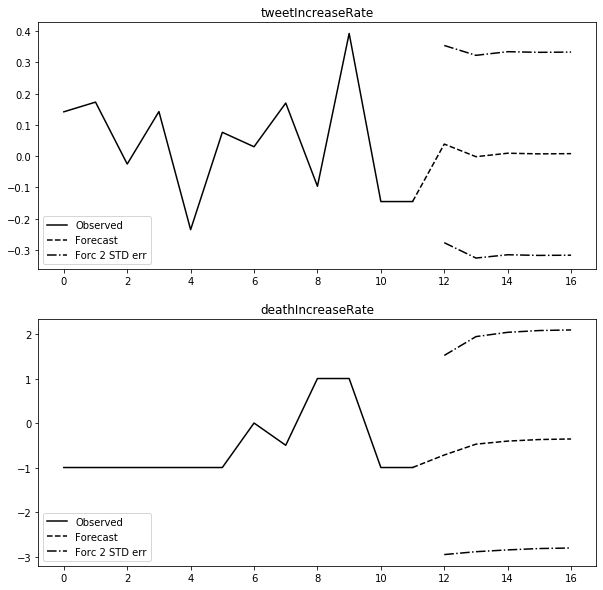

In [279]:
vecm8_fit.plot_forecast(steps=5, n_last_obs=12)

In [280]:
granger_results = vecm8_fit.test_granger_causality(caused="tweetIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
0.007357,3.868,0.932,"(1, 350)"


In [281]:
granger_results = vecm8_fit.test_granger_causality(caused="deathIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
1.978,3.868,0.160,"(1, 350)"


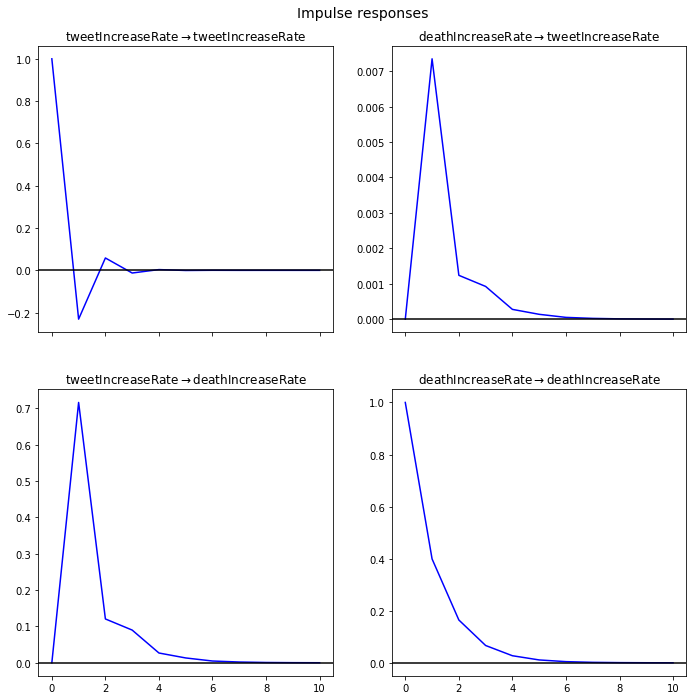

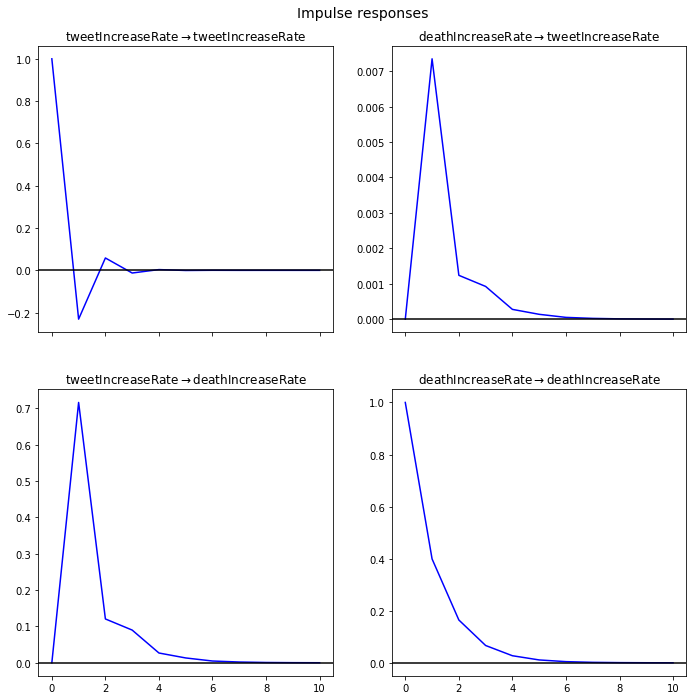

In [282]:
num_periods = 10
ir = vecm8_fit.irf(periods=num_periods)
ir.plot(plot_stderr=False)

In [283]:
santaClaraTweetDataCount
santaClaraCaseCount 

,county,totalcountconfirmed,totalcountdeaths,newcountconfirmed,newcountdeaths,date
0,Santa Clara,151,6,151,6,2020-03-18T00:00:00
1,Santa Clara,183,8,32,2,2020-03-19T00:00:00
2,Santa Clara,246,8,63,0,2020-03-20T00:00:00
3,Santa Clara,269,10,23,2,2020-03-21T00:00:00
4,Santa Clara,284,13,15,3,2020-03-22T00:00:00
...,...,...,...,...,...,...
182,Santa Clara,19684,293,74,6,2020-09-16T00:00:00
183,Santa Clara,19825,295,141,2,2020-09-17T00:00:00
184,Santa Clara,20058,295,233,0,2020-09-18T00:00:00
185,Santa Clara,20170,296,112,1,2020-09-19T00:00:00


### Model 9: Santa Clara county Case Increase Rate vs Tweet Increse Rate using VAR

In [284]:
modelData9 = pd.concat([santaClaraTweetDataCount['timePeriod'], santaClaraTweetDataCount['count'], santaClaraCaseCount['newcountconfirmed'][:182]], axis=1, keys=['timePeriod', 'tweetCount', 'caseCount'])
modelData9.head()

,timePeriod,tweetCount,caseCount
0,2020-03-01,26,151
1,2020-03-02,27,32
2,2020-03-03,37,63
3,2020-03-04,45,23
4,2020-03-05,45,15


In [285]:
tweets_cases_SC_df = modelData9[['tweetCount','caseCount']]

In [286]:
tweets_cases_SC_df['caseIncreaseRate'] = (tweets_cases_SC_df['caseCount']-tweets_cases_SC_df['caseCount'].shift(-1))/tweets_cases_SC_df['caseCount'].shift(-1)
tweets_cases_SC_df['caseIncreaseRate'] = tweets_cases_SC_df['caseIncreaseRate'].fillna(method='ffill')
tweets_cases_SC_df['caseIncreaseRate'][0] = tweets_cases_SC_df['caseIncreaseRate'][1]

tweets_cases_SC_df['tweetIncreaseRate'] = (tweets_cases_SC_df['tweetCount']-tweets_cases_SC_df['tweetCount'].shift(-1))/tweets_cases_SC_df['tweetCount'].shift(-1)
tweets_cases_SC_df['tweetIncreaseRate'] = tweets_cases_SC_df['tweetIncreaseRate'].fillna(method='ffill')
tweets_cases_SC_df['tweetIncreaseRate'][0] = tweets_cases_SC_df['tweetIncreaseRate'][1]

tweets_cases_SC_df.drop(['tweetCount','caseCount'], axis=1, inplace = True)

#### Checking wheather the variables are stationary

In [287]:
print('Augmented Dickey-Fuller Test: Tweets')
augmented_dickey_fuller_statistics(tweets_cases_SC_df['tweetIncreaseRate'])
print('Augmented Dickey-Fuller Test: Cases')
augmented_dickey_fuller_statistics(tweets_cases_SC_df['caseIncreaseRate']) 

Augmented Dickey-Fuller Test: Tweets
ADF Statistic: -6.572434
p-value: 0.000000
Critical Values:
	1%: -3.468
	5%: -2.878
	10%: -2.576
Augmented Dickey-Fuller Test: Cases
ADF Statistic: -3.270080
p-value: 0.016270
Critical Values:
	1%: -3.469
	5%: -2.879
	10%: -2.576


Both the variables have p-value less than 0.5 which implies they are stationary

#### Checking for Co integration in the time series

In [288]:
cointegration_test(tweets_cases_SC_df)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
caseIncreaseRate ::  47.45     > 12.3212   =>   True
tweetIncreaseRate ::  13.2      > 4.1296    =>   True


In [289]:
model9 = VAR(tweets_cases_SC_df)

##### Select the lag for the model.

In [290]:
# Select order method for lag finder
x = model9.select_order(maxlags=15)
x.summary()

,AIC,BIC,FPE,HQIC
0,-2.492,-2.455,0.08274,-2.477
1,-2.706,-2.594*,0.06683,-2.660
2,-2.739,-2.552,0.06467,-2.663*
3,-2.749,-2.487,0.06403,-2.642
4,-2.786,-2.450,0.06168,-2.650
5,-2.765,-2.354,0.06302,-2.598
6,-2.744,-2.259,0.06432,-2.547
7,-2.876*,-2.316,0.05643*,-2.648
8,-2.853,-2.219,0.05772,-2.596
9,-2.833,-2.123,0.05896,-2.545


#### From select_order optimal lag is observed at a lag order of 7

In [292]:
model9_fit = model9.fit(1)
model9_fit.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 14, Nov, 2020
Time:                     20:00:11
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -2.39602
Nobs:                     181.000    HQIC:                  -2.45906
Log likelihood:          -281.220    FPE:                  0.0819176
AIC:                     -2.50205    Det(Omega_mle):       0.0792681
--------------------------------------------------------------------
Results for equation caseIncreaseRate
                          coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------------
const                        0.465194         0.107341            4.334           0.000
L1.caseIncreaseRate         -0.221312         0.073190           -3.024           0.002
L1.tweetIncreaseRate 

### Plot autocurrelation function

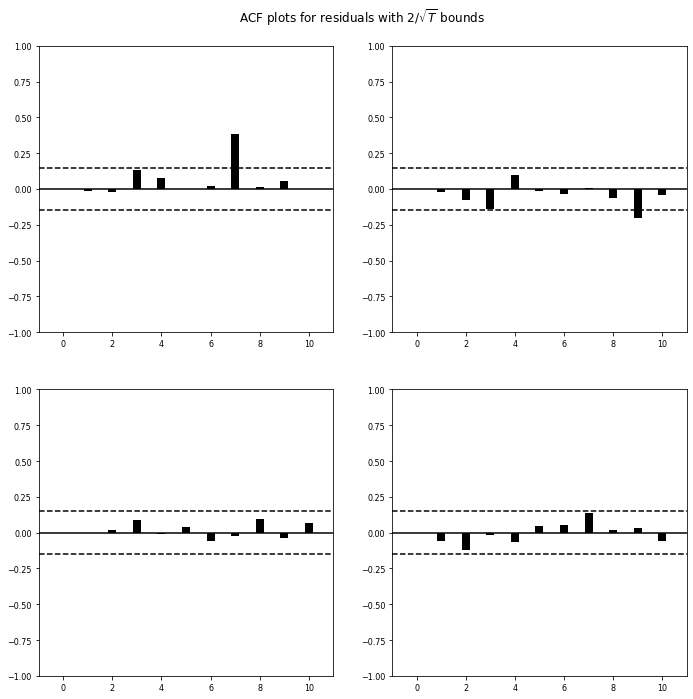

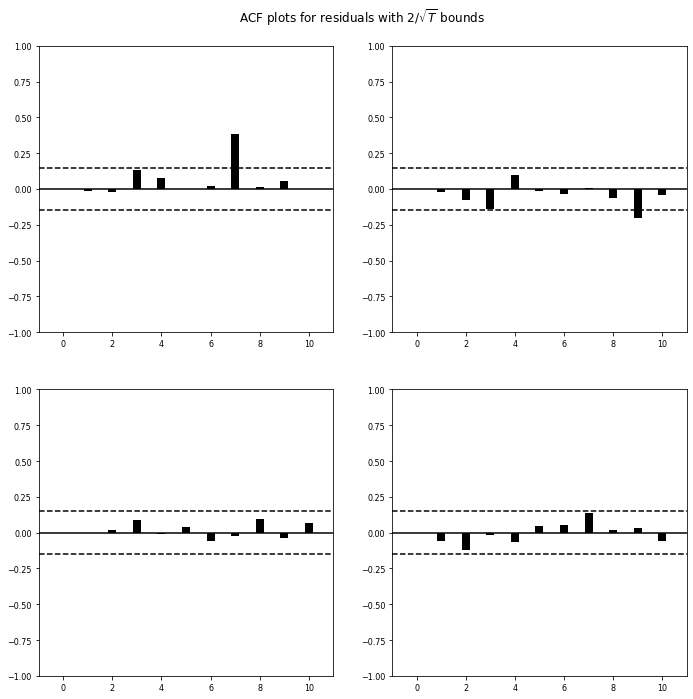

In [293]:
model9_fit.plot_acorr()

A moving average term in the data. The number of significant correlations indicates the order of the moving average term.

In [294]:
lag_order = model9_fit.k_ar
# In order to forecast, the VAR model expects up to the lag order number of observations from the past data.
# The model forecast 8 periods foreward
forecast = model9_fit.forecast(tweets_cases_SC_df.values[-lag_order:],8)
print(forecast)

[[ 0.40900273 -0.03644216]
 [ 0.36990974  0.03856813]
 [ 0.38837361  0.01462812]
 [ 0.38115573  0.02218695]
 [ 0.38374191  0.01981928]
 [ 0.38285984  0.02055647]
 [ 0.38315148  0.02032799]
 [ 0.38305705  0.02039856]]


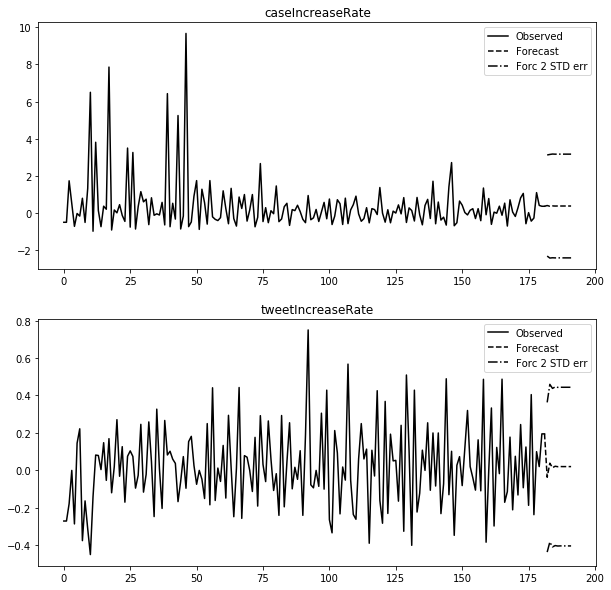

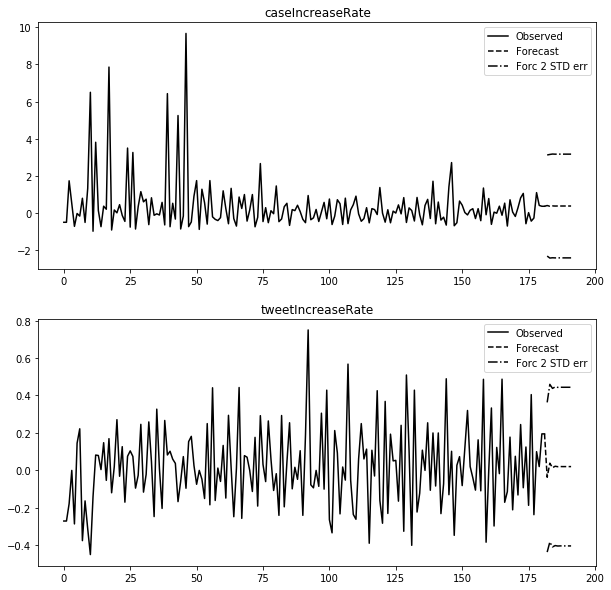

In [295]:
model9_fit.plot_forecast(steps=10)


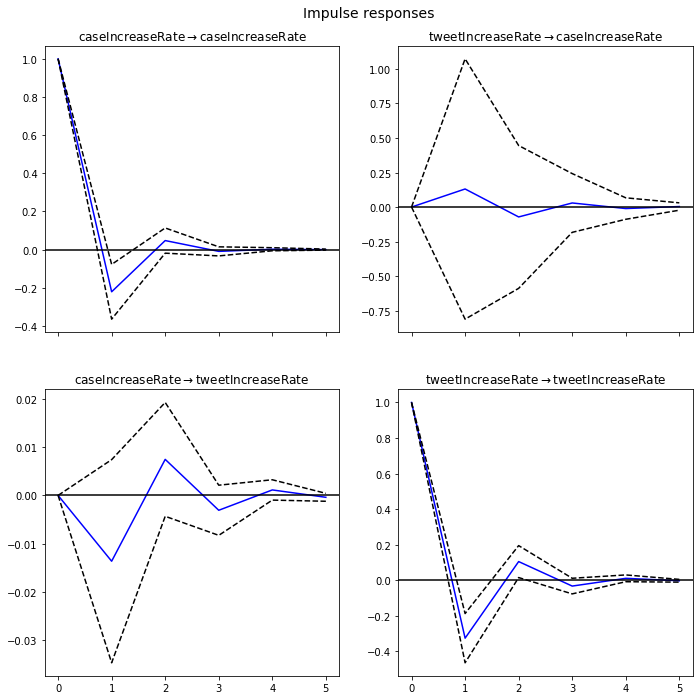

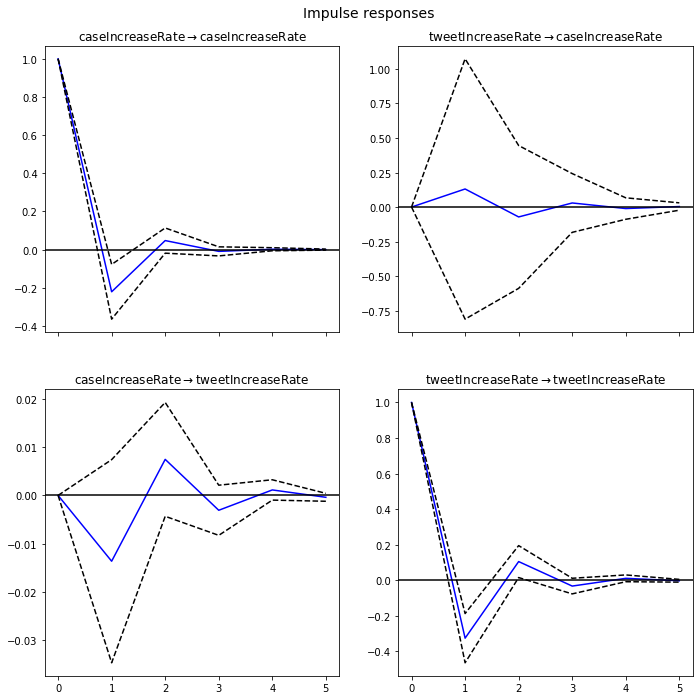

In [296]:
#impulse response function for next 5 days.
irf = model9_fit.irf(5)
irf.plot(orth=False)

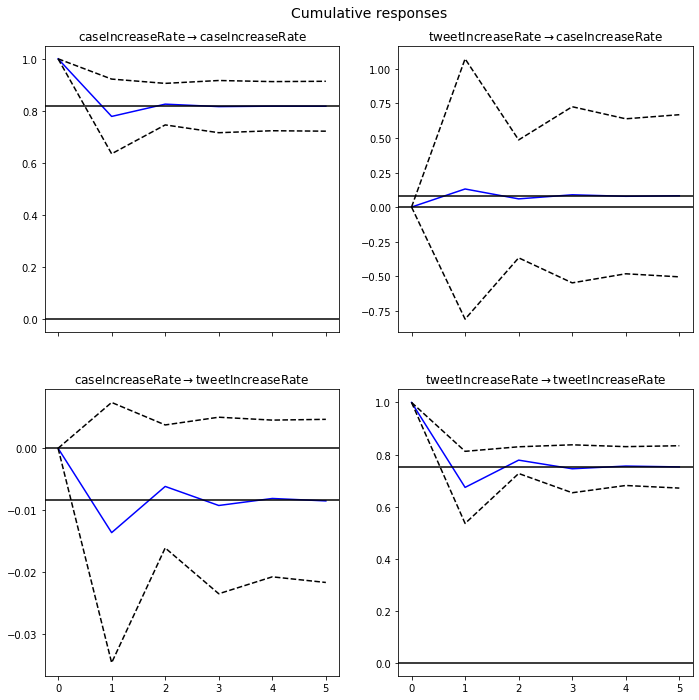

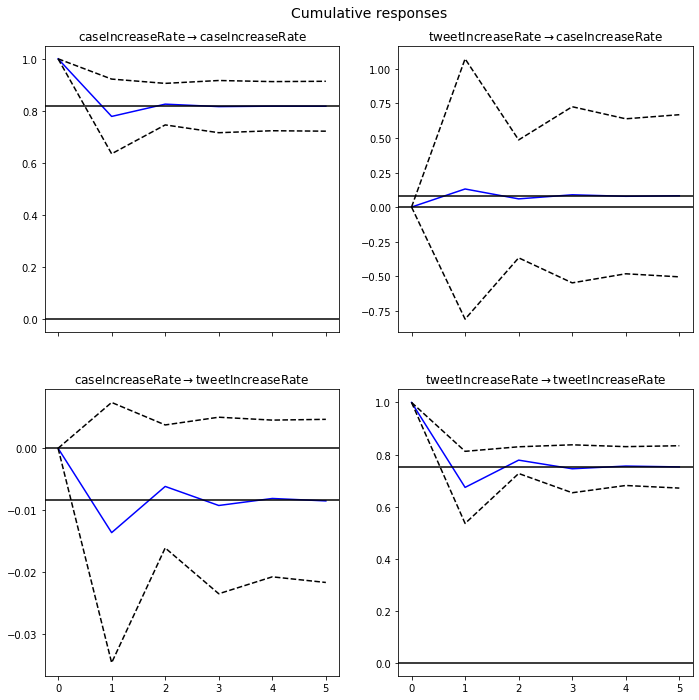

In [297]:
# The cumulative effects  
# where each period is the sum of the current and previous period response values
irf.plot_cum_effects(orth=False)

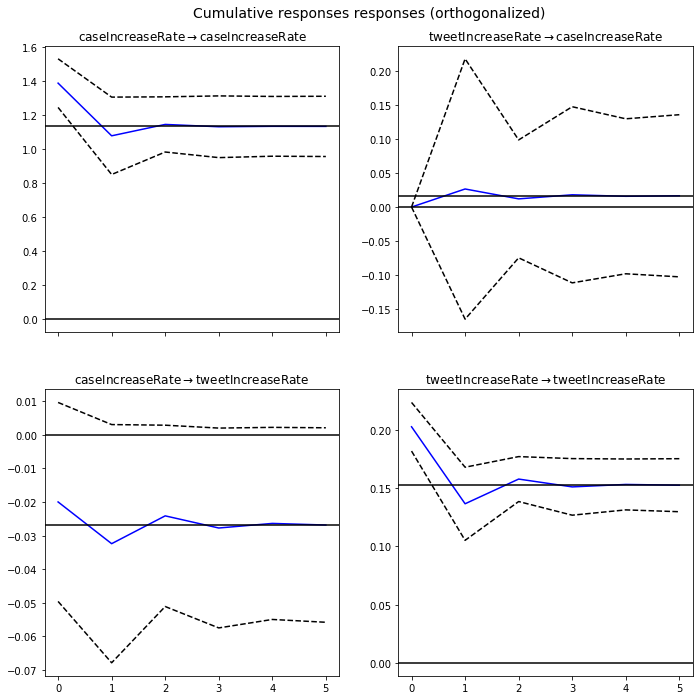

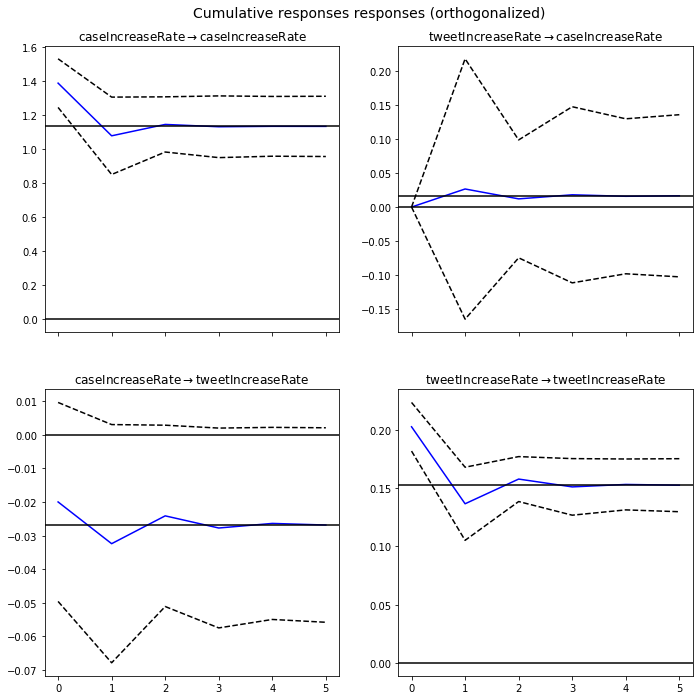

In [298]:
irf.plot_cum_effects(orth=True)

In [299]:
#Grangers causality tweetCount with respect to caseCount
feedBackLoop = model9_fit.test_causality('caseIncreaseRate','tweetIncreaseRate', kind='f')
print(feedBackLoop)

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: tweetIncreaseRate does not Granger-cause caseIncreaseRate: fail to reject at 5% significance level. Test statistic: 0.074, critical value: 3.868>, p-value: 0.786>


In [300]:
#Grangers causality caseCount with respect to tweetCount
feedBackLoop = model9_fit.test_causality('tweetIncreaseRate','caseIncreaseRate', kind='f')
print(feedBackLoop)

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: caseIncreaseRate does not Granger-cause tweetIncreaseRate: fail to reject at 5% significance level. Test statistic: 1.613, critical value: 3.868>, p-value: 0.205>


### Model 10: Santa Clara county Case Increase Rate vs Tweet Increse Rate VECM

##### Cointegration rank

In [73]:
lag_order10 = select_order(tweets_cases_SC_df, maxlags=10, deterministic="ci", seasons=4)
lag_order10.summary()

NameError: name 'tweets_cases_SC_df' is not defined

In [74]:
vec_rank10 = select_coint_rank(tweets_cases_SC_df, det_order = -1, k_ar_diff = 0)
print(vec_rank10.rank)

NameError: name 'tweets_cases_SC_df' is not defined

In [305]:
vecm_model10 = VECM(endog = tweets_cases_SC_df, k_ar_diff = 0, coint_rank = 2, deterministic = 'ci')
vecm10_fit = vecm_model10.fit()
vecm10_fit.summary()

,coef,std err,z,P>|z|,[0.025,0.975]
ec1,-1.2213,0.073,-16.827,0.000,-1.364,-1.079
ec2,0.1308,0.477,0.274,0.784,-0.804,1.065
,coef,std err,z,P>|z|,[0.025,0.975]
ec1,-0.0137,0.011,-1.281,0.200,-0.035,0.007
ec2,-1.3263,0.070,-18.926,0.000,-1.464,-1.189
,coef,std err,z,P>|z|,[0.025,0.975]
beta.1,1.0000,0,0,0.000,1.000,1.000
beta.2,0,0,0,0.000,0,0
const,-0.3831,0.084,-4.586,0.000,-0.547,-0.219
,coef,std err,z,P>|z|,[0.025,0.975]


In [306]:
vecm10_fit.predict(steps=10)

array([[ 0.40900273, -0.03644216],
       [ 0.36990974,  0.03856813],
       [ 0.38837361,  0.01462812],
       [ 0.38115573,  0.02218695],
       [ 0.38374191,  0.01981928],
       [ 0.38285984,  0.02055647],
       [ 0.38315148,  0.02032799],
       [ 0.38305705,  0.02039856],
       [ 0.38308718,  0.02037682],
       [ 0.38307767,  0.0203835 ]])

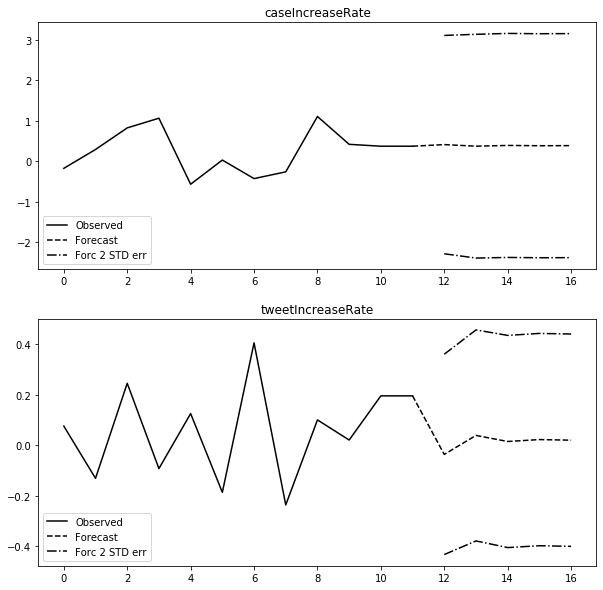

In [307]:
vecm10_fit.plot_forecast(steps=5, n_last_obs=12)

In [308]:
granger_results = vecm10_fit.test_granger_causality(caused="tweetIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
1.956,3.868,0.163,"(1, 350)"


In [309]:
granger_results = vecm10_fit.test_granger_causality(caused="caseIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
0.006023,3.868,0.938,"(1, 350)"


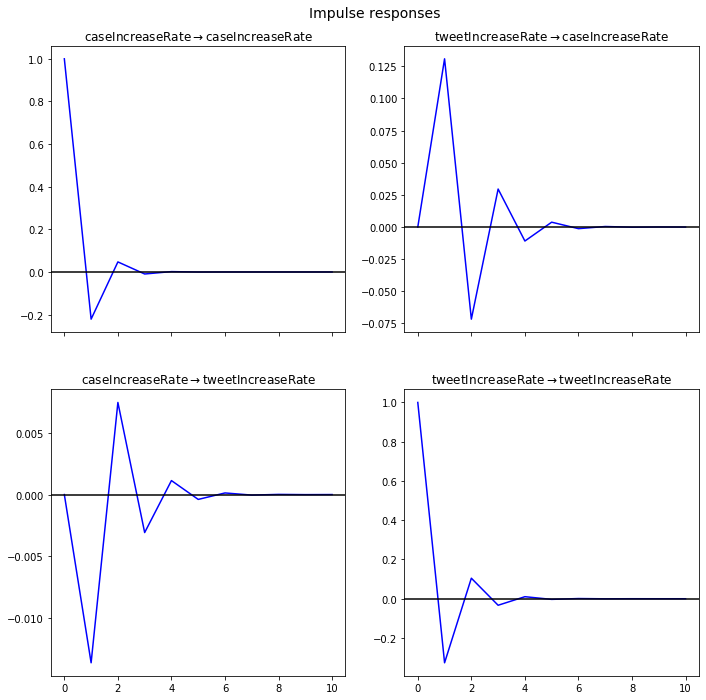

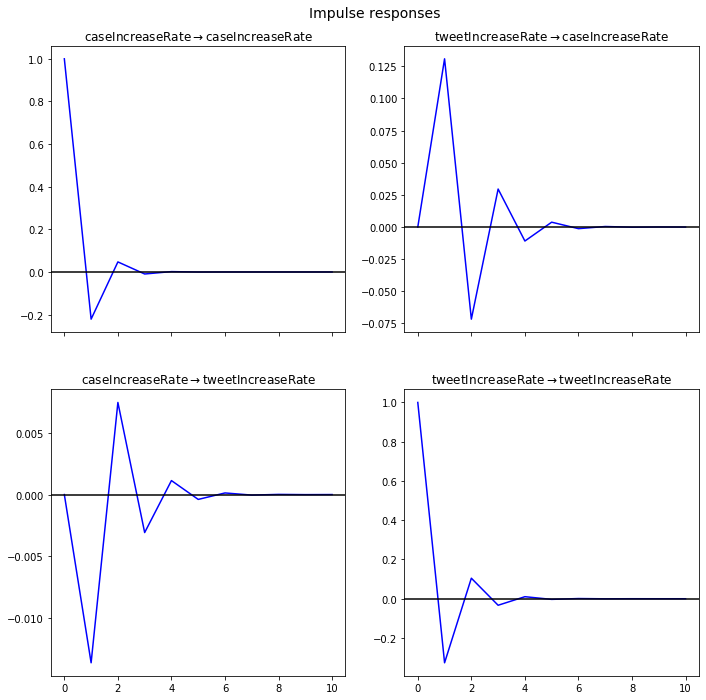

In [310]:
num_periods = 10
ir = vecm10_fit.irf(periods=num_periods)
ir.plot(plot_stderr=False)

### Model 11:  Santa Clara county Death Increase Rate vs Tweet Increse Rate VAR

In [311]:
modelData11 = pd.concat([santaClaraTweetDataCount['timePeriod'], santaClaraTweetDataCount['count'], santaClaraCaseCount['newcountdeaths'][:182]], axis=1, keys=['timePeriod', 'tweetCount', 'deathCount'])
modelData11.head()

,timePeriod,tweetCount,deathCount
0,2020-03-01,26,6
1,2020-03-02,27,2
2,2020-03-03,37,0
3,2020-03-04,45,2
4,2020-03-05,45,3


In [312]:
tweets_deaths_SC_df = modelData11[['tweetCount','deathCount']]

In [313]:
tweets_deaths_SC_df['deathIncreaseRate'] = (tweets_deaths_SC_df['deathCount']-tweets_deaths_SC_df['deathCount'].shift(-1))/tweets_deaths_SC_df['deathCount'].shift(-1)
tweets_deaths_SC_df['deathIncreaseRate'][0] = tweets_deaths_SC_df['deathIncreaseRate'][2]
tweets_deaths_SC_df['deathIncreaseRate'][0] = tweets_deaths_SC_df['deathIncreaseRate'][2]

tweets_deaths_SC_df.replace([np.inf, -np.inf], np.nan, inplace=True)
tweets_deaths_SC_df['deathIncreaseRate'] = tweets_deaths_SC_df['deathIncreaseRate'].fillna(method='ffill')

tweets_deaths_SC_df['tweetIncreaseRate'] = (tweets_deaths_SC_df['tweetCount']-tweets_deaths_SC_df['tweetCount'].shift(-1))/tweets_deaths_SC_df['tweetCount'].shift(-1)
tweets_deaths_SC_df['tweetIncreaseRate'][0] = tweets_deaths_SC_df['tweetIncreaseRate'][2]
tweets_deaths_SC_df['tweetIncreaseRate'][1] = tweets_deaths_SC_df['tweetIncreaseRate'][2]
tweets_deaths_SC_df.replace([np.inf, -np.inf], np.nan, inplace=True)
tweets_deaths_SC_df['tweetIncreaseRate'] = tweets_deaths_SC_df['tweetIncreaseRate'].fillna(method='ffill')


tweets_deaths_SC_df.drop(['tweetCount','deathCount'], axis=1, inplace = True)

In [314]:
np.savetxt(r'np.txt', tweets_deaths_SC_df)

#### Checking wheather the variables are stationary

In [315]:
print('Augmented Dickey-Fuller Test: Tweets')
augmented_dickey_fuller_statistics(tweets_deaths_SC_df['tweetIncreaseRate'])
print('Augmented Dickey-Fuller Test: Cases')
augmented_dickey_fuller_statistics(tweets_deaths_SC_df['deathIncreaseRate']) 

Augmented Dickey-Fuller Test: Tweets
ADF Statistic: -6.503209
p-value: 0.000000
Critical Values:
	1%: -3.468
	5%: -2.878
	10%: -2.576
Augmented Dickey-Fuller Test: Cases
ADF Statistic: -7.102351
p-value: 0.000000
Critical Values:
	1%: -3.467
	5%: -2.878
	10%: -2.575


#### Checking for Co integration in the time series

In [316]:
cointegration_test(tweets_deaths_SC_df)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
deathIncreaseRate ::  55.31     > 12.3212   =>   True
tweetIncreaseRate ::  20.2      > 4.1296    =>   True


The time series are cointegrated, they have statistically significant relationship.

In [317]:
model11 = VAR(tweets_deaths_SC_df)

##### Select the lag for the model

In [318]:
# Select order method for lag finder
x = model11.select_order(maxlags=15)
x.summary()

,AIC,BIC,FPE,HQIC
0,-2.318,-2.281,0.09843,-2.303
1,-2.617,-2.505*,0.07305,-2.571
2,-2.658,-2.471,0.07011,-2.582*
3,-2.684,-2.423,0.06828,-2.578
4,-2.700*,-2.364,0.06721*,-2.564
5,-2.686,-2.276,0.06815,-2.520
6,-2.685,-2.199,0.06827,-2.488
7,-2.673,-2.112,0.06915,-2.445
8,-2.637,-2.002,0.07167,-2.380
9,-2.604,-1.895,0.07412,-2.316


#### From select_order optimal lag is observed at a lag order of 4

In [320]:
model11_fit = model11.fit(1)
model11_fit.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 14, Nov, 2020
Time:                     20:06:38
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -2.43831
Nobs:                     181.000    HQIC:                  -2.50136
Log likelihood:          -277.393    FPE:                  0.0785252
AIC:                     -2.54434    Det(Omega_mle):       0.0759855
--------------------------------------------------------------------
Results for equation deathIncreaseRate
                          coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------------
const                       -0.165309         0.102846           -1.607           0.108
L1.deathIncreaseRate         0.354533         0.070272            5.045           0.000
L1.tweetIncreaseRate

### Plot autocurrelation function

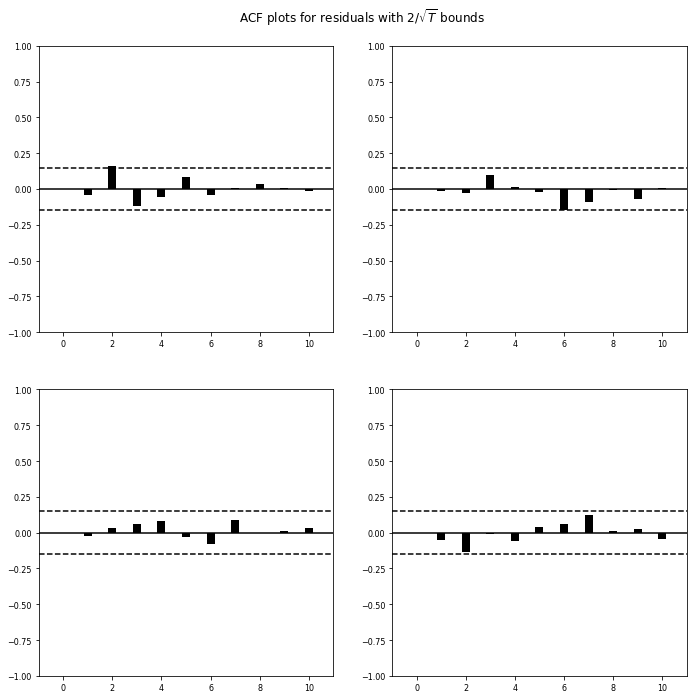

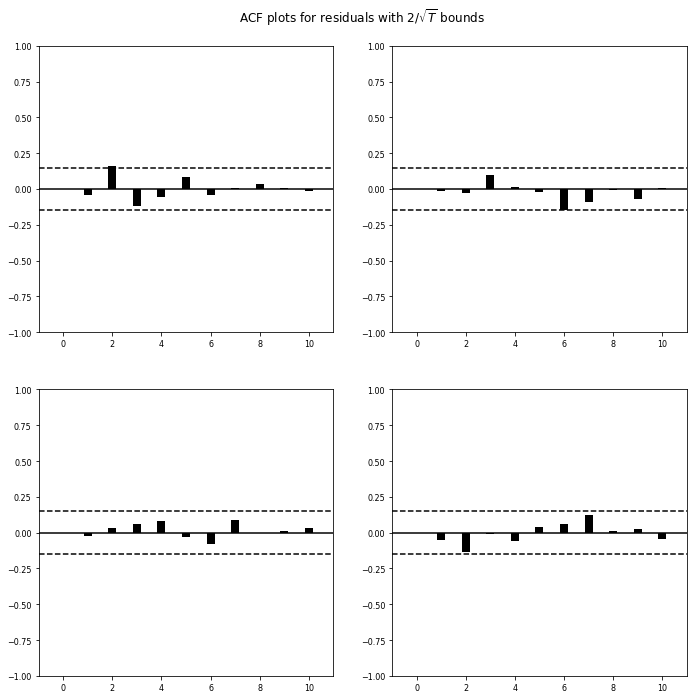

In [321]:
model11_fit.plot_acorr()

A moving average term in the data. The number of significant correlations indicates the order of the moving average term.


In [322]:
lag_order = model11_fit.k_ar
# In order to forecast, the VAR model expects up to the lag order number of observations from the past data.
# The model forecast 8 periods foreward
forecast = model11_fit.forecast(tweets_deaths_SC_df.values[-lag_order:],8)
print(forecast)

[[-0.49196418 -0.03457067]
 [-0.34466519  0.04019535]
 [-0.28176097  0.01496794]
 [-0.26306362  0.02315933]
 [-0.25526448  0.02038812]
 [-0.25289536  0.0212854 ]
 [-0.25192723  0.02098093]
 [-0.2516275   0.0210792 ]]


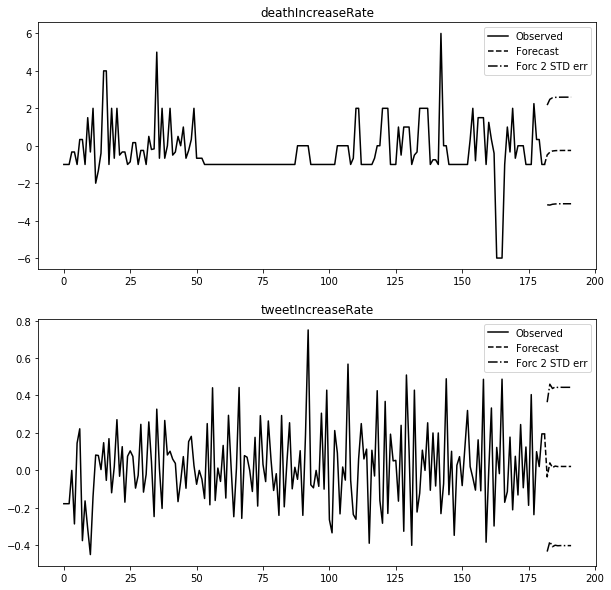

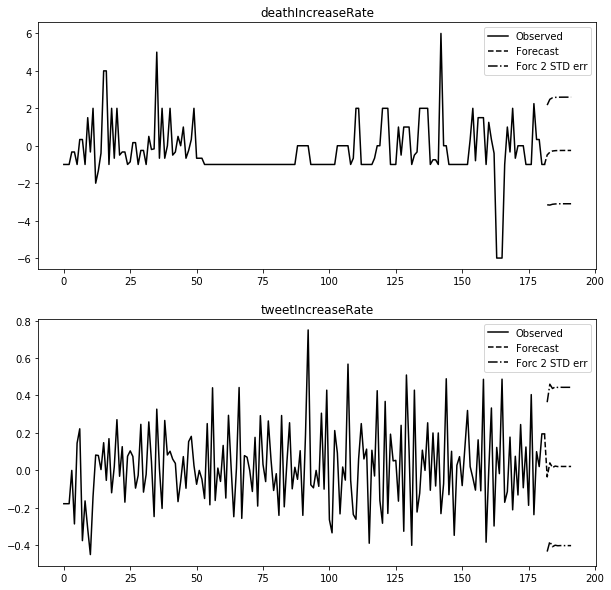

In [323]:
model11_fit.plot_forecast(steps=10)

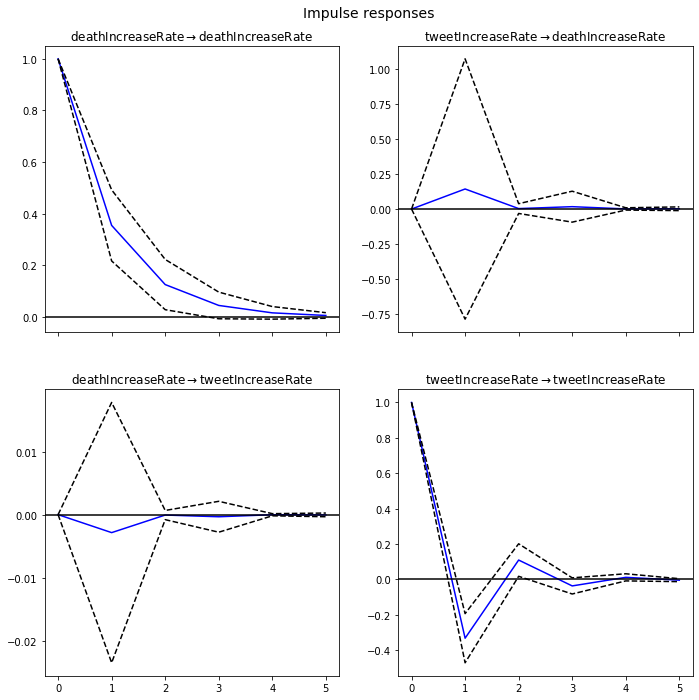

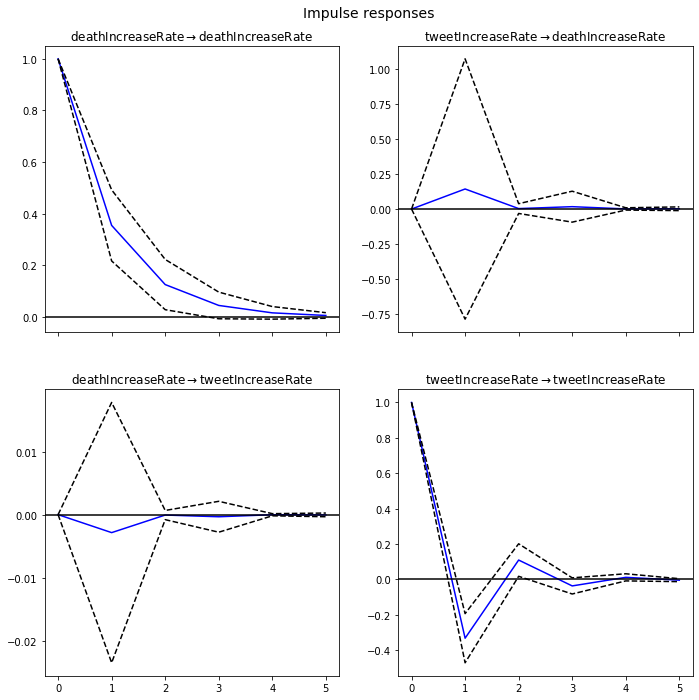

In [324]:
#impulse response function for next 5 days.
irf = model11_fit.irf(5)
irf.plot(orth=False)

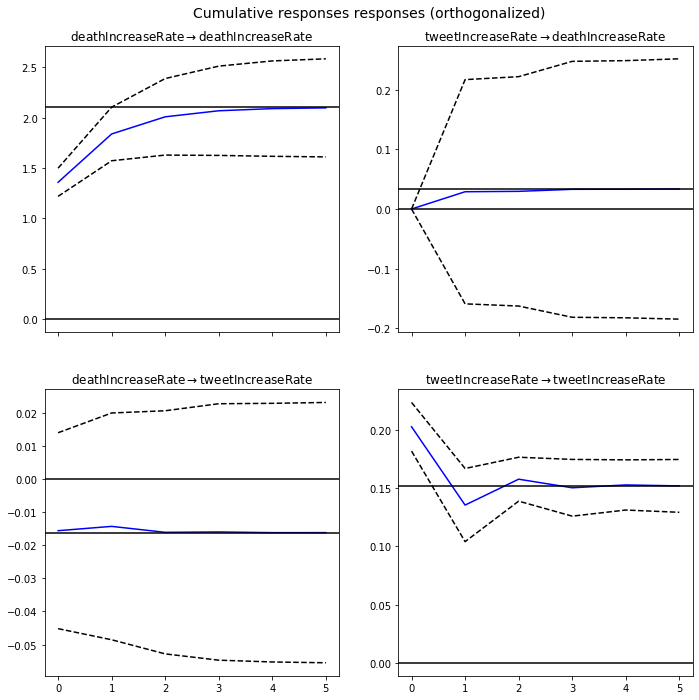

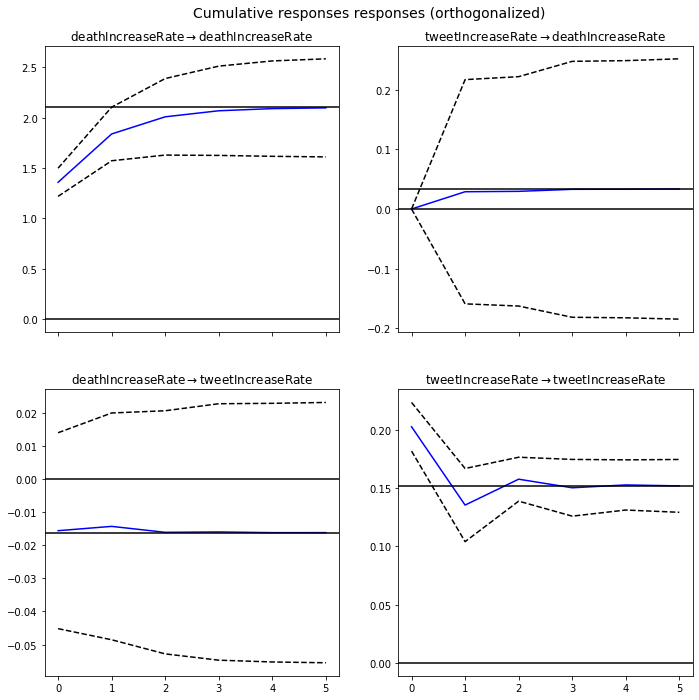

In [325]:
irf.plot_cum_effects(orth=True)

In [326]:
#Grangers causality tweetCount with respect to caseCount
feedBackLoop = model11_fit.test_causality('deathIncreaseRate','tweetIncreaseRate', kind='f')
print(feedBackLoop)

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: tweetIncreaseRate does not Granger-cause deathIncreaseRate: fail to reject at 5% significance level. Test statistic: 0.091, critical value: 3.868>, p-value: 0.763>


In [327]:
#Grangers causality tweetCount with respect to caseCount
feedBackLoop = model11_fit.test_causality('tweetIncreaseRate','deathIncreaseRate', kind='f')
print(feedBackLoop)

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: deathIncreaseRate does not Granger-cause tweetIncreaseRate: fail to reject at 5% significance level. Test statistic: 0.073, critical value: 3.868>, p-value: 0.787>


### Model 12:  Santa Clara county Tweet Increase Rate vs Deaths Increase Rate using VECM


#### Cointegration rank

In [328]:
lag_order12 = select_order(tweets_deaths_SC_df, maxlags=10, deterministic="ci", seasons=4)
lag_order12.summary()

,AIC,BIC,FPE,HQIC
0,-2.555,-2.297*,0.07772,-2.450*
1,-2.574,-2.243,0.07625,-2.440
2,-2.579*,-2.175,0.07584*,-2.415
3,-2.557,-2.079,0.07761,-2.363
4,-2.534,-1.982,0.07944,-2.310
5,-2.519,-1.894,0.08065,-2.265
6,-2.516,-1.818,0.08094,-2.233
7,-2.481,-1.709,0.08389,-2.168
8,-2.452,-1.607,0.08641,-2.109
9,-2.413,-1.494,0.08997,-2.040


In [271]:
vec_rank12 = select_coint_rank(tweets_deaths_SC_df, det_order = 1, k_ar_diff = 0)
print(vec_rank12.rank)

2


In [330]:
vecm_model12 = VECM(endog = tweets_deaths_SC_df, k_ar_diff = 0, coint_rank = 2, deterministic = 'ci')
vecm12_fit = vecm_model12.fit()
vecm12_fit.summary()

,coef,std err,z,P>|z|,[0.025,0.975]
ec1,-0.6455,0.070,-9.262,0.000,-0.782,-0.509
ec2,0.1429,0.469,0.304,0.761,-0.777,1.063
,coef,std err,z,P>|z|,[0.025,0.975]
ec1,-0.0028,0.010,-0.273,0.785,-0.023,0.018
ec2,-1.3318,0.070,-18.956,0.000,-1.470,-1.194
,coef,std err,z,P>|z|,[0.025,0.975]
beta.1,1.0000,0,0,0.000,1.000,1.000
beta.2,0,0,0,0.000,0,0
const,0.2514,0.155,1.623,0.105,-0.052,0.555
,coef,std err,z,P>|z|,[0.025,0.975]


In [331]:
vecm12_fit.predict(steps=10)

array([[-0.49196418, -0.03457067],
       [-0.34466519,  0.04019535],
       [-0.28176097,  0.01496794],
       [-0.26306362,  0.02315933],
       [-0.25526448,  0.02038812],
       [-0.25289536,  0.0212854 ],
       [-0.25192723,  0.02098093],
       [-0.2516275 ,  0.0210792 ],
       [-0.25150719,  0.02104574],
       [-0.25146932,  0.0210565 ]])

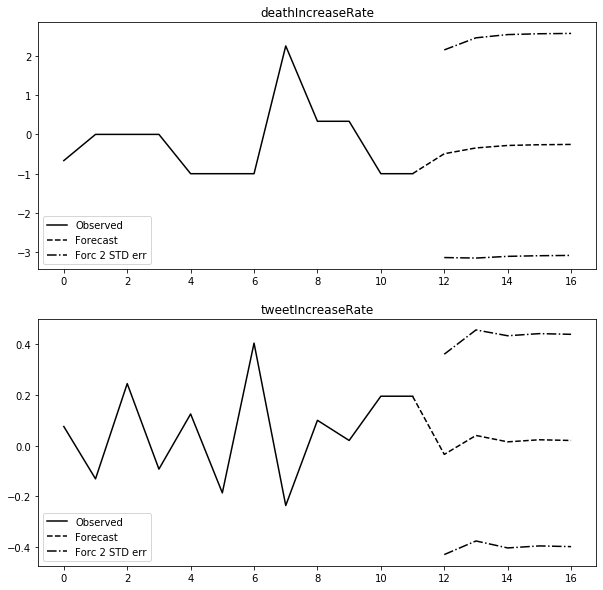

In [332]:
vecm12_fit.plot_forecast(steps=5, n_last_obs=12)

In [333]:
granger_results = vecm12_fit.test_granger_causality(caused="tweetIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
0.3996,3.868,0.528,"(1, 350)"


In [334]:
granger_results = vecm12_fit.test_granger_causality(caused="deathIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
4.298e-05,3.868,0.995,"(1, 350)"


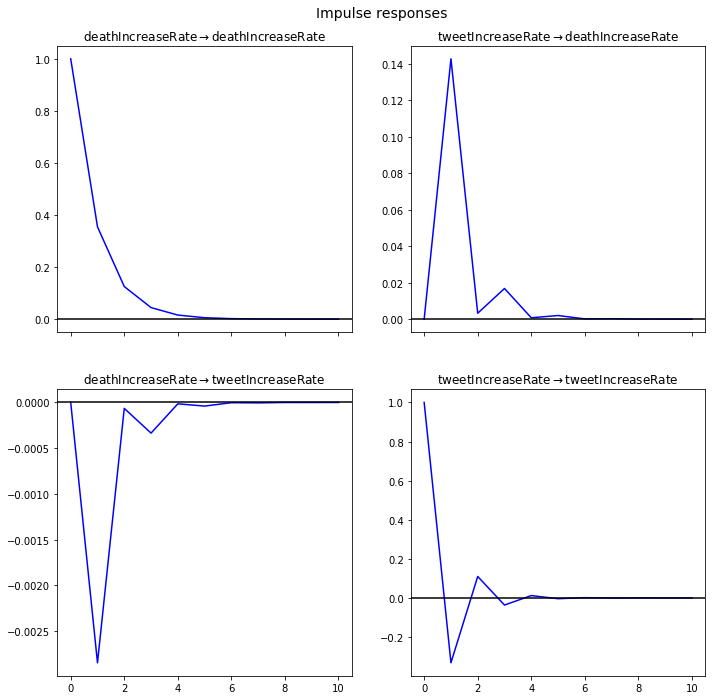

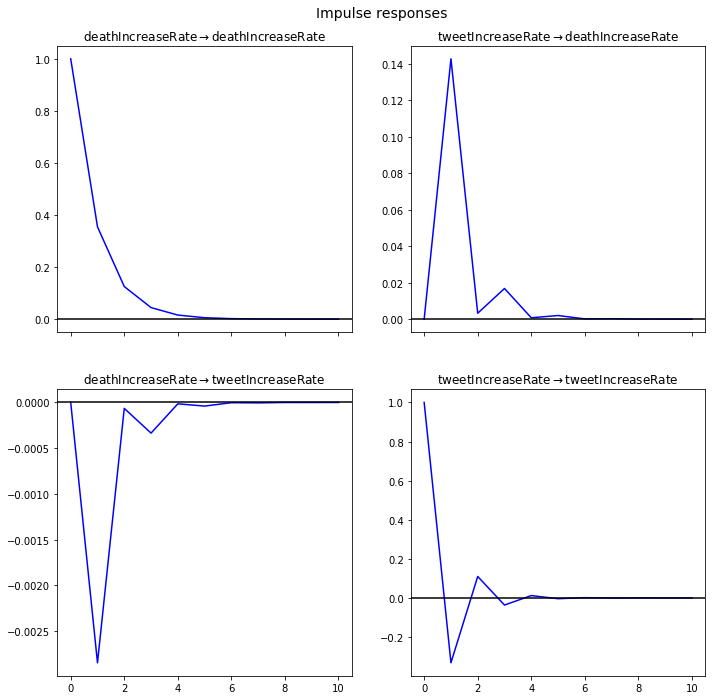

In [335]:
num_periods = 10
ir = vecm12_fit.irf(periods=num_periods)
ir.plot(plot_stderr=False)

### Model 13: Fresno county Case Increase Rate vs Tweet Increse Rate using VAR

In [336]:
modelData13 = pd.concat([fresnoTweetDataCount['timePeriod'], fresnoTweetDataCount['count'], fresnoCaseCount['newcountconfirmed'][:182]], axis=1, keys=['timePeriod', 'tweetCount', 'caseCount'])
modelData13.head()

,timePeriod,tweetCount,caseCount
0,2020-03-01,5,3.0
1,2020-03-02,5,3.0
2,2020-03-03,5,1.0
3,2020-03-04,7,1.0
4,2020-03-05,8,0.0


In [337]:
tweets_cases_F_df = modelData13[['tweetCount','caseCount']]

In [338]:
tweets_cases_F_df['caseIncreaseRate'] = (tweets_cases_F_df['caseCount']-tweets_cases_F_df['caseCount'].shift(-1))/tweets_cases_F_df['caseCount'].shift(-1)
tweets_cases_F_df.replace([np.inf, -np.inf], np.nan, inplace=True)
tweets_cases_F_df['caseIncreaseRate'] = tweets_cases_F_df['caseIncreaseRate'].fillna(method='ffill')
tweets_cases_F_df['caseIncreaseRate'][0] = tweets_cases_F_df['caseIncreaseRate'][1]

tweets_cases_F_df['tweetIncreaseRate'] = (tweets_cases_F_df['tweetCount']-tweets_cases_F_df['tweetCount'].shift(-1))/tweets_cases_F_df['tweetCount'].shift(-1)
tweets_cases_F_df.replace([np.inf, -np.inf], np.nan, inplace=True)
tweets_cases_F_df['tweetIncreaseRate'] = tweets_cases_F_df['tweetIncreaseRate'].fillna(method='ffill')
tweets_cases_F_df['tweetIncreaseRate'][0] = tweets_cases_F_df['tweetIncreaseRate'][1]

tweets_cases_F_df.drop(['tweetCount','caseCount'], axis=1, inplace = True)

In [339]:
np.savetxt(r'np.txt', tweets_cases_F_df)

#### Checking wheather the variables are stationary

In [340]:
print('Augmented Dickey-Fuller Test: Tweets')
augmented_dickey_fuller_statistics(tweets_cases_F_df['tweetIncreaseRate'])
print('Augmented Dickey-Fuller Test: Cases')
augmented_dickey_fuller_statistics(tweets_cases_F_df['caseIncreaseRate']) 

Augmented Dickey-Fuller Test: Tweets
ADF Statistic: -9.106070
p-value: 0.000000
Critical Values:
	1%: -3.468
	5%: -2.878
	10%: -2.576
Augmented Dickey-Fuller Test: Cases
ADF Statistic: -1.416815
p-value: 0.574189
Critical Values:
	1%: -3.470
	5%: -2.879
	10%: -2.576


Both the variables have p-value less than 0.5 which implies they are stationary

#### Checking for Co integration in the time series

In [341]:
cointegration_test(tweets_cases_F_df)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
caseIncreaseRate ::  47.87     > 12.3212   =>   True
tweetIncreaseRate ::  10.7      > 4.1296    =>   True


In [342]:
model13 = VAR(tweets_cases_F_df)

##### Select the lag for the model.

In [343]:
# Select order method for lag finder
x = model13.select_order(maxlags=15)
x.summary()

,AIC,BIC,FPE,HQIC
0,-1.622,-1.585,0.1974,-1.607
1,-1.772,-1.660*,0.1701,-1.726*
2,-1.796,-1.609,0.1660,-1.720
3,-1.815*,-1.554,0.1629*,-1.709
4,-1.803,-1.467,0.1648,-1.667
5,-1.793,-1.382,0.1665,-1.626
6,-1.781,-1.296,0.1685,-1.584
7,-1.801,-1.241,0.1653,-1.574
8,-1.796,-1.161,0.1663,-1.538
9,-1.769,-1.060,0.1708,-1.481


#### From select_order optimal lag is observed at a lag order of 3

In [345]:
model13_fit = model13.fit(1)
model13_fit.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 14, Nov, 2020
Time:                     20:33:57
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -1.65170
Nobs:                     181.000    HQIC:                  -1.71474
Log likelihood:          -348.581    FPE:                   0.172437
AIC:                     -1.75773    Det(Omega_mle):        0.166860
--------------------------------------------------------------------
Results for equation caseIncreaseRate
                          coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------------
const                        0.175154         0.068160            2.570           0.010
L1.caseIncreaseRate         -0.158242         0.073495           -2.153           0.031
L1.tweetIncreaseRate 

### Plot autocurrelation function

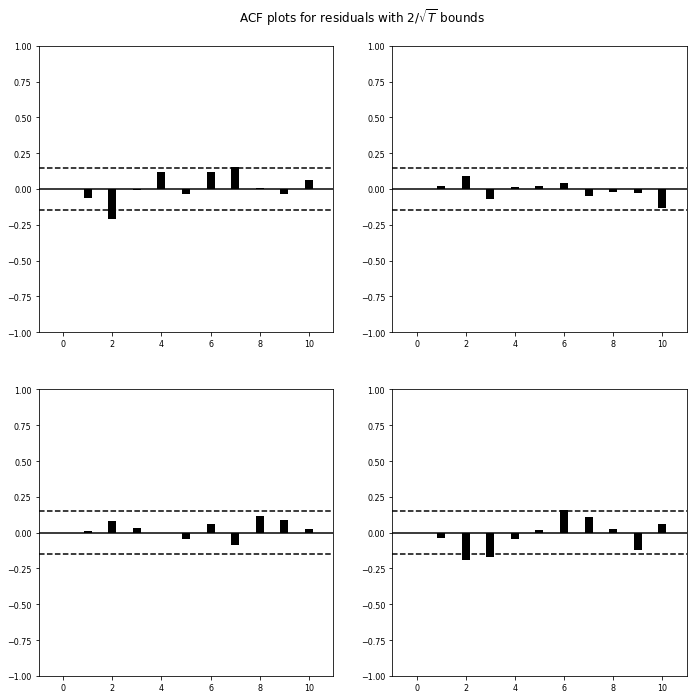

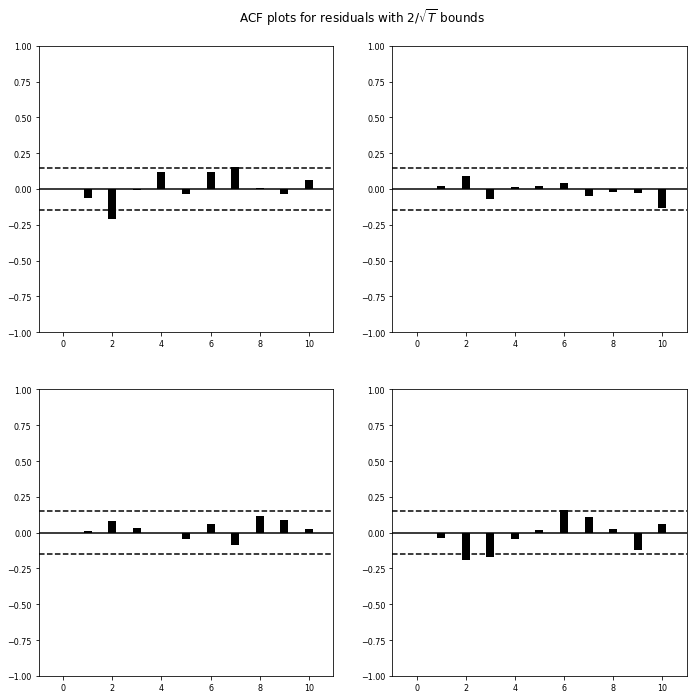

In [346]:
model13_fit.plot_acorr()

A moving average term in the data. The number of significant correlations indicates the order of the moving average term.

In [347]:
lag_order = model13_fit.k_ar
# In order to forecast, the VAR model expects up to the lag order number of observations from the past data.
# The model forecast 8 periods foreward
forecast = model13_fit.forecast(tweets_cases_F_df.values[-lag_order:],8)
print(forecast)

[[0.22948926 0.2381028 ]
 [0.14246785 0.03671938]
 [0.1531694  0.11886065]
 [0.15272773 0.08730543]
 [0.15231674 0.09913917]
 [0.15256211 0.09474665]
 [0.15245635 0.09636979]
 [0.15249782 0.09577119]]


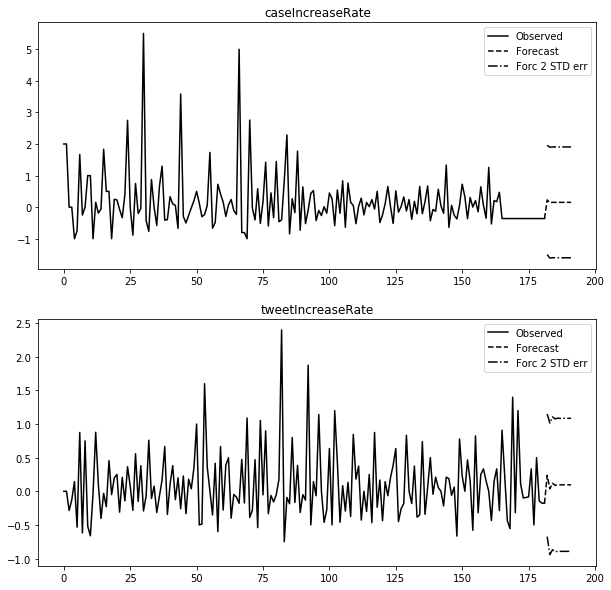

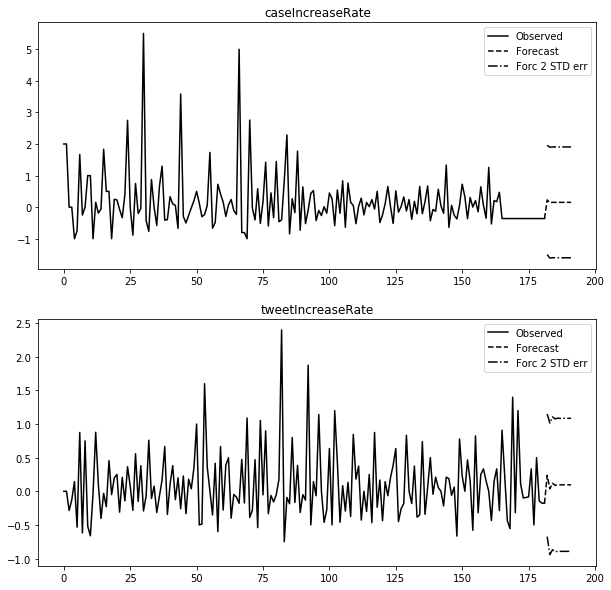

In [348]:
model13_fit.plot_forecast(steps=10)

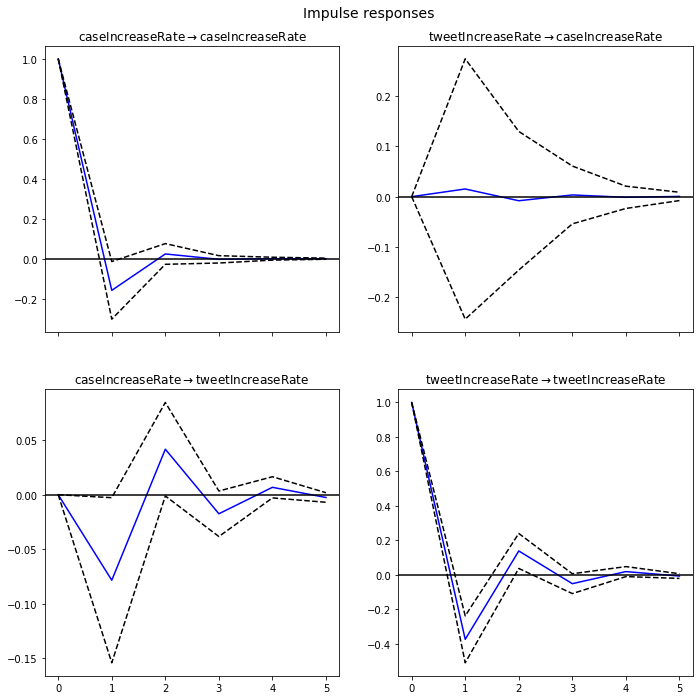

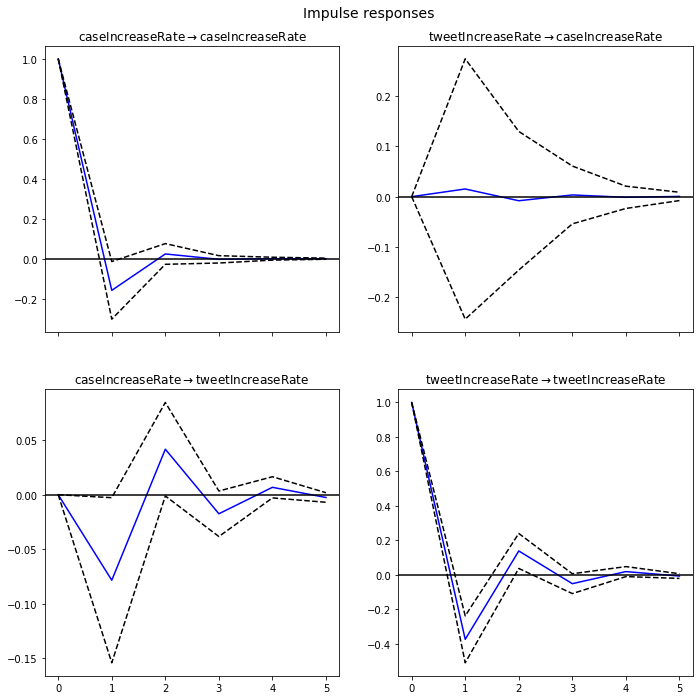

In [349]:
#impulse response function for next 5 days.
irf = model13_fit.irf(5)
irf.plot(orth=False)

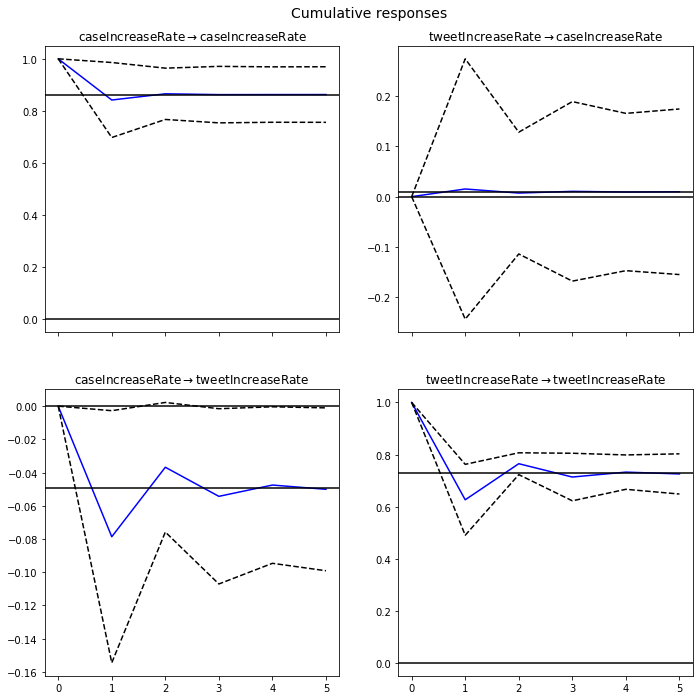

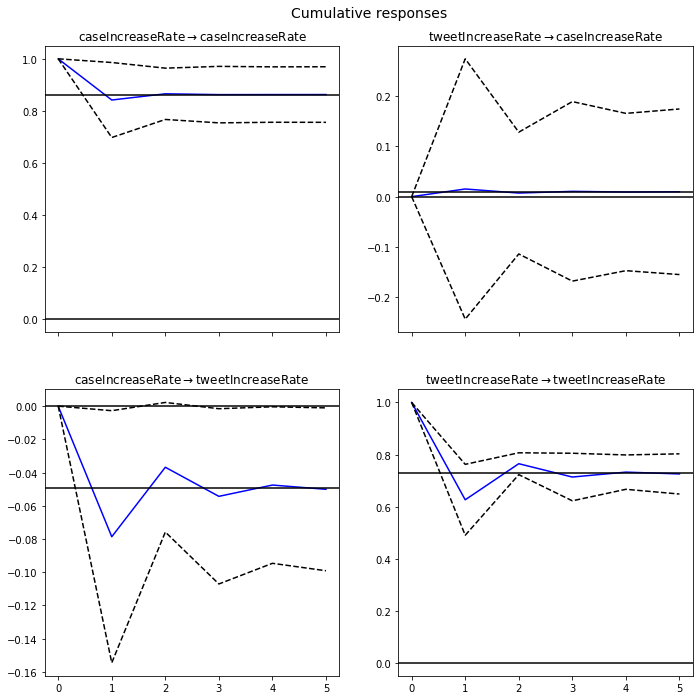

In [350]:
# The cumulative effects  
# where each period is the sum of the current and previous period response values
irf.plot_cum_effects(orth=False)

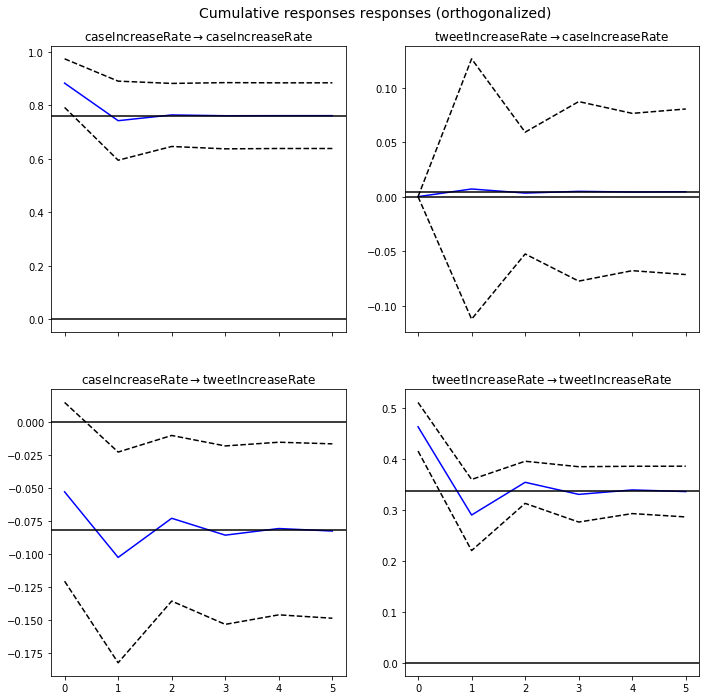

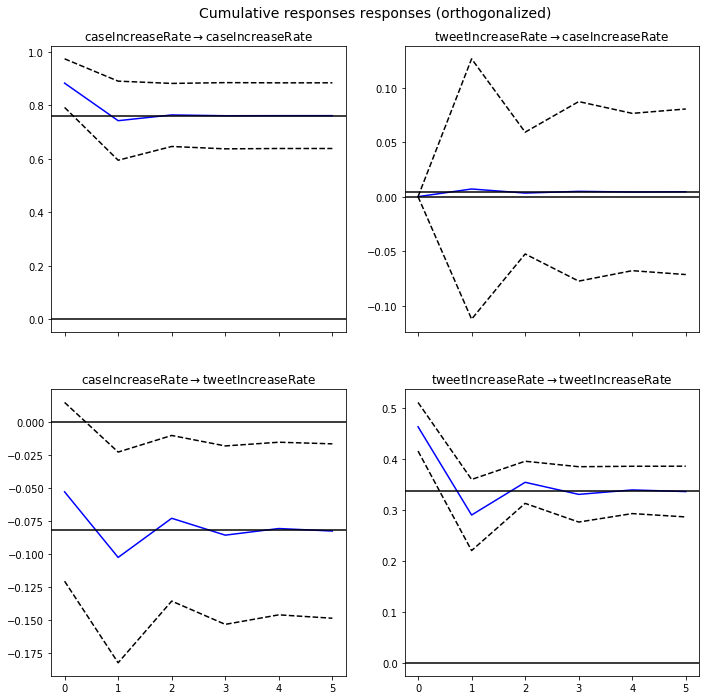

In [351]:
irf.plot_cum_effects(orth=True)

In [352]:
#Grangers causality tweetCount with respect to caseCount
feedBackLoop = model13_fit.test_causality('caseIncreaseRate','tweetIncreaseRate', kind='f')
print(feedBackLoop)

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: tweetIncreaseRate does not Granger-cause caseIncreaseRate: fail to reject at 5% significance level. Test statistic: 0.013, critical value: 3.868>, p-value: 0.908>


In [353]:
#Grangers causality caseCount with respect to tweetCount
feedBackLoop = model13_fit.test_causality('tweetIncreaseRate','caseIncreaseRate', kind='f')
print(feedBackLoop)

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: caseIncreaseRate does not Granger-cause tweetIncreaseRate: reject at 5% significance level. Test statistic: 4.123, critical value: 3.868>, p-value: 0.043>


### Model 14: Fresno county Case Increase Rate vs Tweet Increse Rate VECM

##### Cointegration rank

In [354]:
lag_order14 = select_order(tweets_cases_F_df, maxlags=10, deterministic="ci", seasons=4)
lag_order14.summary()

,AIC,BIC,FPE,HQIC
0,-1.732,-1.475*,0.1770,-1.627
1,-1.773,-1.442,0.1699,-1.639*
2,-1.794,-1.390,0.1664,-1.630
3,-1.776,-1.299,0.1694,-1.582
4,-1.773,-1.222,0.1699,-1.550
5,-1.760,-1.135,0.1723,-1.506
6,-1.798*,-1.100,0.1659*,-1.515
7,-1.783,-1.011,0.1686,-1.470
8,-1.761,-0.9154,0.1725,-1.418
9,-1.778,-0.8595,0.1697,-1.405


In [355]:
vec_rank14 = select_coint_rank(tweets_cases_F_df, det_order = -1, k_ar_diff = 0)
print(vec_rank10.rank)

2


In [357]:
vecm_model14 = VECM(endog = tweets_cases_F_df, k_ar_diff = 0, coint_rank = 2, deterministic = 'ci')
vecm14_fit = vecm_model14.fit()
vecm14_fit.summary()

,coef,std err,z,P>|z|,[0.025,0.975]
ec1,-1.1582,0.073,-15.893,0.000,-1.301,-1.015
ec2,0.0152,0.131,0.117,0.907,-0.241,0.272
,coef,std err,z,P>|z|,[0.025,0.975]
ec1,-0.0786,0.038,-2.048,0.041,-0.154,-0.003
ec2,-1.3739,0.069,-19.944,0.000,-1.509,-1.239
,coef,std err,z,P>|z|,[0.025,0.975]
beta.1,1.0000,0,0,0.000,1.000,1.000
beta.2,0,0,0,0.000,0,0
const,-0.1525,0.056,-2.716,0.007,-0.263,-0.042
,coef,std err,z,P>|z|,[0.025,0.975]


In [358]:
vecm14_fit.predict(steps=10)

array([[0.22948926, 0.2381028 ],
       [0.14246785, 0.03671938],
       [0.1531694 , 0.11886065],
       [0.15272773, 0.08730543],
       [0.15231674, 0.09913917],
       [0.15256211, 0.09474665],
       [0.15245635, 0.09636979],
       [0.15249782, 0.09577119],
       [0.15248213, 0.09599176],
       [0.15248798, 0.09591051]])

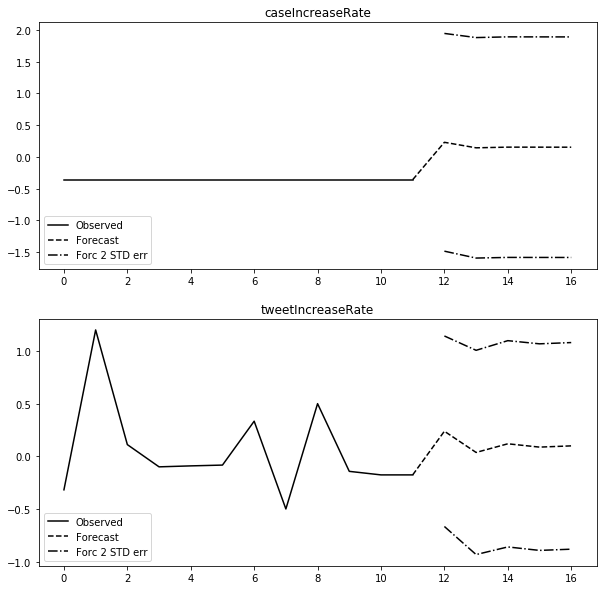

In [359]:
vecm14_fit.plot_forecast(steps=5, n_last_obs=12)

In [360]:
granger_results = vecm14_fit.test_granger_causality(caused="tweetIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
3.640,3.868,0.057,"(1, 350)"


In [361]:
granger_results = vecm14_fit.test_granger_causality(caused="caseIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
0.08244,3.868,0.774,"(1, 350)"


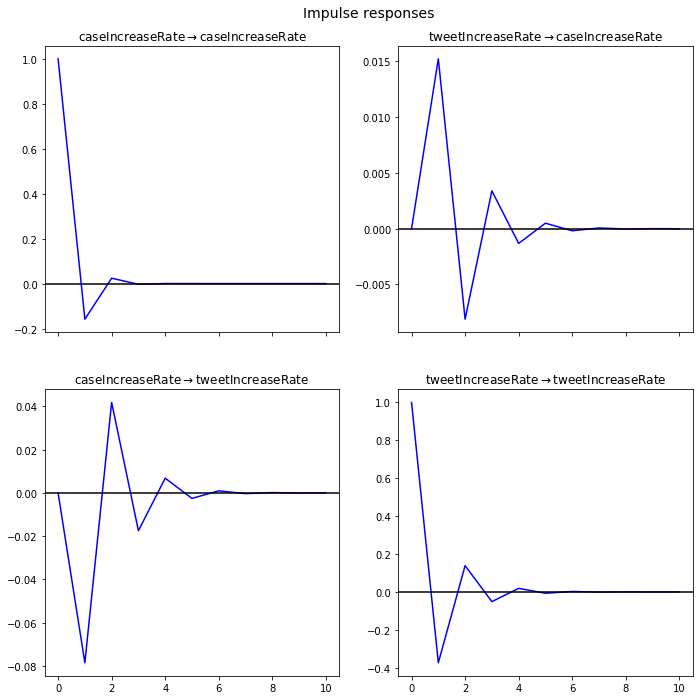

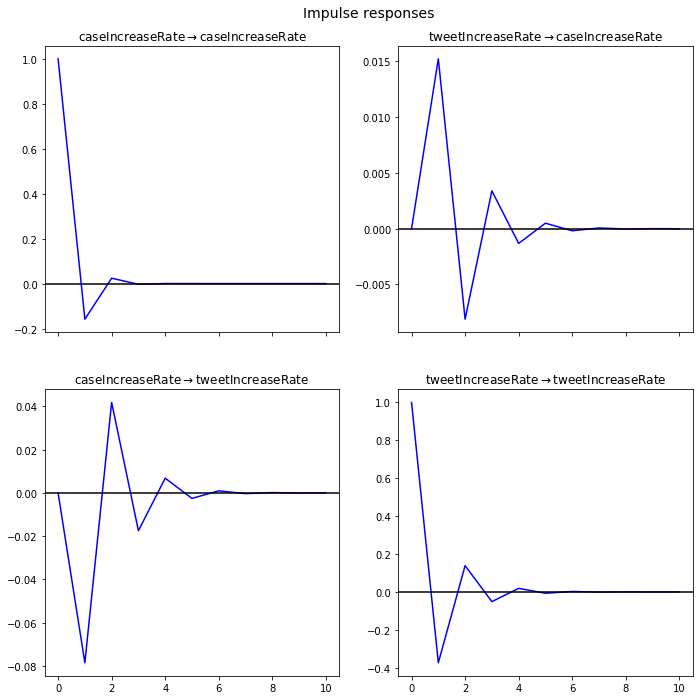

In [363]:
num_periods = 10
ir = vecm14_fit.irf(periods=num_periods)
ir.plot(plot_stderr=False)

### Model 15:  Fresno county Death Increase Rate vs Tweet Increse Rate VAR

In [364]:
modelData15 = pd.concat([fresnoTweetDataCount['timePeriod'], fresnoTweetDataCount['count'], fresnoCaseCount['newcountdeaths'][:182]], axis=1, keys=['timePeriod', 'tweetCount', 'deathCount'])
modelData15.head()

,timePeriod,tweetCount,deathCount
0,2020-03-01,5,0.0
1,2020-03-02,5,0.0
2,2020-03-03,5,0.0
3,2020-03-04,7,0.0
4,2020-03-05,8,0.0


In [365]:
tweets_deaths_F_df = modelData15[['tweetCount','deathCount']]

In [366]:
tweets_deaths_F_df['tweetIncreaseRate'] = (tweets_deaths_F_df['tweetCount']-tweets_deaths_F_df['tweetCount'].shift(-1))/tweets_deaths_F_df['tweetCount'].shift(-1)
tweets_deaths_F_df['tweetIncreaseRate'][0] = tweets_deaths_F_df['tweetIncreaseRate'][1]
tweets_deaths_F_df.replace([np.inf, -np.inf], np.nan, inplace=True)
tweets_deaths_F_df['tweetIncreaseRate'] = tweets_deaths_F_df['tweetIncreaseRate'].fillna(method='ffill')

tweets_deaths_F_df['deathIncreaseRate'] = (tweets_deaths_F_df['deathCount']-tweets_deaths_F_df['deathCount'].shift(-1))/tweets_deaths_F_df['deathCount'].shift(-1)
tweets_deaths_F_df['deathIncreaseRate'][0] = tweets_deaths_F_df['deathIncreaseRate'][15]
tweets_deaths_F_df.replace([np.inf, -np.inf], np.nan, inplace=True)
tweets_deaths_F_df['deathIncreaseRate'] = tweets_deaths_F_df['deathIncreaseRate'].fillna(method='ffill')

tweets_deaths_F_df.drop(['tweetCount','deathCount'], axis=1, inplace=True)

#### Checking wheather the variables are stationary


In [367]:
print('Augmented Dickey-Fuller Test: Tweets')
augmented_dickey_fuller_statistics(tweets_deaths_F_df['tweetIncreaseRate'])
print('Augmented Dickey-Fuller Test: Deaths')
augmented_dickey_fuller_statistics(tweets_deaths_F_df['deathIncreaseRate']) 

Augmented Dickey-Fuller Test: Tweets
ADF Statistic: -9.106070
p-value: 0.000000
Critical Values:
	1%: -3.468
	5%: -2.878
	10%: -2.576
Augmented Dickey-Fuller Test: Deaths
ADF Statistic: -1.310327
p-value: 0.624435
Critical Values:
	1%: -3.470
	5%: -2.879
	10%: -2.576


Both the variables are stationary

#### Checking for Co integration in the time series

In [368]:
cointegration_test(tweets_deaths_F_df)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
tweetIncreaseRate ::  28.62     > 12.3212   =>   True
deathIncreaseRate ::  1.66      > 4.1296    =>   False


The time series are cointegrated, they have statistically significant relationship.

In [369]:
model15 = VAR(tweets_deaths_F_df)

##### Select the lag for the model

In [370]:
# Select order method for lag finder
x = model15.select_order(maxlags=15)
x.summary()

,AIC,BIC,FPE,HQIC
0,-2.018,-1.980,0.1329,-2.003
1,-2.324,-2.212*,0.09787,-2.279
2,-2.386,-2.199,0.09204,-2.310
3,-2.414,-2.153,0.08944,-2.308
4,-2.418,-2.082,0.08914,-2.281
5,-2.491,-2.080,0.08286,-2.324
6,-2.557,-2.072,0.07757,-2.360*
7,-2.527,-1.967,0.07995,-2.300
8,-2.560,-1.925,0.07741,-2.302
9,-2.576,-1.867,0.07620,-2.288


#### From select_order optimal lag is observed at a lag order of 11

In [372]:
model15_fit = model15.fit(1)
model15_fit.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 14, Nov, 2020
Time:                     20:40:11
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -2.27590
Nobs:                     181.000    HQIC:                  -2.33894
Log likelihood:          -292.092    FPE:                  0.0923732
AIC:                     -2.38192    Det(Omega_mle):       0.0893856
--------------------------------------------------------------------
Results for equation tweetIncreaseRate
                          coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------------
const                        0.132321         0.049726            2.661           0.008
L1.tweetIncreaseRate        -0.359952         0.070861           -5.080           0.000
L1.deathIncreaseRate

### Plot autocurrelation function

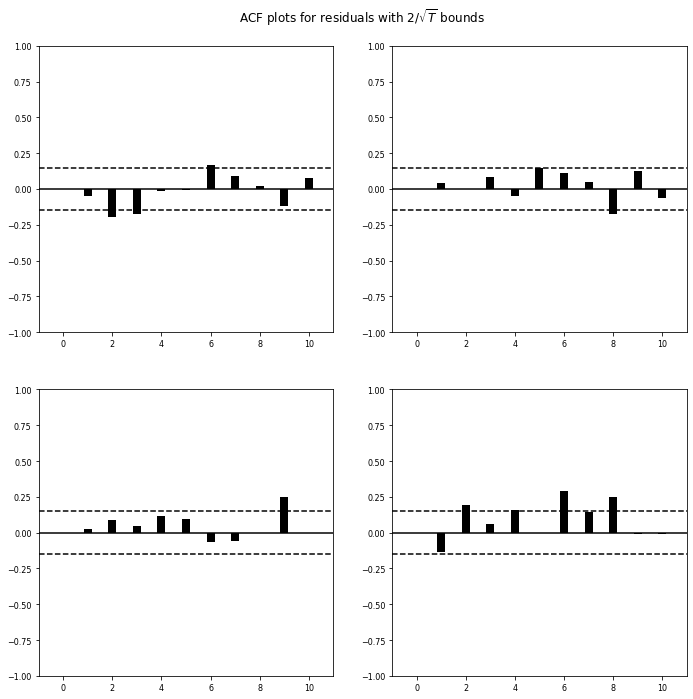

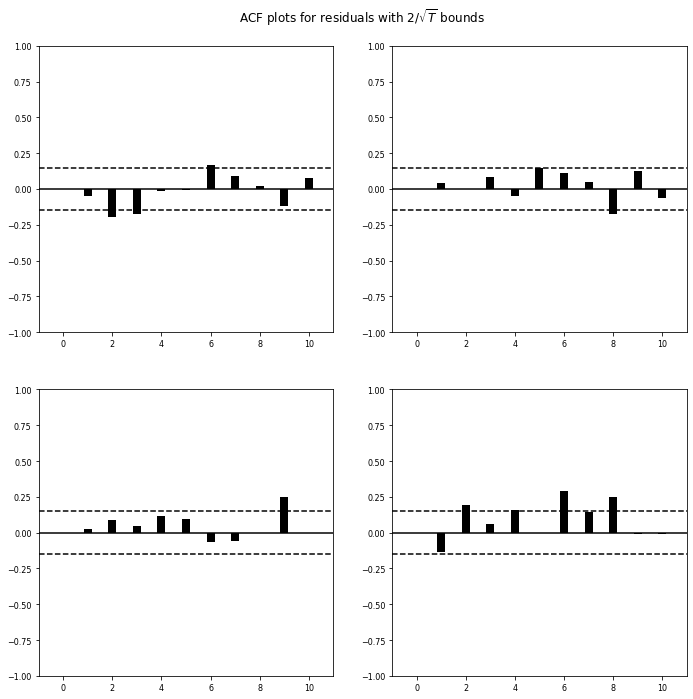

In [373]:
model15_fit.plot_acorr()

A moving average term in the data. The number of significant correlations indicates the order of the moving average term.

In [374]:
lag_order = model15_fit.k_ar
# In order to forecast, the VAR model expects up to the lag order number of observations from the past data.
# The model forecast 8 periods foreward
forecast = model15_fit.forecast(tweets_deaths_F_df.values[-lag_order:],8)
print(forecast)

[[ 0.19201988 -0.944322  ]
 [ 0.05959361 -0.76841355]
 [ 0.10793303 -0.7532173 ]
 [ 0.09059121 -0.72698245]
 [ 0.0969337  -0.72371214]
 [ 0.09466321 -0.71975905]
 [ 0.09549559 -0.71912346]
 [ 0.0951984  -0.71852205]]


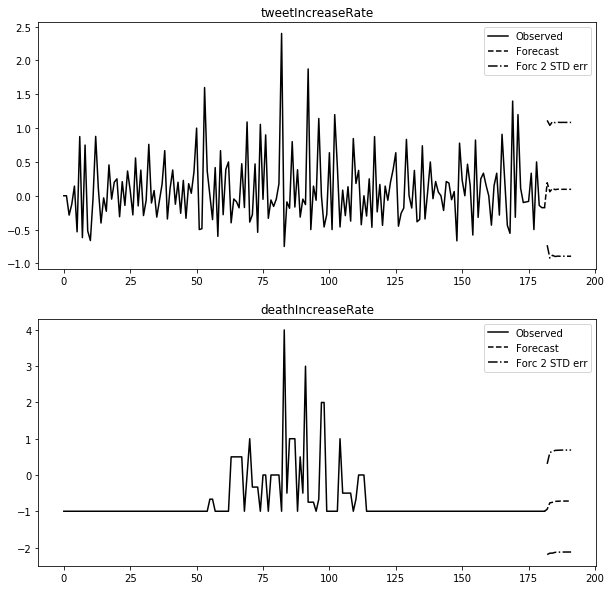

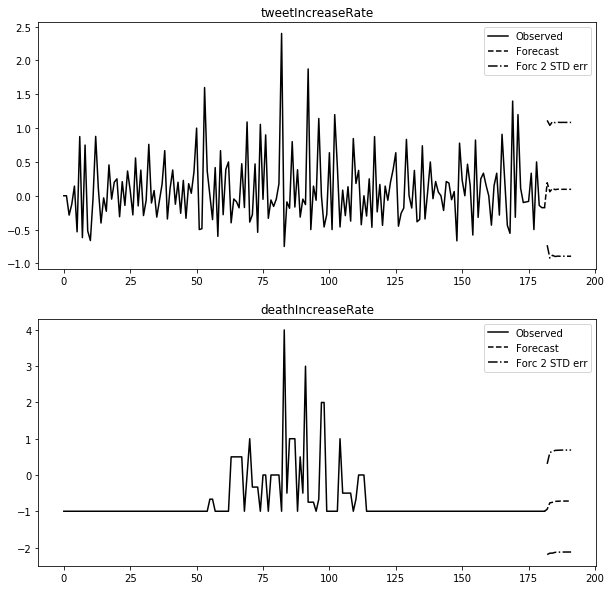

In [375]:
model15_fit.plot_forecast(steps=10)

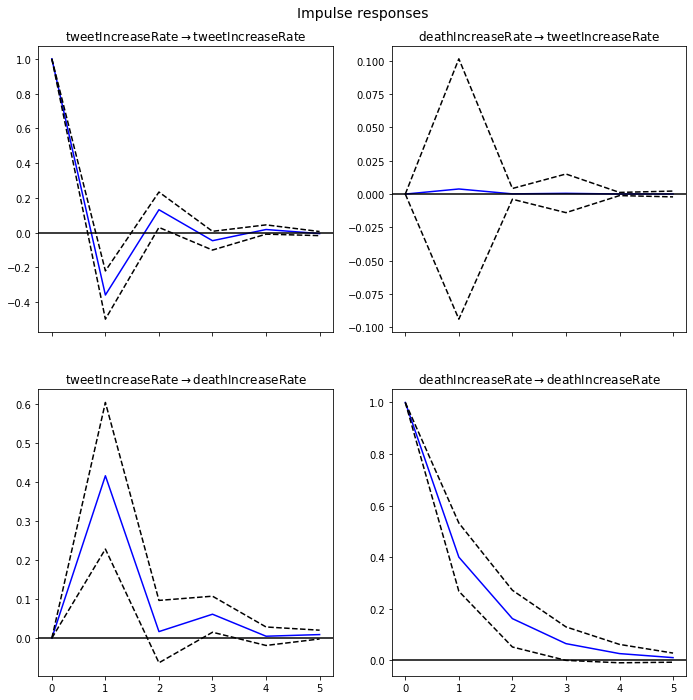

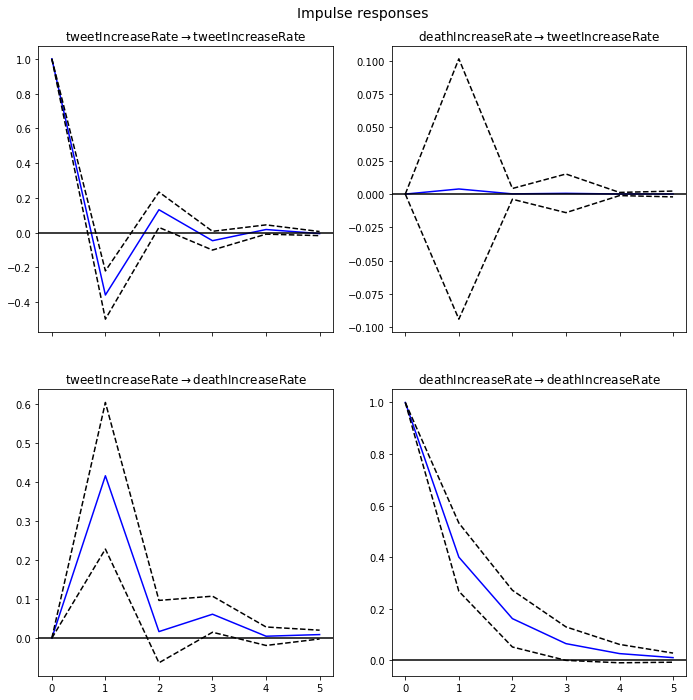

In [376]:
#impulse response function for next 5 days.
irf = model15_fit.irf(5)
irf.plot(orth=False)

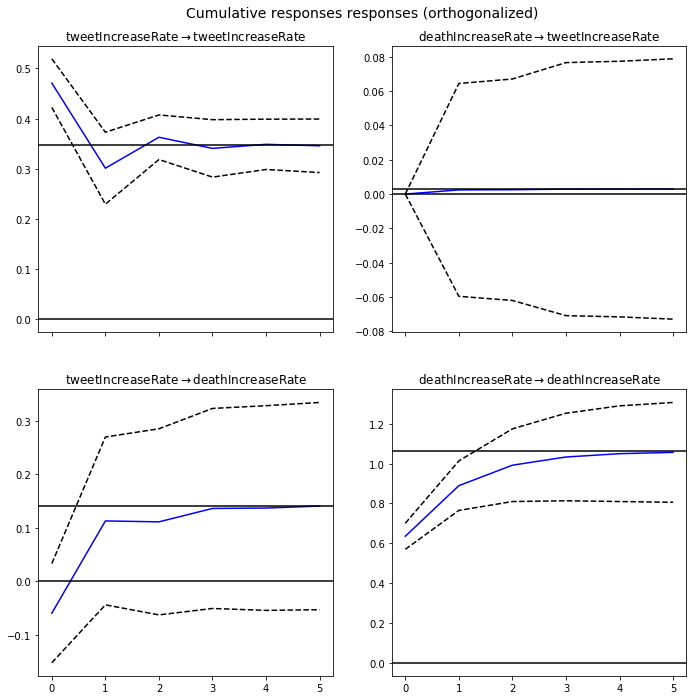

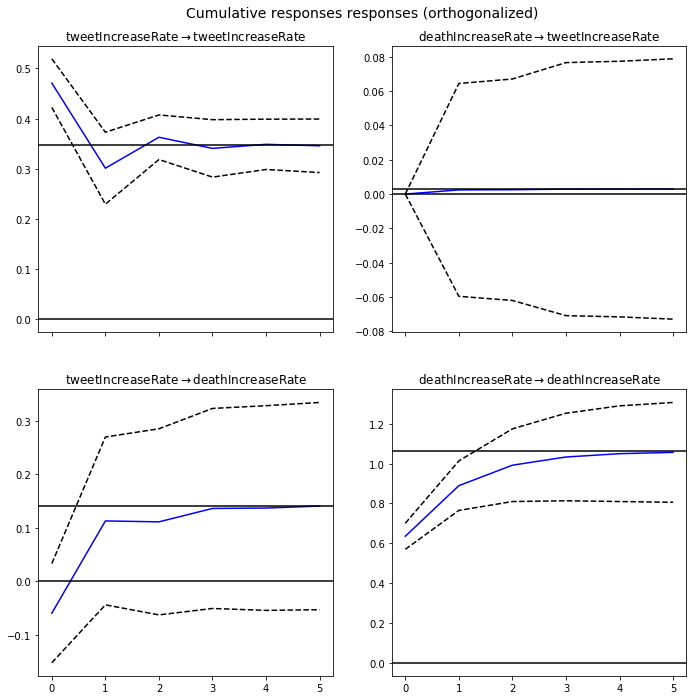

In [377]:
irf.plot_cum_effects(orth=True)

In [378]:
#Grangers causality tweetCount with respect to caseCount
feedBackLoop = model15_fit.test_causality('deathIncreaseRate','tweetIncreaseRate', kind='f')
print(feedBackLoop)

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: tweetIncreaseRate does not Granger-cause deathIncreaseRate: reject at 5% significance level. Test statistic: 18.851, critical value: 3.868>, p-value: 0.000>


In [379]:
#Grangers causality tweetCount with respect to caseCount
feedBackLoop = model15_fit.test_causality('tweetIncreaseRate','deathIncreaseRate', kind='f')
print(feedBackLoop)

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: deathIncreaseRate does not Granger-cause tweetIncreaseRate: fail to reject at 5% significance level. Test statistic: 0.006, critical value: 3.868>, p-value: 0.939>


### Model 16:  Fresno county Tweet Increase Rate vs Deaths Increase Rate using VECM

#### Cointegration rank

In [380]:
lag_order16 = select_order(tweets_deaths_F_df, maxlags=10, deterministic="ci", seasons=4)
lag_order16.summary()

,AIC,BIC,FPE,HQIC
0,-2.292,-2.035*,0.1011,-2.188
1,-2.347,-2.016,0.09570,-2.213
2,-2.385,-1.981,0.09210,-2.221
3,-2.382,-1.904,0.09245,-2.188
4,-2.469,-1.918,0.08475,-2.245
5,-2.531,-1.906,0.07970,-2.277*
6,-2.507,-1.809,0.08162,-2.224
7,-2.534,-1.763,0.07950,-2.221
8,-2.562,-1.717,0.07743,-2.219
9,-2.568,-1.650,0.07698,-2.196


In [381]:
vec_rank16 = select_coint_rank(tweets_deaths_F_df, det_order = 1, k_ar_diff = 0)
print(vec_rank16.rank)

2


In [385]:
vecm_model16 = VECM(endog = tweets_deaths_CC_df, k_ar_diff = 0, coint_rank = 1, deterministic = 'ci')
vecm16_fit = vecm_model16.fit()
vecm16_fit.summary()

,coef,std err,z,P>|z|,[0.025,0.975]
ec1,-1.2223,0.071,-17.295,0.000,-1.361,-1.084
,coef,std err,z,P>|z|,[0.025,0.975]
ec1,1.2487,0.594,2.101,0.036,0.084,2.414
,coef,std err,z,P>|z|,[0.025,0.975]
beta.1,1.0000,0,0,0.000,1.000,1.000
beta.2,-0.0135,0.008,-1.735,0.083,-0.029,0.002
const,-0.0130,0.010,-1.285,0.199,-0.033,0.007


In [386]:
vecm16_fit.predict(steps=10)

array([[ 3.16150295e-02, -1.18046390e+00],
       [-1.06399587e-02, -1.13729740e+00],
       [-5.32674729e-04, -1.14762271e+00],
       [-2.95031091e-03, -1.14515293e+00],
       [-2.37201859e-03, -1.14574369e+00],
       [-2.51034462e-03, -1.14560238e+00],
       [-2.47725739e-03, -1.14563618e+00],
       [-2.48517177e-03, -1.14562810e+00],
       [-2.48327867e-03, -1.14563003e+00],
       [-2.48373149e-03, -1.14562957e+00]])

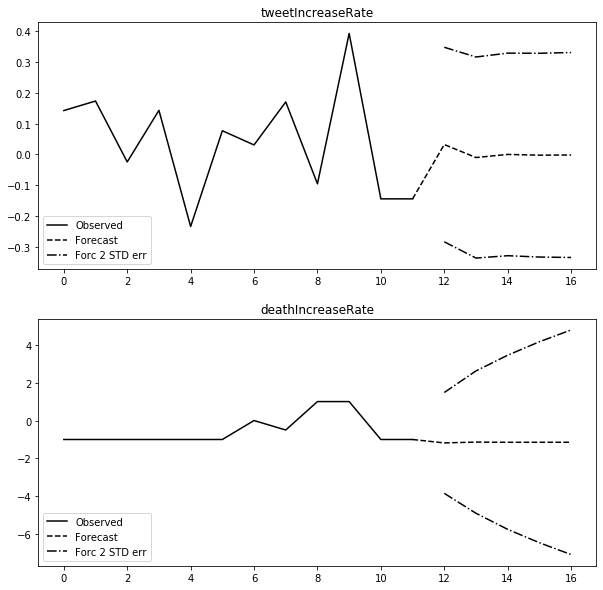

In [387]:
vecm16_fit.plot_forecast(steps=5, n_last_obs=12)

In [388]:
granger_results = vecm16_fit.test_granger_causality(caused="tweetIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
0.007357,3.868,0.932,"(1, 350)"


In [389]:
granger_results = vecm16_fit.test_granger_causality(caused="deathIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
1.978,3.868,0.160,"(1, 350)"


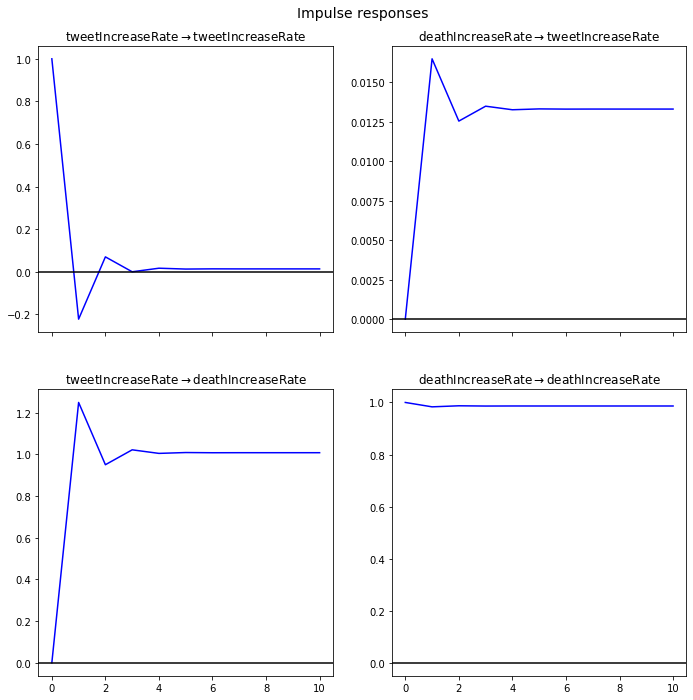

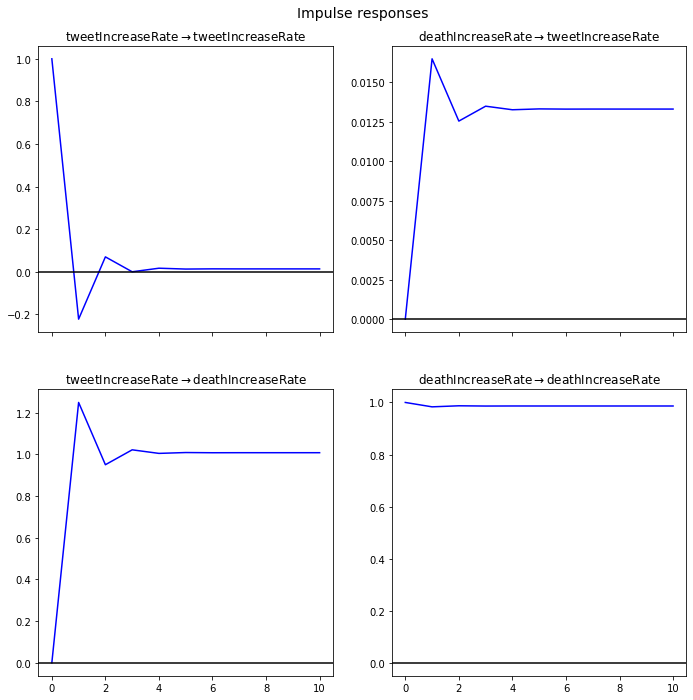

In [390]:
num_periods = 10
ir = vecm16_fit.irf(periods=num_periods)
ir.plot(plot_stderr=False)

### Model 17: SFO county Case Increase Rate vs Tweet Increse Rate using VAR

In [391]:
modelData17 = pd.concat([SFOTweetDataCount['timePeriod'], SFOTweetDataCount['count'], sfoCaseCount['newcountconfirmed'][:182]], axis=1, keys=['timePeriod', 'tweetCount', 'caseCount'])
modelData17.head()

,timePeriod,tweetCount,caseCount
0,2020-03-01,35,65
1,2020-03-02,48,15
2,2020-03-03,67,7
3,2020-03-04,64,19
4,2020-03-05,75,28


In [392]:
tweets_cases_SFO_df = modelData17[['tweetCount','caseCount']]

In [393]:
tweets_cases_SFO_df['caseIncreaseRate'] = (tweets_cases_SFO_df['caseCount']-tweets_cases_SFO_df['caseCount'].shift(-1))/tweets_cases_SFO_df['caseCount'].shift(-1)
tweets_cases_SFO_df.replace([np.inf, -np.inf], np.nan, inplace=True)
tweets_cases_SFO_df['caseIncreaseRate'] = tweets_cases_SFO_df['caseIncreaseRate'].fillna(method='ffill')
tweets_cases_SFO_df['caseIncreaseRate'][0] = tweets_cases_SFO_df['caseIncreaseRate'][1]

tweets_cases_SFO_df['tweetIncreaseRate'] = (tweets_cases_SFO_df['tweetCount']-tweets_cases_SFO_df['tweetCount'].shift(-1))/tweets_cases_SFO_df['tweetCount'].shift(-1)
tweets_cases_SFO_df['tweetIncreaseRate'] = tweets_cases_SFO_df['tweetIncreaseRate'].fillna(method='ffill')
tweets_cases_SFO_df['tweetIncreaseRate'][0] = tweets_cases_SFO_df['tweetIncreaseRate'][1]

tweets_cases_SFO_df.drop(['tweetCount','caseCount'], axis=1, inplace = True)

#### Checking wheather the variables are stationary

In [394]:
print('Augmented Dickey-Fuller Test: Tweets')
augmented_dickey_fuller_statistics(tweets_cases_SFO_df['tweetIncreaseRate'])
print('Augmented Dickey-Fuller Test: Cases')
augmented_dickey_fuller_statistics(tweets_cases_SFO_df['caseIncreaseRate']) 

Augmented Dickey-Fuller Test: Tweets
ADF Statistic: -7.096478
p-value: 0.000000
Critical Values:
	1%: -3.468
	5%: -2.878
	10%: -2.576
Augmented Dickey-Fuller Test: Cases
ADF Statistic: -11.593875
p-value: 0.000000
Critical Values:
	1%: -3.467
	5%: -2.878
	10%: -2.575


#### Checking for Co integration in the time series

In [395]:
cointegration_test(tweets_cases_SFO_df)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
caseIncreaseRate ::  48.48     > 12.3212   =>   True
tweetIncreaseRate ::  20.96     > 4.1296    =>   True


In [396]:
model17 = VAR(tweets_cases_SFO_df)

##### Select the lag for the model.

In [397]:
# Select order method for lag finder
x = model17.select_order(maxlags=15)
x.summary()

,AIC,BIC,FPE,HQIC
0,2.999,3.036,20.06,3.014
1,2.829,2.941*,16.93,2.875*
2,2.851,3.038,17.31,2.927
3,2.822,3.083,16.81,2.928
4,2.790*,3.126,16.29*,2.926
5,2.795,3.206,16.37,2.962
6,2.816,3.302,16.72,3.013
7,2.797,3.358,16.42,3.025
8,2.837,3.472,17.09,3.095
9,2.867,3.577,17.62,3.155


#### From select_order optimal lag is observed at a lag order of 4

In [399]:
model17_fit = model17.fit(1)
model17_fit.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 14, Nov, 2020
Time:                     20:50:17
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    2.96400
Nobs:                     181.000    HQIC:                   2.90096
Log likelihood:          -766.302    FPE:                    17.4262
AIC:                      2.85797    Det(Omega_mle):         16.8626
--------------------------------------------------------------------
Results for equation caseIncreaseRate
                          coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------------
const                        3.106910         1.690747            1.838           0.066
L1.caseIncreaseRate          0.150709         0.074133            2.033           0.042
L1.tweetIncreaseRate 

### Plot autocurrelation function

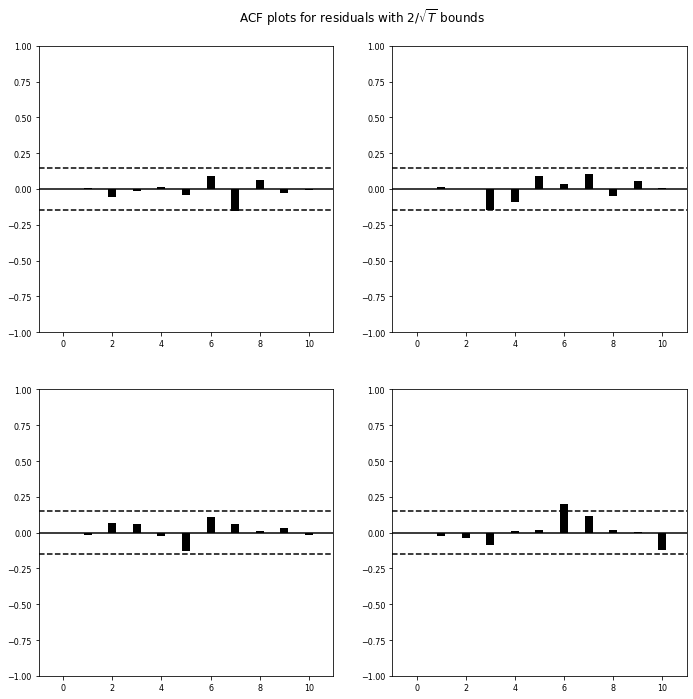

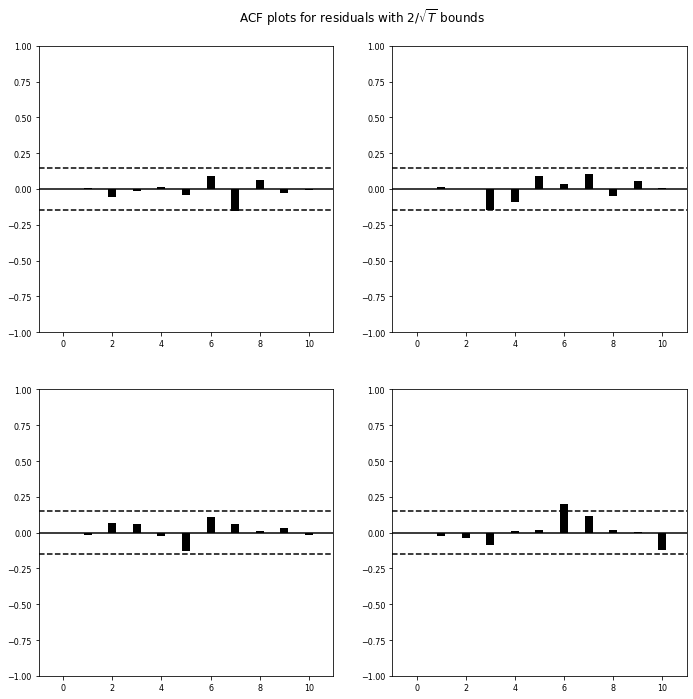

In [400]:
model17_fit.plot_acorr()

A moving average term in the data. The number of significant correlations indicates the order of the moving average term.

In [401]:
lag_order = model17_fit.k_ar
# In order to forecast, the VAR model expects up to the lag order number of observations from the past data.
# The model forecast 8 periods foreward
forecast = model17_fit.forecast(tweets_cases_SFO_df.values[-lag_order:],8)
print(forecast)

[[ 4.46252284e+00  6.13322059e-02]
 [ 3.08699532e+00 -2.40914506e-03]
 [ 3.59934967e+00  1.86002200e-02]
 [ 3.43936416e+00  1.16952433e-02]
 [ 3.49321213e+00  1.39674651e-02]
 [ 3.47567345e+00  1.32201477e-02]
 [ 3.48146765e+00  1.34659926e-02]
 [ 3.47956522e+00  1.33851252e-02]]


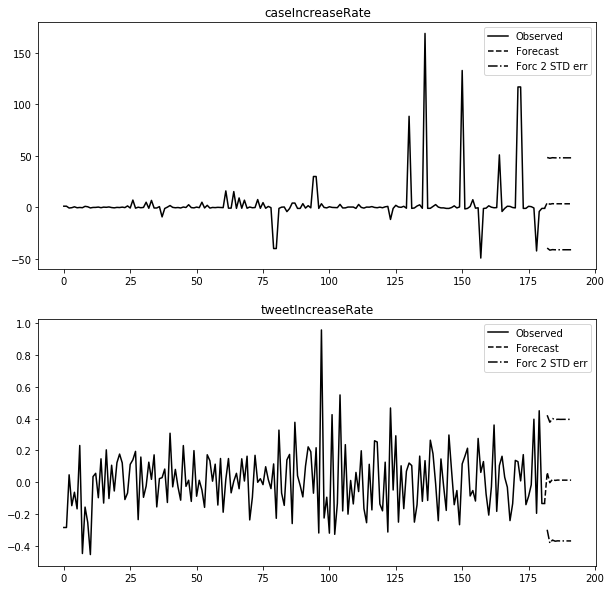

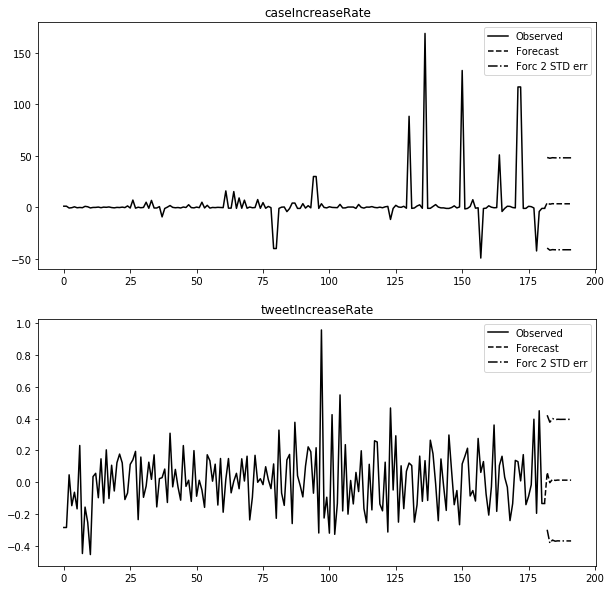

In [402]:
model17_fit.plot_forecast(steps=10)

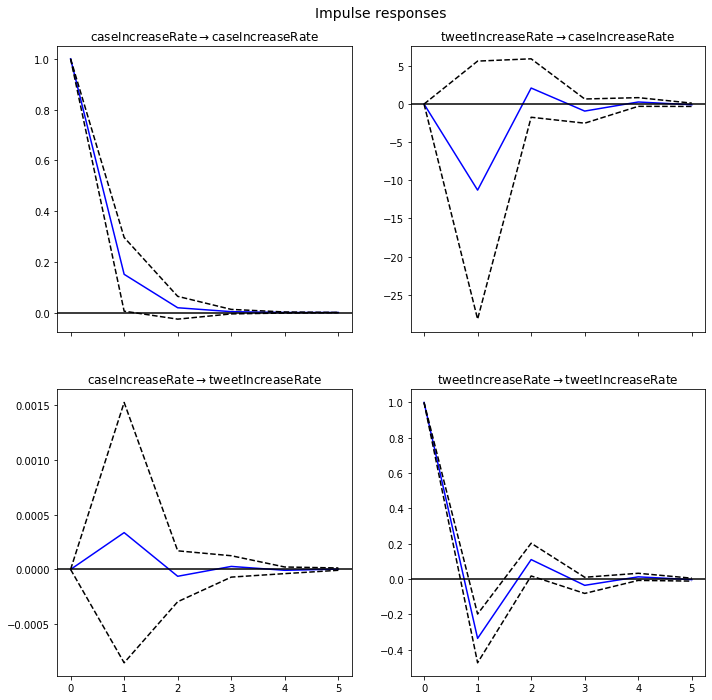

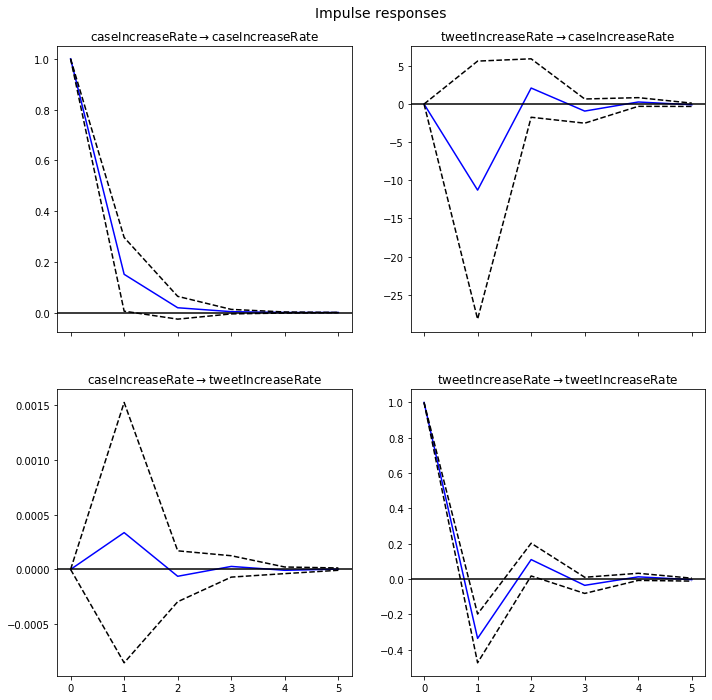

In [403]:
#impulse response function for next 5 days.
irf = model17_fit.irf(5)
irf.plot(orth=False)

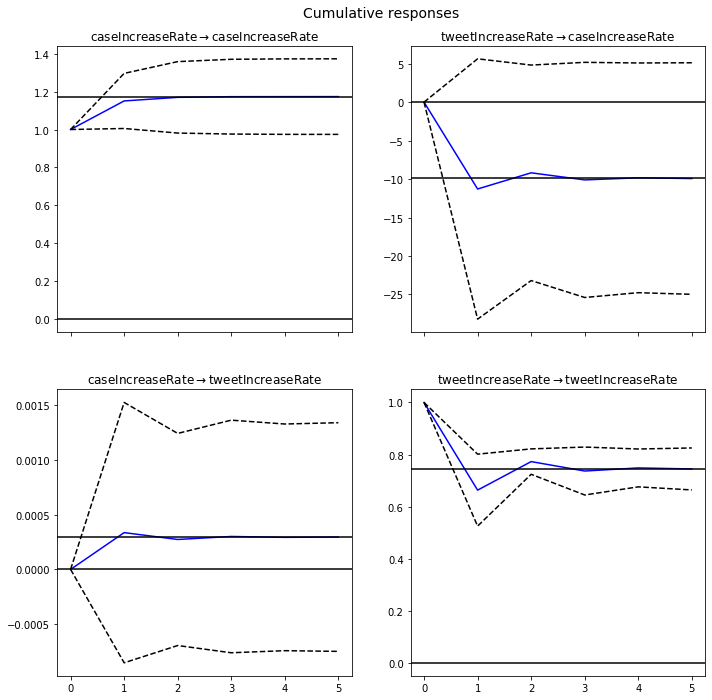

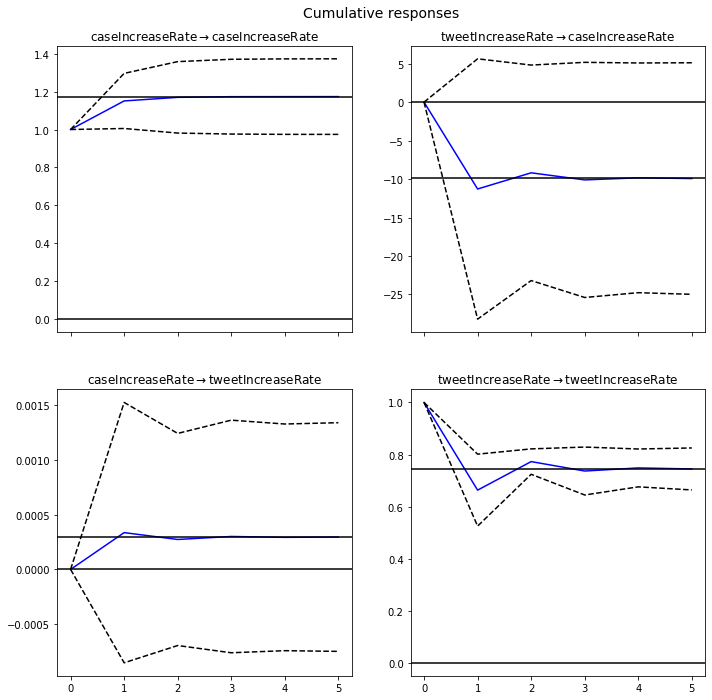

In [404]:
# The cumulative effects  
# where each period is the sum of the current and previous period response values
irf.plot_cum_effects(orth=False)

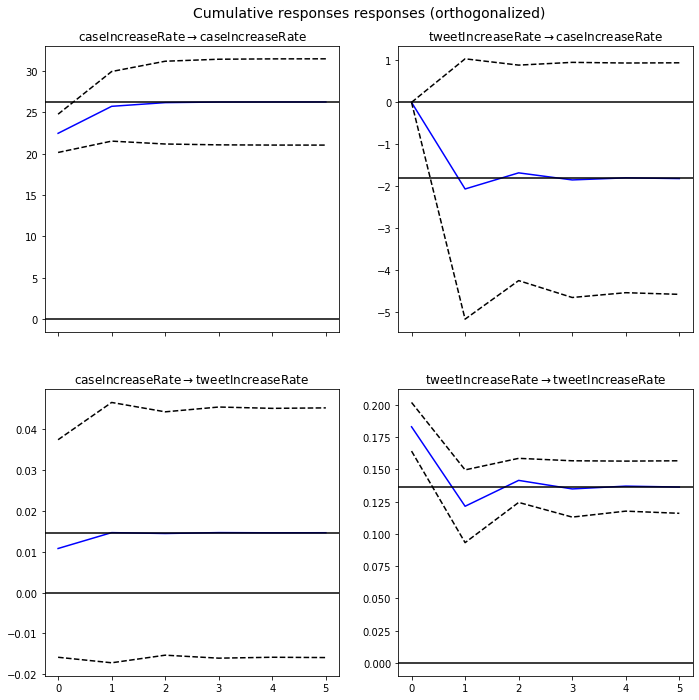

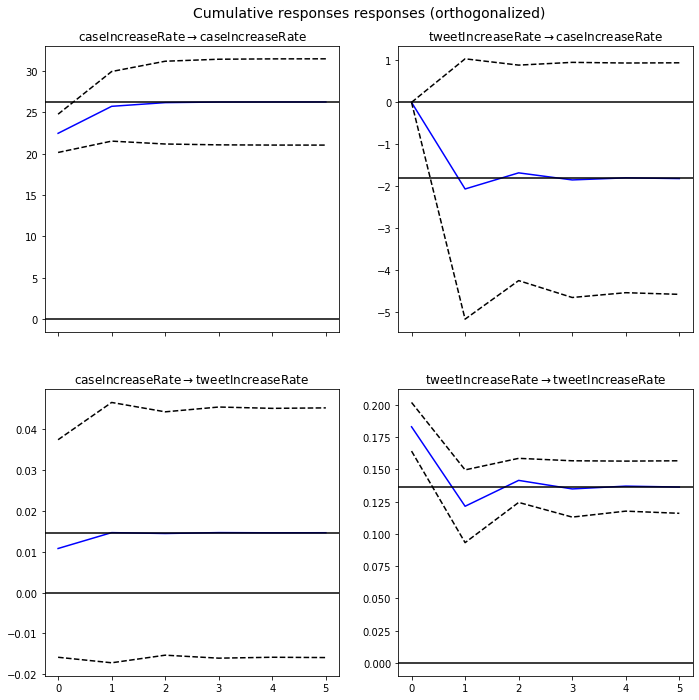

In [405]:
irf.plot_cum_effects(orth=True)

In [406]:
#Grangers causality tweetCount with respect to caseCount
feedBackLoop = model17_fit.test_causality('caseIncreaseRate','tweetIncreaseRate', kind='f')
print(feedBackLoop)

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: tweetIncreaseRate does not Granger-cause caseIncreaseRate: fail to reject at 5% significance level. Test statistic: 1.710, critical value: 3.868>, p-value: 0.192>


In [407]:
#Grangers causality caseCount with respect to tweetCount
feedBackLoop = model17_fit.test_causality('tweetIncreaseRate','caseIncreaseRate', kind='f')
print(feedBackLoop)

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: caseIncreaseRate does not Granger-cause tweetIncreaseRate: fail to reject at 5% significance level. Test statistic: 0.307, critical value: 3.868>, p-value: 0.580>


### Model 18: SFO county case Increase Rate vs Tweet Increase Rate using VECM

##### Cointegration rank

In [408]:
lag_order18 = select_order(tweets_cases_SFO_df, maxlags=10, deterministic="ci", seasons=4)
lag_order18.summary()

,AIC,BIC,FPE,HQIC
0,2.830*,3.087*,16.95*,2.934*
1,2.849,3.180,17.27,2.983
2,2.843,3.247,17.16,3.007
3,2.855,3.333,17.39,3.049
4,2.871,3.423,17.68,3.095
5,2.887,3.512,17.96,3.140
6,2.859,3.557,17.47,3.142
7,2.902,3.673,18.25,3.215
8,2.936,3.781,18.90,3.279
9,2.975,3.893,19.66,3.347


In [409]:
vec_rank18 = select_coint_rank(tweets_cases_SFO_df, det_order = -1, k_ar_diff = 0)
print(vec_rank18.rank)

2


In [436]:
vecm_model18 = VECM(endog = tweets_cases_CC_df, k_ar_diff = 0, coint_rank = 2, deterministic = 'ci')
vecm18_fit = vecm_model18.fit()
vecm18_fit.summary()

,coef,std err,z,P>|z|,[0.025,0.975]
ec1,-1.2567,0.072,-17.554,0.000,-1.397,-1.116
ec2,0.1508,0.335,0.450,0.653,-0.506,0.807
,coef,std err,z,P>|z|,[0.025,0.975]
ec1,0.0068,0.015,0.447,0.655,-0.023,0.037
ec2,-1.2326,0.071,-17.336,0.000,-1.372,-1.093
,coef,std err,z,P>|z|,[0.025,0.975]
beta.1,1.0000,0,0,0.000,1.000,1.000
beta.2,0,0,0,0.000,0,0
const,-0.1787,0.045,-3.975,0.000,-0.267,-0.091
,coef,std err,z,P>|z|,[0.025,0.975]


In [437]:
vecm18_fit.predict(steps=10)

array([[0.19777614, 0.04281668],
       [0.1790426 , 0.00036449],
       [0.1774518 , 0.0101121 ],
       [0.17932985, 0.00783389],
       [0.1785042 , 0.00837658],
       [0.178798  , 0.00824474],
       [0.17870269, 0.0082774 ],
       [0.17873208, 0.00826916],
       [0.17872329, 0.00827127],
       [0.17872587, 0.00827072]])

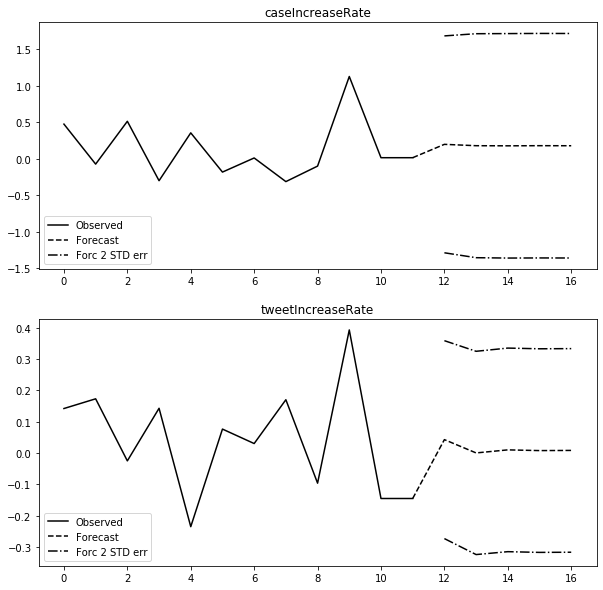

In [438]:
vecm18_fit.plot_forecast(steps=5, n_last_obs=12)

In [439]:
granger_results = vecm18_fit.test_granger_causality(caused="tweetIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
0.003651,3.868,0.952,"(1, 350)"


In [440]:
granger_results = vecm18_fit.test_granger_causality(caused="caseIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
0.1185,3.868,0.731,"(1, 350)"


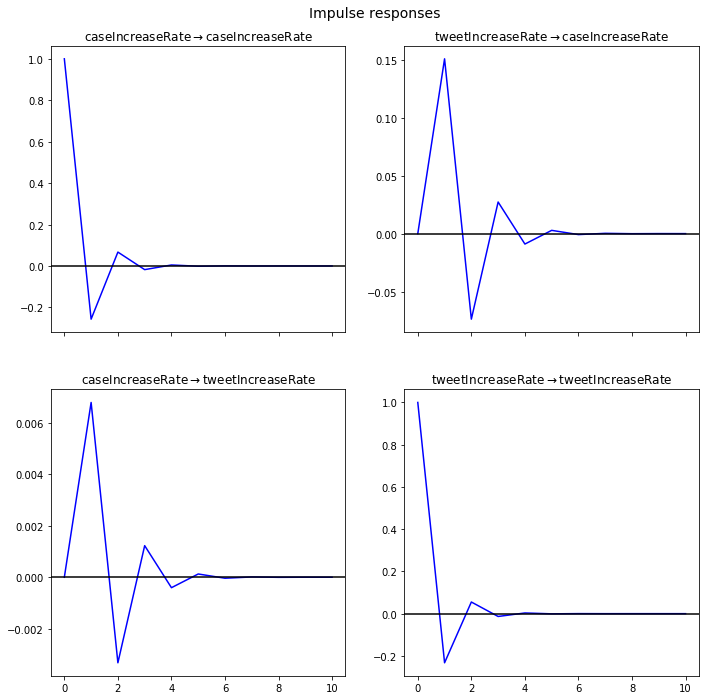

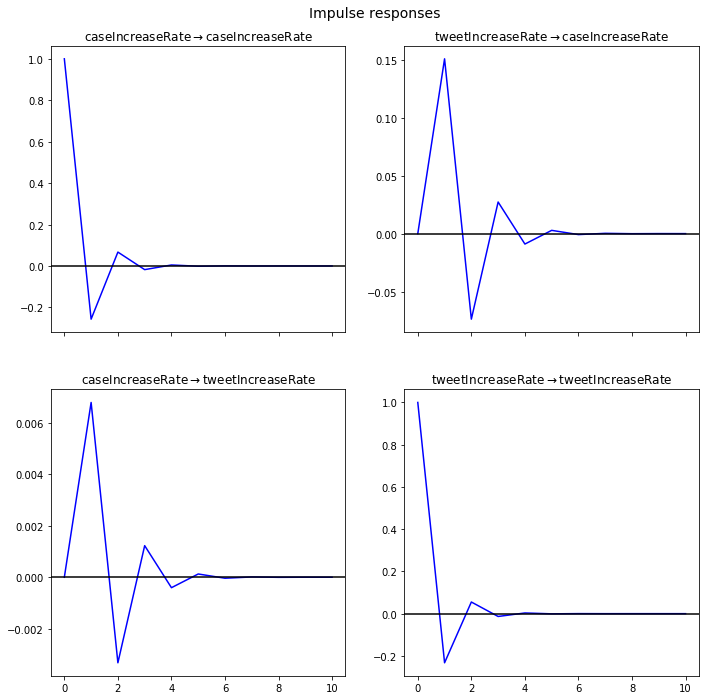

In [441]:
num_periods = 10
ir = vecm18_fit.irf(periods=num_periods)
ir.plot(plot_stderr=False)

### Model 19: SFO county Tweet Increase Rate vs Deaths Tweet Increase Rate using  VAR

In [442]:
modelData19 = pd.concat([SFOTweetDataCount['timePeriod'], SFOTweetDataCount['count'], sfoCaseCount['newcountdeaths'][:182]], axis=1, keys=['timePeriod', 'tweetCount', 'deathCount'])
modelData19.head()

,timePeriod,tweetCount,deathCount
0,2020-03-01,35,0
1,2020-03-02,48,0
2,2020-03-03,67,0
3,2020-03-04,64,0
4,2020-03-05,75,0


In [443]:
tweets_deaths_SFO_df = modelData19[['tweetCount','deathCount']]

In [444]:
tweets_deaths_SFO_df['tweetIncreaseRate'] = (tweets_deaths_SFO_df['tweetCount']-tweets_deaths_SFO_df['tweetCount'].shift(-1))/tweets_deaths_SFO_df['tweetCount'].shift(-1)
tweets_deaths_SFO_df['tweetIncreaseRate'][0] = tweets_deaths_SFO_df['tweetIncreaseRate'][1]
tweets_deaths_SFO_df.replace([np.inf, -np.inf], np.nan, inplace=True)
tweets_deaths_SFO_df['tweetIncreaseRate'] = tweets_deaths_SFO_df['tweetIncreaseRate'].fillna(method='ffill')

tweets_deaths_SFO_df['deathIncreaseRate'] = (tweets_deaths_SFO_df['deathCount']-tweets_deaths_SFO_df['deathCount'].shift(-1))/tweets_deaths_SFO_df['deathCount'].shift(-1)
tweets_deaths_SFO_df['deathIncreaseRate'][0] = tweets_deaths_SFO_df['deathIncreaseRate'][5]
tweets_deaths_SFO_df.replace([np.inf, -np.inf], np.nan, inplace=True)
tweets_deaths_SFO_df['deathIncreaseRate'] = tweets_deaths_SFO_df['deathIncreaseRate'].fillna(method='ffill')

tweets_deaths_SFO_df.drop(['tweetCount','deathCount'], axis=1, inplace=True)

#### Checking wheather the variables are stationary

In [445]:
print('Augmented Dickey-Fuller Test: Tweets')
augmented_dickey_fuller_statistics(tweets_deaths_SFO_df['tweetIncreaseRate'])
print('Augmented Dickey-Fuller Test: Deaths')
augmented_dickey_fuller_statistics(tweets_deaths_SFO_df['deathIncreaseRate']) 

Augmented Dickey-Fuller Test: Tweets
ADF Statistic: -7.096478
p-value: 0.000000
Critical Values:
	1%: -3.468
	5%: -2.878
	10%: -2.576
Augmented Dickey-Fuller Test: Deaths
ADF Statistic: -6.129761
p-value: 0.000000
Critical Values:
	1%: -3.467
	5%: -2.878
	10%: -2.575


Both the variables are stationary

#### Checking for Co integration in the time series

In [446]:
cointegration_test(tweets_deaths_SFO_df)

Name   ::  Test Stat > C(95%)    =>   Signif  
 ----------------------------------------
tweetIncreaseRate ::  39.79     > 12.3212   =>   True
deathIncreaseRate ::  8.47      > 4.1296    =>   True


The time series are cointegrated, they have statistically significant relationship.

In [447]:
model19 = VAR(tweets_deaths_SFO_df)

##### Select the lag for the model

In [448]:
# Select order method for lag finder
x = model19.select_order(maxlags=15)
x.summary()

,AIC,BIC,FPE,HQIC
0,-4.363,-4.326,0.01274,-4.348
1,-5.173,-5.061*,0.005665,-5.128*
2,-5.151,-4.964,0.005793,-5.075
3,-5.167,-4.906,0.005702,-5.061
4,-5.159,-4.823,0.005750,-5.022
5,-5.193,-4.783,0.005555,-5.027
6,-5.196*,-4.711,0.005540*,-4.999
7,-5.171,-4.611,0.005684,-4.944
8,-5.148,-4.513,0.005818,-4.891
9,-5.125,-4.415,0.005960,-4.837


#### From select_order optimal lag is observed at a lag order of 1

In [449]:
model19_fit = model19.fit(1)
model19_fit.summary()

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 14, Nov, 2020
Time:                     21:04:31
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   -4.83620
Nobs:                     181.000    HQIC:                  -4.89924
Log likelihood:          -60.3840    FPE:                 0.00713871
AIC:                     -4.94223    Det(Omega_mle):      0.00690783
--------------------------------------------------------------------
Results for equation tweetIncreaseRate
                          coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------------
const                        0.027069         0.018281            1.481           0.139
L1.tweetIncreaseRate        -0.338368         0.070471           -4.801           0.000
L1.deathIncreaseRate

### Plot autocurrelation function

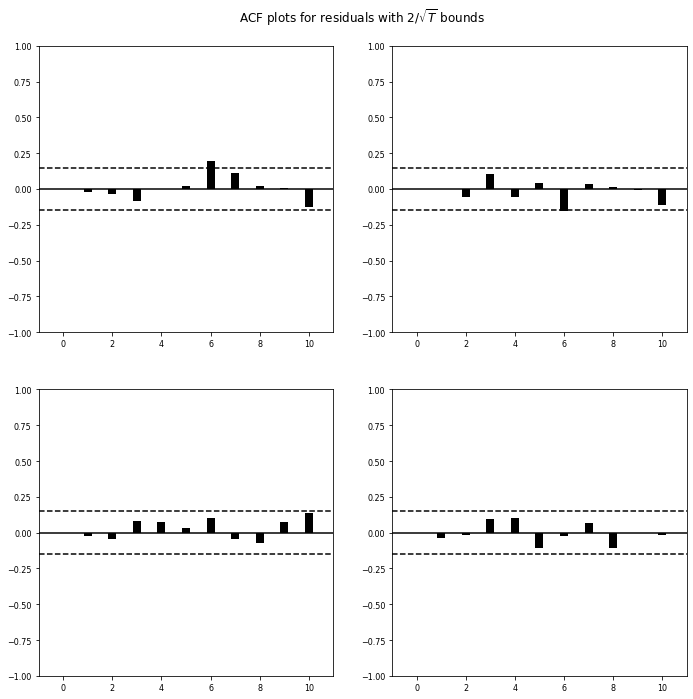

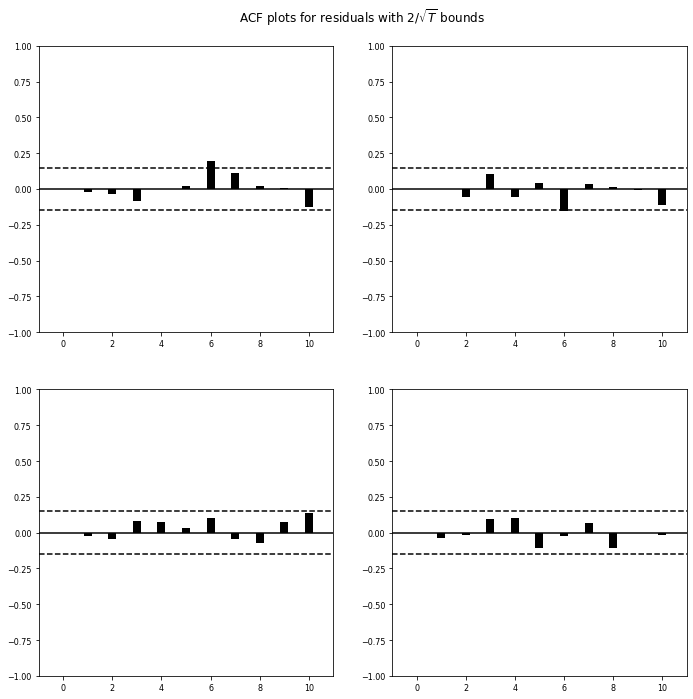

In [450]:
model19_fit.plot_acorr()

A moving average term in the data. The number of significant correlations indicates the order of the moving average term.

In [451]:
lag_order = model19_fit.k_ar
# In order to forecast, the VAR model expects up to the lag order number of observations from the past data.
# The model forecast 8 periods foreward
forecast = model19_fit.forecast(tweets_deaths_SFO_df.values[-lag_order:],8)
print(forecast)

[[ 7.21842483e-02 -1.36355528e-01]
 [ 2.92729760e-04 -2.79503236e-01]
 [ 2.21503367e-02 -3.55471172e-01]
 [ 1.34445944e-02 -4.11290028e-01]
 [ 1.54279076e-02 -4.45905940e-01]
 [ 1.41599720e-02 -4.69280004e-01]
 [ 1.41859851e-02 -4.84389588e-01]
 [ 1.39166640e-02 -4.94375267e-01]]


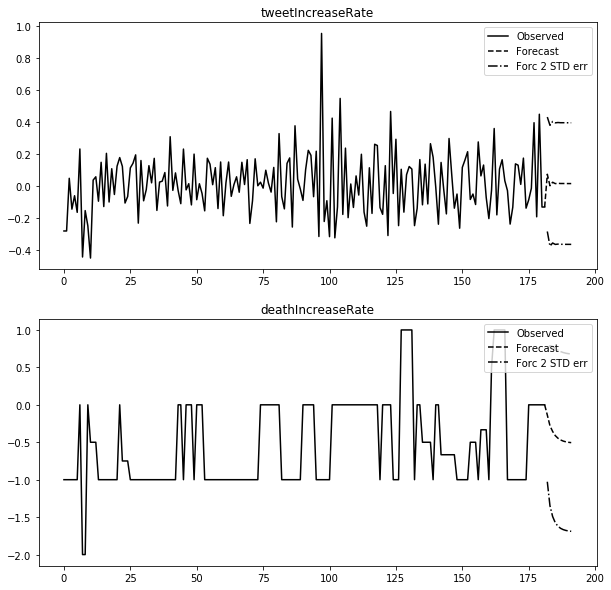

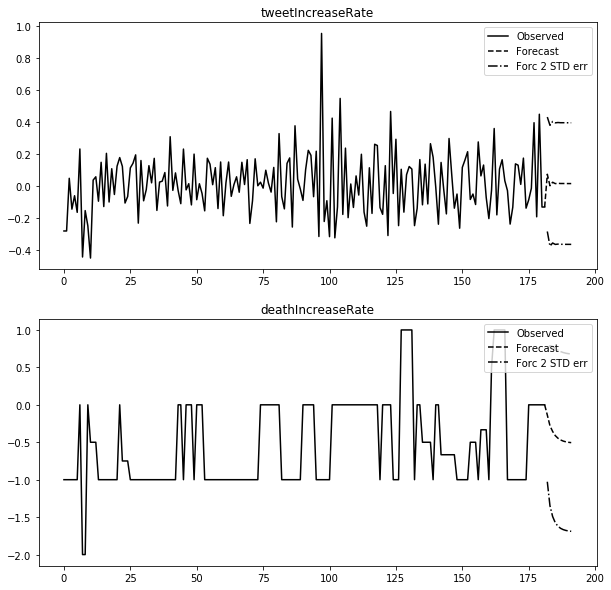

In [452]:
model19_fit.plot_forecast(steps=10)

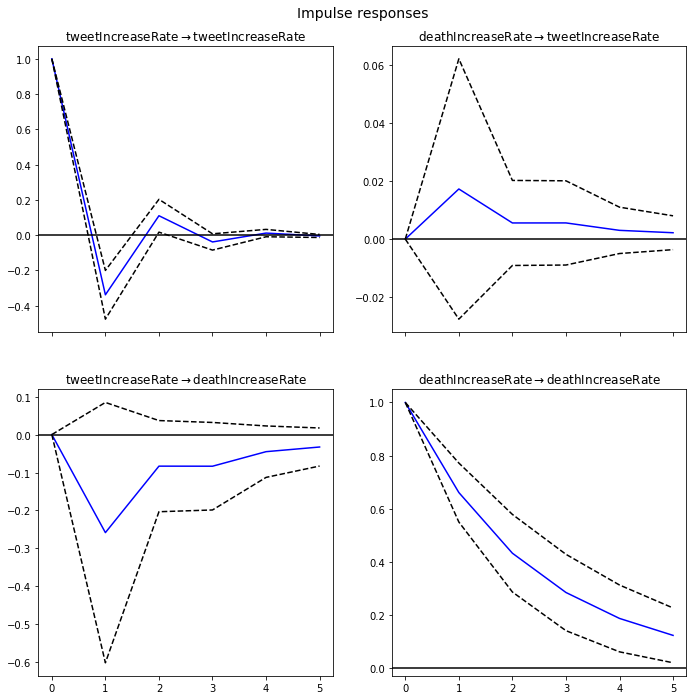

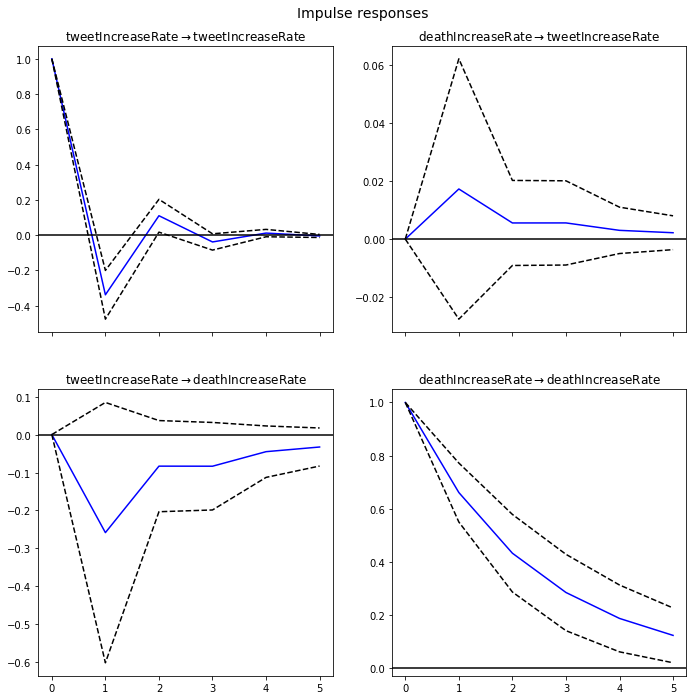

In [455]:
#impulse response function for next 5 days.
irf = model19_fit.irf(5)
irf.plot(orth=False)

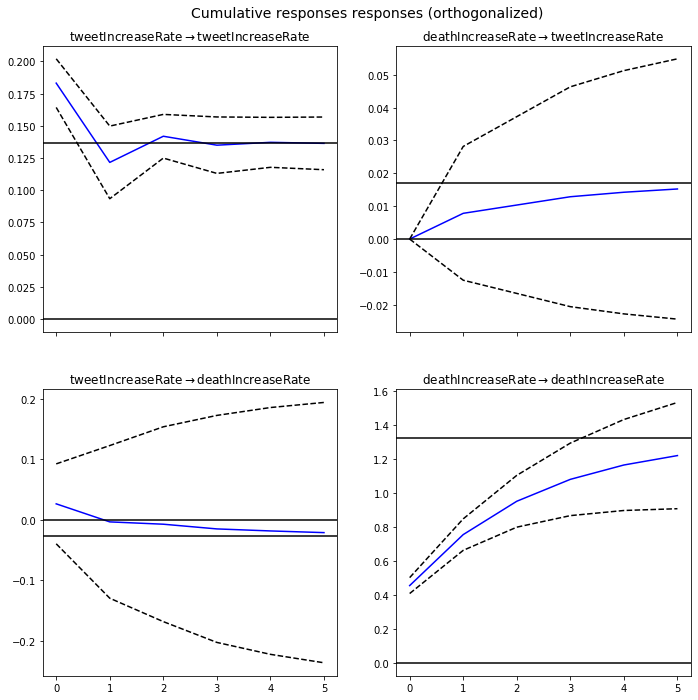

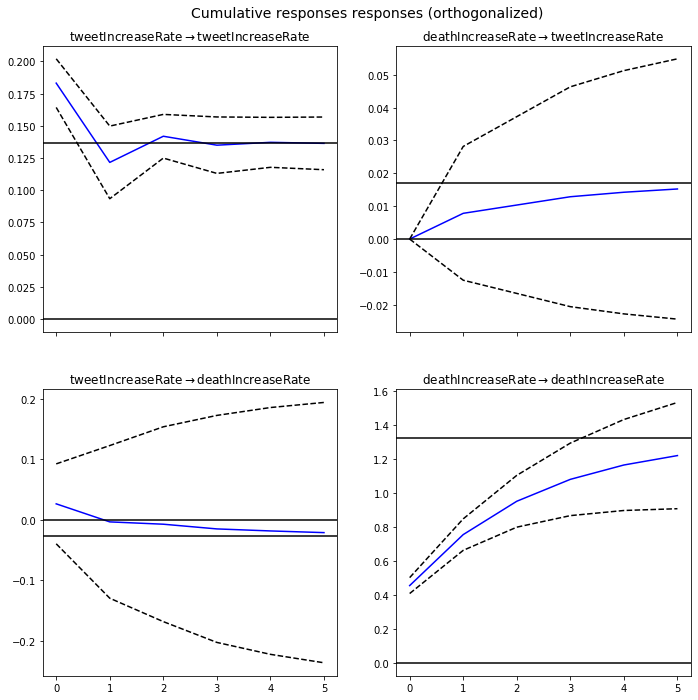

In [456]:
irf.plot_cum_effects(orth=True)

In [457]:
#Grangers causality tweetCount with respect to caseCount
feedBackLoop = model19_fit.test_causality('deathIncreaseRate','tweetIncreaseRate', kind='f')
print(feedBackLoop)

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: tweetIncreaseRate does not Granger-cause deathIncreaseRate: fail to reject at 5% significance level. Test statistic: 2.180, critical value: 3.868>, p-value: 0.141>


In [458]:
#Grangers causality tweetCount with respect to caseCount
feedBackLoop = model19_fit.test_causality('tweetIncreaseRate','deathIncreaseRate', kind='f')
print(feedBackLoop)

<statsmodels.tsa.vector_ar.hypothesis_test_results.CausalityTestResults object. H_0: deathIncreaseRate does not Granger-cause tweetIncreaseRate: fail to reject at 5% significance level. Test statistic: 0.569, critical value: 3.868>, p-value: 0.451>


### Model 20: SFO county Tweet Increase Rate vs Deaths Increase Rate using VECM

#### Cointegration rank

In [459]:
lag_order20 = select_order(tweets_deaths_SFO_df, maxlags=10, deterministic="ci", seasons=4)
lag_order20.summary()

,AIC,BIC,FPE,HQIC
0,-5.143*,-4.886*,0.005841*,-5.039*
1,-5.119,-4.788,0.005982,-4.985
2,-5.113,-4.709,0.006018,-4.949
3,-5.092,-4.614,0.006149,-4.898
4,-5.088,-4.536,0.006179,-4.864
5,-5.096,-4.472,0.006126,-4.843
6,-5.080,-4.382,0.006228,-4.797
7,-5.052,-4.281,0.006410,-4.739
8,-5.023,-4.178,0.006603,-4.681
9,-5.018,-4.099,0.006649,-4.645


In [460]:
vec_rank20 = select_coint_rank(tweets_deaths_SFO_df, det_order = 1, k_ar_diff = 0)
print(vec_rank20.rank)

2


In [462]:
vecm_model20 = VECM(endog = tweets_deaths_SFO_df, k_ar_diff = 0, coint_rank = 2, deterministic = 'ci')
vecm20_fit = vecm_model20.fit()
vecm20_fit.summary()

,coef,std err,z,P>|z|,[0.025,0.975]
ec1,-1.3384,0.070,-19.151,0.000,-1.475,-1.201
ec2,0.0172,0.023,0.761,0.447,-0.027,0.062
,coef,std err,z,P>|z|,[0.025,0.975]
ec1,-0.2583,0.174,-1.489,0.137,-0.598,0.082
ec2,-0.3396,0.056,-6.037,0.000,-0.450,-0.229
,coef,std err,z,P>|z|,[0.025,0.975]
beta.1,1.0000,0,0,0.000,1.000,1.000
beta.2,0,0,0,0.000,0,0
const,-0.0136,0.010,-1.343,0.179,-0.033,0.006
,coef,std err,z,P>|z|,[0.025,0.975]


In [463]:
vecm20_fit.predict(steps=10)

array([[ 7.21842483e-02, -1.36355528e-01],
       [ 2.92729760e-04, -2.79503236e-01],
       [ 2.21503367e-02, -3.55471172e-01],
       [ 1.34445944e-02, -4.11290028e-01],
       [ 1.54279076e-02, -4.45905940e-01],
       [ 1.41599720e-02, -4.69280004e-01],
       [ 1.41859851e-02, -4.84389588e-01],
       [ 1.39166640e-02, -4.94375267e-01],
       [ 1.38356207e-02, -5.00900621e-01],
       [ 1.37505331e-02, -5.05189282e-01]])

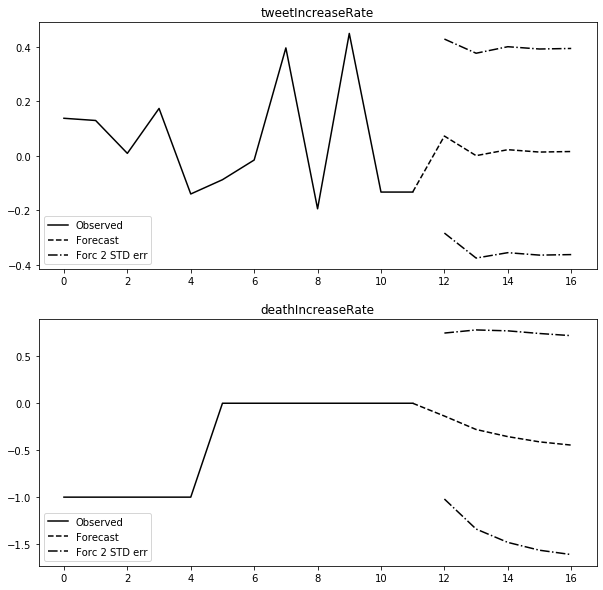

In [464]:
vecm20_fit.plot_forecast(steps=5, n_last_obs=12)

In [465]:
granger_results = vecm20_fit.test_granger_causality(caused="tweetIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
0.3073,3.868,0.580,"(1, 350)"


In [466]:
granger_results = vecm20_fit.test_granger_causality(caused="deathIncreaseRate", signif=0.05)
granger_results.summary()

Test statistic,Critical value,p-value,df
2.947,3.868,0.087,"(1, 350)"


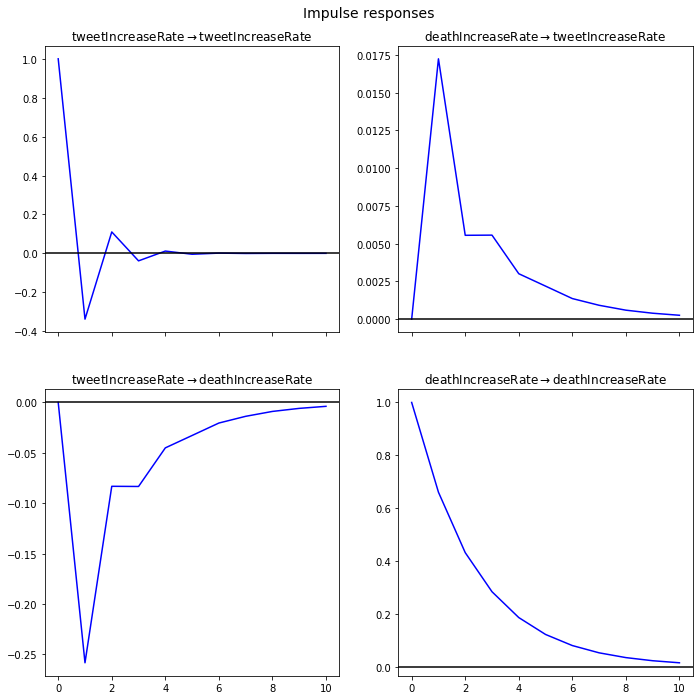

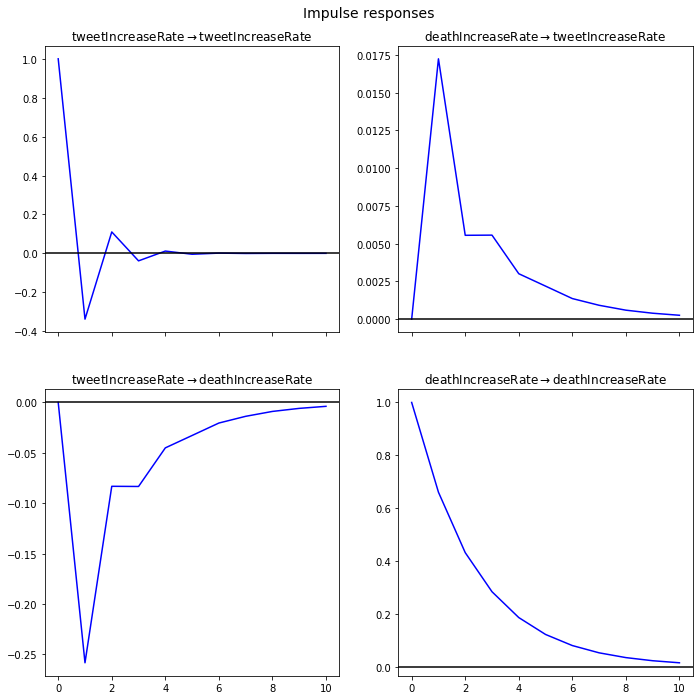

In [467]:
num_periods = 10
ir = vecm20_fit.irf(periods=num_periods)
ir.plot(plot_stderr=False)